# Imports

In [8]:
import yaml
import pypsa
import warnings
import matplotlib.pyplot as plt
import geopandas as gpd
import numpy as np
import pandas as pd
from pathlib import Path
import seaborn as sns
from datetime import datetime
from cartopy import crs as ccrs
from pypsa.plot import add_legend_circles, add_legend_lines, add_legend_patches
import os
import xarray as xr
import cartopy
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import StrMethodFormatter
import os
import sys

In [9]:
import yaml

PARENT = "../../"
config = yaml.safe_load(open(PARENT + "config.default.yaml"))
# load from your config
tech_colors = config["plotting"]["tech_colors"]
nice_names = config["plotting"]["nice_names"]


# Read config.yaml settings:
name = config["run"]["name"]
simpl = config["scenario"]["simpl"]
clusters = config["scenario"]["clusters"]
ll = config["scenario"]["ll"]
opts = config["scenario"]["opts"]

# Ensure elements are strings and properly joined
simpl_str = "_".join(map(str, simpl))
clusters_str = "_".join(map(str, clusters))
ll_str = "_".join(map(str, ll))
opts_str = "_".join(map(str, opts))


scenario_name = name 
scenario_subpath = scenario_name + "/" if scenario_name else ""

# Country shape file
regions_onshore_path = PARENT + f"resources/{scenario_subpath}shapes/country_shapes.geojson"
# Renewable profile file
solar_path = PARENT + f"resources/{scenario_subpath}renewable_profiles/profile_solar.nc"
onwind_path = PARENT + f"resources/{scenario_subpath}renewable_profiles/profile_onwind.nc"

# File setup

In [10]:
nc_file_name = "elec_s_60_ec_lcopt_Co2L-3h_3h_2030_0.05_ASEAN_0export.nc"
results_path = PARENT + f"results/postnetworks/{scenario_subpath}/{nc_file_name}"
network_path = PARENT + f"networks/{scenario_subpath}elec.nc"

In [11]:
#warnings.simplefilter(action='ignore', category=FutureWarning)
n = pypsa.Network(results_path)
regions_onshore = gpd.read_file(regions_onshore_path)
country_coordinates = regions_onshore.total_bounds[[0, 2, 1, 3]]
#warnings.simplefilter(action='default', category=FutureWarning)

Index(['CO2 pipeline BN4 0 <-> MY4 0-2030',
       'CO2 pipeline ID1 0 <-> ID9 0-2030',
       'CO2 pipeline ID9 0 <-> MY2 0-2030',
       'CO2 pipeline ID9 0 <-> SG6 0-2030',
       'CO2 pipeline KH12 0 <-> TH12 0-2030',
       'CO2 pipeline KH8 0 <-> LA8 0-2030',
       'CO2 pipeline LA12 0 <-> TH12 0-2030',
       'CO2 pipeline LA8 0 <-> TH8 0-2030',
       'CO2 pipeline LA8 0 <-> VN8 1-2030',
       'CO2 pipeline LA8 0 <-> VN8 2-2030',
       'CO2 pipeline MM12 0 <-> MM12 4-2030',
       'CO2 pipeline MM12 0 <-> MM12 5-2030',
       'CO2 pipeline MM12 1 <-> MM12 3-2030',
       'CO2 pipeline MM12 1 <-> MM12 4-2030',
       'CO2 pipeline MM12 1 <-> MM12 5-2030',
       'CO2 pipeline MM12 1 <-> MM12 7-2030',
       'CO2 pipeline MM12 2 <-> MM12 5-2030',
       'CO2 pipeline MM12 2 <-> MM12 6-2030',
       'CO2 pipeline MM12 3 <-> MM12 4-2030',
       'CO2 pipeline MM12 4 <-> MM12 5-2030',
       'CO2 pipeline MM12 6 <-> TH12 0-2030',
       'CO2 pipeline MY2 0 <-> MY4 0-2030',
      

# CO2

In [12]:
loads = n.loads.copy()
loads["bus_carrier"] = loads["bus"].map(n.buses["carrier"])
co2 = loads.loc[
    loads["bus_carrier"].str.contains(r"(co2)", case=False, na=False)
]
co2

/tmp/ipykernel_3273856/334094239.py:4: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  loads["bus_carrier"].str.contains(r"(co2)", case=False, na=False)


,bus,carrier,p_set,type,q_set,sign,bus_carrier
Load,,,,,,,
industry oil emissions,co2 atmosphere,industry oil emissions,-8234.652168,,0.0,-1.0,co2
industry coal emissions,co2 atmosphere,industry coal emissions,-24864.557291,,0.0,-1.0,co2
shipping oil emissions,co2 atmosphere,shipping oil emissions,-1831.425880,,0.0,-1.0,co2
aviation oil emissions,co2 atmosphere,oil emissions,-9137.477653,,0.0,-1.0,co2
land transport oil emissions,co2 atmosphere,land transport oil emissions,-30901.753660,,0.0,-1.0,co2
agriculture oil emissions,co2 atmosphere,oil emissions,-3531.303709,,0.0,-1.0,co2
residential oil emissions,co2 atmosphere,oil emissions,-36.998755,,0.0,-1.0,co2
residential gas emissions,co2 atmosphere,gas emissions,-0.199514,,0.0,-1.0,co2
services oil emissions,co2 atmosphere,oil emissions,-1301.384170,,0.0,-1.0,co2


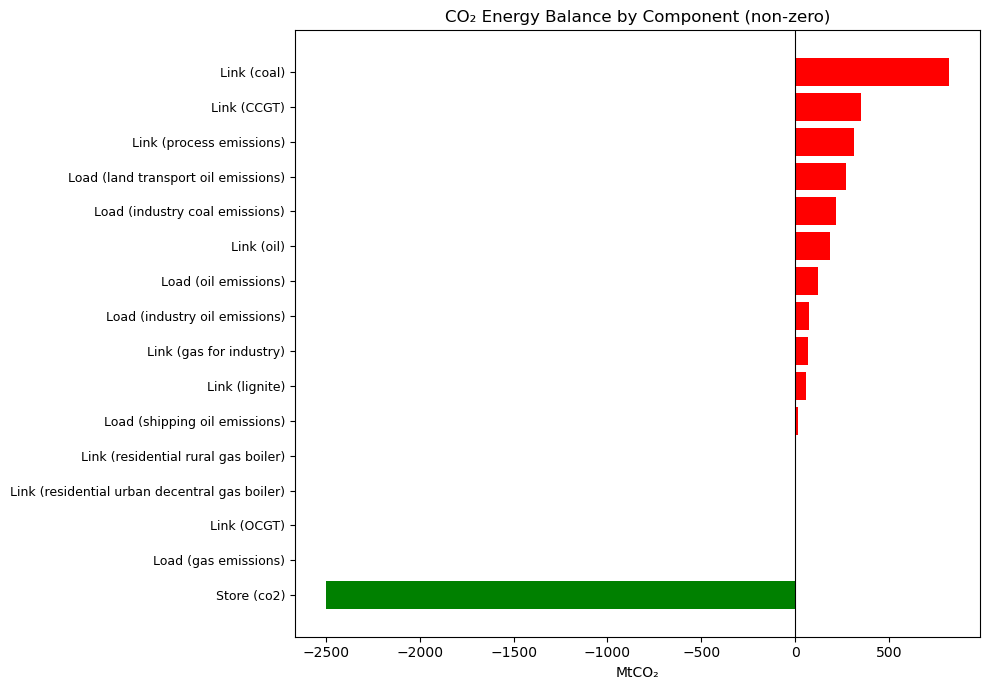

In [13]:
import matplotlib.pyplot as plt

# calculate and filter
balance = (n.statistics.energy_balance(bus_carrier="co2")/1e6).round(2)
balance = balance[balance != 0].sort_values()

# flatten the multiindex into a readable label
df = balance.reset_index()
df.columns = ["component", "carrier", "bus_carrier", "value"]
df["label"] = df["component"] + " (" + df["carrier"] + ")"

# pick colors: sinks green, sources red
colors = ["red" if v > 0 else "green" for v in df["value"]]

# plot
fig, ax = plt.subplots(figsize=(10,7))
ax.barh(df["label"], df["value"], color=colors)

# axis & titles
ax.axvline(0, color="black", linewidth=0.8)
ax.set_xlabel("MtCO₂")
ax.set_title("CO₂ Energy Balance by Component (non-zero)")

# make labels nicer
plt.xticks(fontsize=10)
plt.yticks(fontsize=9)
plt.tight_layout()
plt.show()


In [14]:
balance

component  carrier                                 bus_carrier
Store      co2                                     co2           -2500.00
Load       gas emissions                           co2               0.90
Link       OCGT                                    co2               1.75
           residential urban decentral gas boiler  co2               2.82
           residential rural gas boiler            co2               2.99
Load       shipping oil emissions                  co2              16.04
Link       lignite                                 co2              59.33
           gas for industry                        co2              70.19
Load       industry oil emissions                  co2              72.14
           oil emissions                           co2             122.70
Link       oil                                     co2             185.03
Load       industry coal emissions                 co2             217.81
           land transport oil emissions          

In [15]:
n.loads.query("carrier.str.contains('process')").sum()

bus        process emissionsprocess emissionsprocess emis...
carrier    process emissionsprocess emissionsprocess emis...
p_set                                          -35504.383929
type                                                        
q_set                                                    0.0
sign                                                   -57.0
dtype: object

In [16]:
# inspect all global constraints
print(n.global_constraints[["type","carrier_attribute","sense","constant"]])

# typical CO2 row shows type='primary energy', carrier_attribute='co2_emissions'


                            type carrier_attribute sense      constant
GlobalConstraint                                                      
CO2Limit          primary energy     co2_emissions    <=  2.500000e+09


In [17]:
n.global_constraints

,sense,type,constant,investment_period,carrier_attribute,mu
GlobalConstraint,,,,,,
CO2Limit,<=,primary energy,2.500000e+09,NaN,co2_emissions,0.0


# Curtailment and Load Shedding

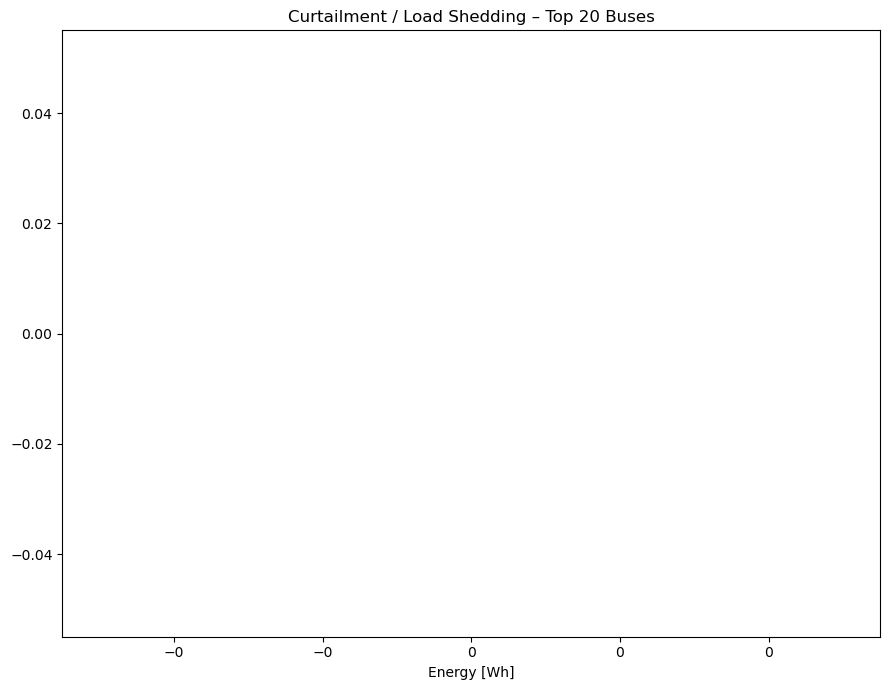

,energy_MWh,bus,carrier,energy
Generator,,,,


In [18]:

# --- energy per generator (your code, kept) ---
gen = n.generators
ts  = n.generators_t.p
mask = gen.carrier.isin(["curtailment", "load_shedding"])
cols = gen.index[mask]
w = n.snapshot_weightings.generators
energy_MWh = ts[cols].multiply(w, axis=0).sum()

info = gen.loc[cols, ["bus", "carrier"]]
df = pd.DataFrame({"energy_MWh": energy_MWh}).join(info)

# force Wh
df["energy"] = df["energy_MWh"] * 1e6
unit = "Wh"

# --- group top N ---
N = 20
by_bus_carrier = (
    df.groupby(["bus","carrier"])["energy"]
      .sum()
      .sort_values(ascending=False)
      .head(N)
      .sort_values()
)

labels = [f"{b} – {c}" for (b,c) in by_bus_carrier.index]

fig, ax = plt.subplots(figsize=(9,7))
ax.barh(labels, by_bus_carrier.values)
ax.set_xlabel(f"Energy [{unit}]")
ax.set_title(f"Curtailment / Load Shedding – Top {N} Buses")
ax.xaxis.set_major_formatter(StrMethodFormatter("{x:,.0f}"))
plt.tight_layout()
plt.show()

display(df)#.head())


In [19]:
# --- aggregate load shedding per node ---
node_df = (
    df.groupby("bus", as_index=False)
      .agg({"energy": "sum"})
      .sort_values("energy", ascending=False)
)

display(node_df.head())



,bus,energy


In [20]:
# --- aggregate load shedding (and curtailment) per bus, accounting for snapshot weighting ---

import pandas as pd

# get snapshot weights (hours)
w = getattr(n.snapshot_weightings, "generators", n.snapshot_weightings)

# select only curtailment + load_shedding generators
gen = n.generators
ts  = n.generators_t.p
mask = gen.carrier.isin(["curtailment", "load_shedding"])
cols = gen.index[mask]

# compute energy = MW * hours = MWh
energy_MWh = ts[cols].multiply(w, axis=0).sum()

# attach bus + carrier info
info = gen.loc[cols, ["bus", "carrier"]]
df = pd.DataFrame({"energy_MWh": energy_MWh}).join(info)

# --- aggregate by bus ---
node_df = (
    df.groupby("bus", as_index=False)
      .agg({"energy_MWh": "sum"})
      .sort_values("energy_MWh", ascending=False)
      .rename(columns={"energy_MWh": "energy [MWh]"})
)

# if you prefer GWh instead:
# node_df["energy [GWh]"] = node_df["energy [MWh]"] / 1e3

display(node_df.head(20))


,bus,energy [MWh]


In [21]:
# === ONE-CELL: curtailment / load-shedding diagnosis (PyPSA / PyPSA-Earth) ===
import pandas as pd, numpy as np

# ---------- helpers ----------
def _weights(n):
    return getattr(n.snapshot_weightings, "generators", n.snapshot_weightings)

def _energy_mwh(df_or_ser, w):
    # convert MW time series to MWh with snapshot weights
    return df_or_ser.multiply(w, axis=0).sum()

def _pretty_top(s, k=20):
    s = s.copy().fillna(0.0)
    return s[s>0].sort_values(ascending=False).head(k).round(3)

# ---------- precompute ----------
w = _weights(n)

gen = n.generators
gt_p = n.generators_t.p
gt_pmaxpu = getattr(n.generators_t, "p_max_pu", pd.DataFrame(index=n.snapshots, columns=[]))

# curtailment: ONLY for generators that actually have p_max_pu (VRE etc.), excluding synthetic carriers
vre_cols = gt_pmaxpu.columns
gen_vre = gen[gen.index.isin(vre_cols) & ~gen.carrier.isin(["load_shedding","curtailment"])]

pot = gt_pmaxpu[gen_vre.index].multiply(gen_vre.p_nom, axis=1).fillna(0.0)  # MW
act = gt_p[gen_vre.index].fillna(0.0)                                       # MW
curt_gen_MWh = _energy_mwh(pot.sub(act).clip(lower=0.0), w)                 # MWh

curt_bus_MWh = (
    pd.DataFrame({"bus": gen_vre.bus, "curt_MWh": curt_gen_MWh})
    .groupby("bus")["curt_MWh"].sum()
)

# load shedding energy by generator and by bus
shed_gen = gen[gen.carrier=="load_shedding"]
shed_gen_MWh = _energy_mwh(gt_p[shed_gen.index].fillna(0.0), w)
shed_bus_MWh = (
    pd.DataFrame({"bus": shed_gen.bus, "shed_MWh": shed_gen_MWh})
    .groupby("bus")["shed_MWh"].sum()
)

print("\n=== Top curtailment buses [MWh] ===\n", _pretty_top(curt_bus_MWh))
print("\n=== Top load shedding buses [MWh] ===\n", _pretty_top(shed_bus_MWh))

# ---------- diagnosis function ----------
def diagnose_bus(bus_name, top_branches=8, show_generators=12):
    print("\n" + "="*86)
    print(f"DIAGNOSIS for bus: {bus_name}")
    print("="*86)

    curt_E = float(curt_bus_MWh.get(bus_name, 0.0))
    shed_E = float(shed_bus_MWh.get(bus_name, 0.0))
    print(f"\nEnergy totals at {bus_name}:  curtailment = {curt_E:.3f} MWh | load_shedding = {shed_E:.3f} MWh")

    # marginal price series (if available)
    mp = None
    if hasattr(n, "buses_t") and hasattr(n.buses_t, "marginal_price"):
        try:
            mp = n.buses_t.marginal_price[bus_name]
        except Exception:
            mp = None
    if mp is not None and mp.notna().any():
        print("\nNodal marginal price [€/MWh] stats:")
        print(mp.describe(percentiles=[.05,.25,.5,.75,.95]).round(3))
    else:
        print("\nNo marginal price series found for this bus or network version.")

    # find worst shedding snapshot at this bus (if any)
    worst_t = None
    try:
        gs_here = shed_gen.index[shed_gen.bus == bus_name]
        if len(gs_here):
            s = gt_p[gs_here].sum(axis=1)
            if not s.empty:
                worst_t = s.idxmax()
                print(f"\nWorst shedding snapshot: {worst_t} | Shedding there = {s.loc[worst_t]:.3f} MW")
    except Exception:
        pass

    # congestion: lines touching bus
    def _max_loading_lines():
        if n.lines.empty: return pd.Series(dtype=float)
        mask = (n.lines.bus0==bus_name) | (n.lines.bus1==bus_name)
        ids = n.lines.index[mask]
        if len(ids)==0: return pd.Series(dtype=float)
        p0 = n.lines_t.p0[ids].abs().max()
        p1 = n.lines_t.p1[ids].abs().max()
        flow = pd.concat([p0,p1], axis=1).max(axis=1)  # MW
        denom = n.lines.loc[ids, "s_nom"].replace(0, np.nan)  # MVA~MW (DC lines also stored here in PyPSA-Earth)
        return (flow / denom).sort_values(ascending=False)

    def _max_loading_links():
        if n.links.empty: return pd.Series(dtype=float)
        mask = (n.links.bus0==bus_name) | (n.links.bus1==bus_name)
        ids = n.links.index[mask]
        if len(ids)==0: return pd.Series(dtype=float)
        p0 = n.links_t.p0[ids].abs().max()
        p1 = n.links_t.p1[ids].abs().max()
        flow = pd.concat([p0,p1], axis=1).max(axis=1)  # MW
        denom = n.links.loc[ids, "p_nom"].replace(0, np.nan) # MW
        return (flow / denom).sort_values(ascending=False)

    Llines = _max_loading_lines().head(top_branches)
    Llinks = _max_loading_links().head(top_branches)

    if not Llines.empty:
        print("\nNearby AC/DC lines max loading (ratio of s_nom) — top:")
        print(Llines.round(3))
    else:
        print("\nNo adjacent lines or no loading data for lines.")

    if not Llinks.empty:
        print("\nNearby Links max loading (ratio of p_nom) — top:")
        print(Llinks.round(3))
    else:
        print("\nNo adjacent links or no loading data for links.")

    # storage state at worst shedding snapshot
    if worst_t is not None:
        stores_here = n.stores[n.stores.bus == bus_name]
        if not stores_here.empty:
            soc = n.stores_t.e[stores_here.index].loc[worst_t]
            meta = stores_here[["carrier","e_nom","p_nom"]].copy()
            meta["SOC_at_worst_t"] = soc
            print("\nStores on this bus and SOC at worst shedding snapshot:")
            print(meta.sort_values("carrier"))
        else:
            print("\nNo stores on this bus.")

    # local curtailment breakdown by generator
    gens_here = gen_vre[gen_vre.bus == bus_name]
    if not gens_here.empty:
        pot_h = gt_pmaxpu[gens_here.index].multiply(gens_here.p_nom, axis=1).fillna(0.0)
        act_h = gt_p[gens_here.index].fillna(0.0)
        Ecurt = _energy_mwh(pot_h.sub(act_h).clip(lower=0.0), w).sort_values(ascending=False)
        print(f"\nCurtailment breakdown by generator at {bus_name} [MWh] (top {show_generators}):")
        print(Ecurt.head(show_generators).round(3))
    else:
        print("\nNo VRE generators connected to this bus (or none with p_max_pu).")

    # global constraints (e.g., CO2) duals
    if hasattr(n, "global_constraints") and not n.global_constraints.empty:
        mus = getattr(n.global_constraints, "mu", None)
        if mus is None:
            # some PyPSA versions store duals separately
            mus = getattr(n, "global_constraints_mu", pd.Series(dtype=float))
        print("\nGlobal constraints (nonzero duals suggest binding):")
        df = n.global_constraints.copy()
        if isinstance(mus, pd.Series):
            df = df.assign(mu=mus)
        print(df.loc[:, [c for c in ["carrier_attribute","sense","constant","mu"] if c in df.columns]])
    else:
        print("\nNo global constraints table found.")

    print("\n--- quick heuristics ---")
    print("* Loading ~1.0 => transmission / conversion bottleneck.")
    print("* Stores SOC ~ e_nom at worst t => saturated (can’t absorb); SOC ~ 0 => empty/lack of supply.")
    print("* Positive global-constraint duals (e.g., CO₂) => system-wide scarcity driving shedding.")
    print("* Curtailment + shedding in same area => likely congestion between surplus and demand.")

# ---------- run diagnoses for your list ----------
buses_to_check = [
    "process emissions",
    "TH42 0 H2",
    "MM12 0",
    "SG6 0",
    "KH8 0",
]
for b in buses_to_check:
    diagnose_bus(b)




=== Top curtailment buses [MWh] ===
 bus
VN8 1     1054334.730
PH13 0      97669.366
MY7 0       50973.198
VN8 2       33928.849
KH8 0       30953.914
MY2 0       24509.639
LA8 0       10858.449
PH15 0      10687.072
MM12 4       6279.721
MM12 3       5329.629
ID25 0       5108.705
ID30 0       4351.930
MM12 1       3920.092
KH12 0       3109.895
ID26 0       2786.065
ID31 0       2712.800
ID23 0       2683.341
ID1 0        2587.074
SG43 0       2284.750
MM12 5       2159.282
Name: curt_MWh, dtype: float64

=== Top load shedding buses [MWh] ===
 Series([], Name: shed_MWh, dtype: float64)

DIAGNOSIS for bus: process emissions

Energy totals at process emissions:  curtailment = 0.000 MWh | load_shedding = 0.000 MWh

Nodal marginal price [€/MWh] stats:
count    2920.000
mean      -31.497
std         0.000
min       -31.497
5%        -31.497
25%       -31.497
50%       -31.497
75%       -31.497
95%       -31.497
max       -31.497
Name: process emissions, dtype: float64

No adjacent lines 

In [22]:
import pandas as pd
import numpy as np

# snapshot weights
w = getattr(n.snapshot_weightings, "generators", n.snapshot_weightings)

# isolate synthetic infeasibility generators
gen = n.generators
mask = gen.carrier.isin(["curtailment", "load_shedding"])
cols = gen.index[mask]

if len(cols) == 0:
    print("✅ no curtailment or load_shedding generators exist in the system.")
else:
    ts = n.generators_t.p[cols]
    energy_MWh = ts.multiply(w, axis=0).sum()  # MW * h
    info = gen.loc[cols, ["bus", "carrier"]]
    df = pd.DataFrame({"energy_MWh": energy_MWh}).join(info)

    # set numerical threshold (e.g. 1e-3 MWh = 1 kWh)
    tol = 1e-3
    df["flag_exceeds_tol"] = df["energy_MWh"].abs() > tol

    total = df["energy_MWh"].sum()
    worst = df.loc[df["energy_MWh"].abs().idxmax()]

    print(f"=== load_shedding / curtailment sanity check ===")
    print(f"total synthetic energy = {total:.6f} MWh")
    print(f"max single value = {worst['energy_MWh']:.6f} MWh at {worst.name} ({worst.carrier})")
    print(f"tolerance = {tol} MWh")
    print()

    if df["flag_exceeds_tol"].any():
        print("⚠️ WARNING: nonzero synthetic generation detected above tolerance!")
        display(df[df["flag_exceeds_tol"]].sort_values("energy_MWh", ascending=False))
    else:
        print("✅ all synthetic 'curtailment' and 'load_shedding' generators are zero within tolerance.")


✅ no curtailment or load_shedding generators exist in the system.


In [23]:
# === root-cause diagnostic for nonzero synthetic curtailment / shedding ===
import numpy as np

# find which synthetic generators produced energy
nonzero = df[df["energy_MWh"].abs() > 1e-6]
if nonzero.empty:
    print("no synthetic curtailment/load shedding detected — system fully feasible.")
else:
    print("nonzero synthetic curtailment/load shedding detected!")
    display(nonzero)

    for idx, row in nonzero.iterrows():
        bus, carrier, E = row["bus"], row["carrier"], row["energy_MWh"]
        print(f"\n===== Diagnostic for {carrier} at bus '{bus}' =====")
        print(f"Produced {E:.6f} MWh")

        # check if bus is isolated
        connected_lines = n.lines[(n.lines.bus0 == bus) | (n.lines.bus1 == bus)]
        connected_links = n.links[(n.links.bus0 == bus) | (n.links.bus1 == bus)]
        if connected_lines.empty and connected_links.empty:
            print("Bus appears ISOLATED — no connected lines or links.")
        else:
            print(f"Lines connected: {len(connected_lines)}, Links connected: {len(connected_links)}")

        # check if there is any load or generator on that bus
        n_loads = n.loads[n.loads.bus == bus]
        n_gens = n.generators[n.generators.bus == bus]
        n_stores = n.stores[n.stores.bus == bus]
        print(f"Loads: {len(n_loads)}, Generators: {len(n_gens)}, Stores: {len(n_stores)}")

        # check if nodal balance might be impossible
        if n_loads.empty and n_gens.empty and n_stores.empty:
            print("No loads/generators/stores attached — dummy gen balancing empty bus.")
        else:
            print("Bus has storage/loads/generators.")

       


no synthetic curtailment/load shedding detected — system fully feasible.


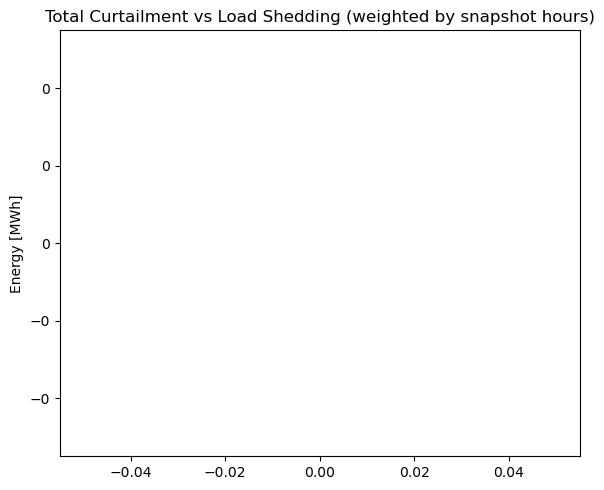

Series([], Name: energy_MWh, dtype: float64)

In [24]:
# --- aggregate curtailment / load shedding by carrier, accounting for snapshot weighting ---

import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import StrMethodFormatter

# get snapshot weights (hours) — same as used elsewhere
w = getattr(n.snapshot_weightings, "generators", n.snapshot_weightings)

# compute energy [MWh] = MW * h, then group by carrier
gen = n.generators
ts  = n.generators_t.p
mask = gen.carrier.isin(["curtailment", "load_shedding"])
cols = gen.index[mask]

# multiply time series by weights (hours) to get MWh
energy_MWh = ts[cols].multiply(w, axis=0).sum()

info = gen.loc[cols, ["bus", "carrier"]]
df = pd.DataFrame({"energy_MWh": energy_MWh}).join(info)

# --- aggregate by carrier only ---
by_carrier = (
    df.groupby("carrier")["energy_MWh"]
      .sum()
      .sort_values(ascending=False)
)

fig, ax = plt.subplots(figsize=(6,5))
ax.bar(by_carrier.index, by_carrier.values)
ax.set_ylabel("Energy [MWh]")
ax.set_title("Total Curtailment vs Load Shedding (weighted by snapshot hours)")
ax.yaxis.set_major_formatter(StrMethodFormatter("{x:,.0f}"))
plt.tight_layout()
plt.show()

display(by_carrier)


# Energy diagrams

In [25]:
import pandas as pd

def balance_table(n, unit="GWh"):
    out = []
    for bc in map(str, n.buses.carrier.unique()):
        s = n.statistics.energy_balance(bus_carrier=bc)
        if s is None or len(s) == 0:
            continue
        df = s.rename("MWh").reset_index()
        out.append(df)
    if not out:
        return pd.DataFrame(columns=["component","carrier","bus_carrier","value","unit","label"])

    df = pd.concat(out, ignore_index=True)

    # convert units
    scale = {"Wh":1e6, "kWh":1e3, "MWh":1.0, "GWh":1e-3, "TWh":1e-6}[unit]
    df["value"] = df["MWh"] * scale
    df["unit"]  = unit

    # drop zeros
    df = df[df["value"] != 0]

    # nicer label
    df["label"] = df["component"] + " - " + df["carrier"] + " [" + df["bus_carrier"] + "]"

    # reorder columns
    df = df[["label","component","carrier","bus_carrier","value","unit"]].sort_values("value")

    return df

# usage
df_bal = balance_table(n, unit="TWh")
df_bal


,label,component,carrier,bus_carrier,value,unit
70,Store - co2 [co2],Store,co2,co2,-2500.000000,TWh
108,Link - coal [coal],Link,coal,coal,-2435.060075,TWh
22,Link - electricity distribution grid [AC],Link,electricity distribution grid,AC,-1847.776601,TWh
83,Link - CCGT [gas],Link,CCGT,gas,-1758.414165,TWh
14,Link - H2 Electrolysis [AC],Link,H2 Electrolysis,AC,-1347.318067,TWh
...,...,...,...,...,...,...
107,Generator - coal [coal],Generator,coal,coal,1122.966611,TWh
109,Store - coal [coal],Store,coal,coal,1312.093464,TWh
222,Link - electricity distribution grid [low volt...,Link,electricity distribution grid,low voltage,1847.794573,TWh
82,Generator - gas [gas],Generator,gas,gas,2155.614802,TWh


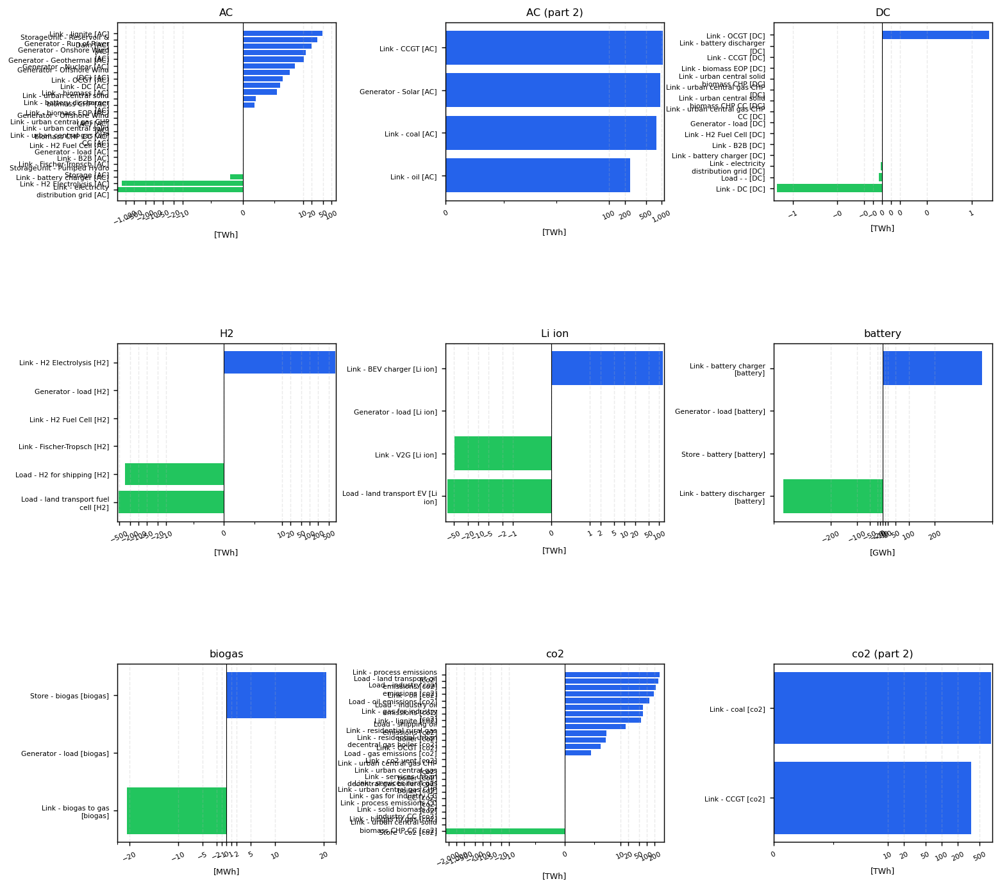

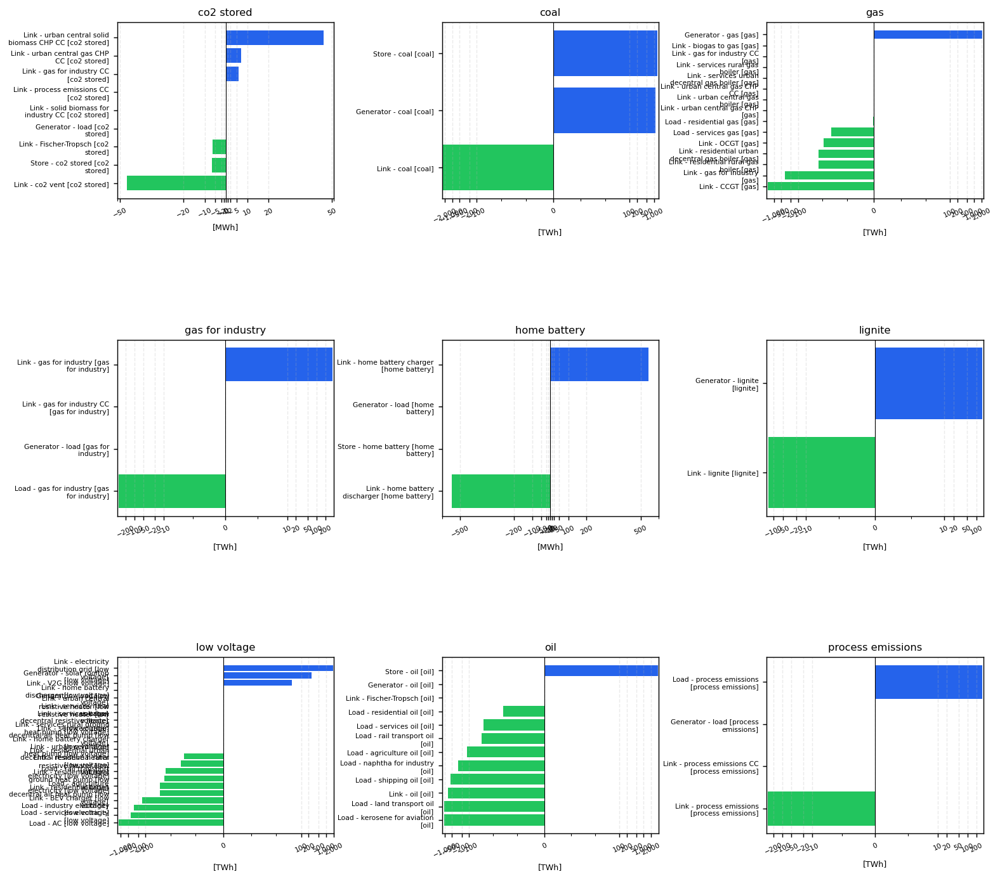

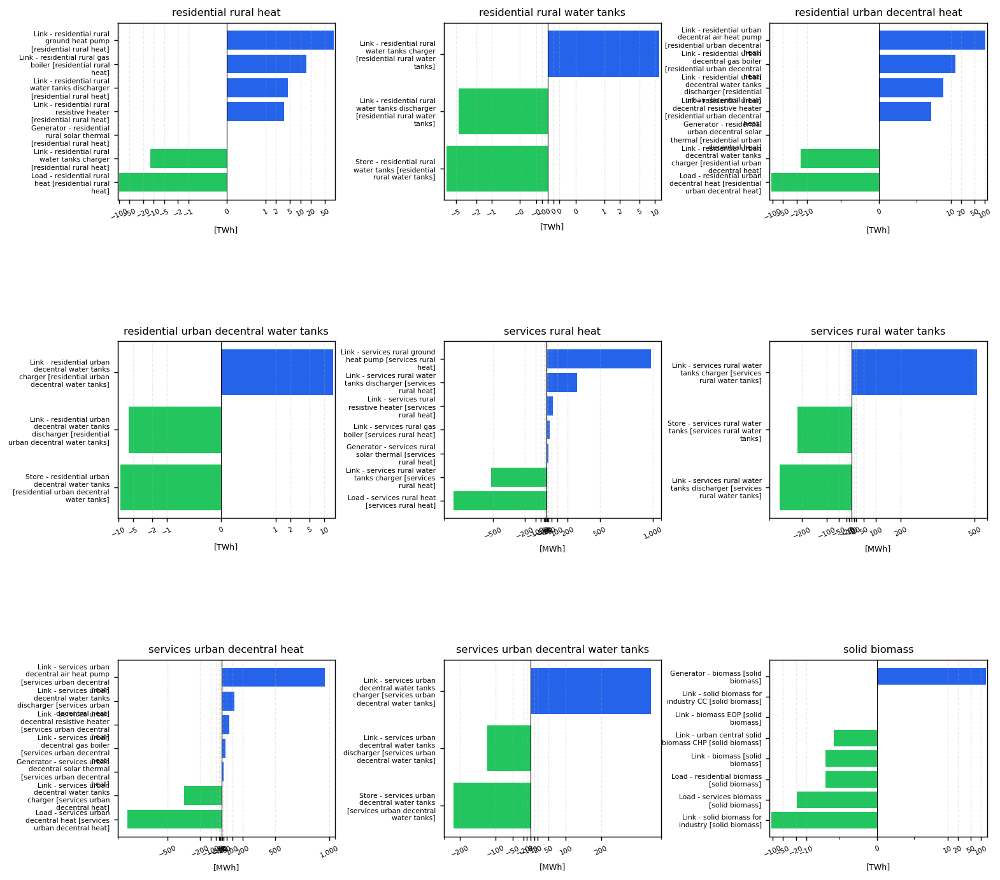

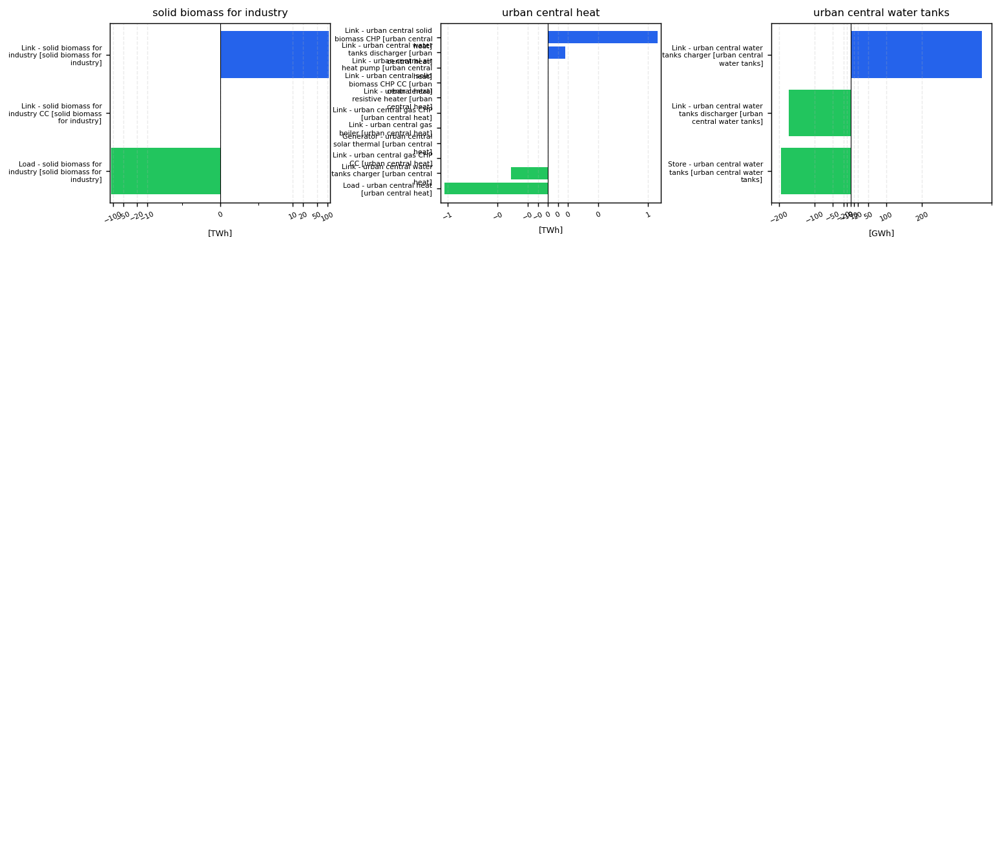

In [26]:
import math, numpy as np, pandas as pd, matplotlib.pyplot as plt
from matplotlib.ticker import StrMethodFormatter
import textwrap

def _to_MWh(unit):
    return {"Wh":1e-6, "kWh":1e-3, "MWh":1.0, "GWh":1e3, "TWh":1e6}.get(unit, 1.0)

def _best_unit_from_MWh(mx_MWh):
    if   mx_MWh >= 1e6: return 1e-6, "TWh"
    elif mx_MWh >= 1e3: return 1e-3, "GWh"
    elif mx_MWh >= 1:   return 1.0,  "MWh"
    else:               return 1e3,  "kWh"

def _wrap(s, width=20):
    return "\n".join(textwrap.wrap(str(s), width=width, break_long_words=False))

def _nice_symlog_ticks(vmin, vmax):
    if vmin == vmax: return [vmin]
    mags = []
    for v in (vmin, vmax):
        if v != 0:
            mags.append(int(np.floor(np.log10(abs(v)))))
    if not mags: return [0]
    lo, hi = min(mags)-1, max(mags)+1
    base = [1, 2, 5]
    ticks = []
    for e in range(lo, hi+1):
        for b in base:
            ticks += [ b*10**e, -b*10**e ]
    ticks += [0]
    ticks = sorted(t for t in ticks if vmin <= t <= vmax)
    return ticks if len(ticks) >= 5 else sorted({vmin, 0.0, vmax})

def plot_df_bal_grid_all(df_bal: pd.DataFrame,
                         rows=3, cols=3,
                         max_rows_per_panel=25,
                         wrap_labels=20,
                         fontsize=8,
                         use_symlog=True):
    df = df_bal[df_bal["value"] != 0].copy()
    if df.empty:
        print("No non-zero rows.")
        return

    buses = sorted(df["bus_carrier"].unique())
    per_fig = rows * cols

    bus_panels = []
    for b in buses:
        sub = df[df.bus_carrier == b].copy()
        sub = sub.sort_values("value")
        for i in range(0, len(sub), max_rows_per_panel):
            bus_panels.append((b, sub.iloc[i:i+max_rows_per_panel].copy(), 1 + i//max_rows_per_panel))
    pages = math.ceil(len(bus_panels) / per_fig)

    for p in range(pages):
        chunk = bus_panels[p*per_fig:(p+1)*per_fig]
        fig, axes = plt.subplots(rows, cols,
                                 figsize=(cols*5, rows*4),  # bigger per panel
                                 dpi=130,
                                 gridspec_kw={'wspace':0.5, 'hspace':0.8})
        axes = np.atleast_2d(axes)

        for idx, (b, sub, partno) in enumerate(chunk):
            ax = axes[idx//cols, idx%cols]
            unit_in = sub["unit"].iloc[0]
            to_mwh  = _to_MWh(unit_in)
            mx_mwh  = sub["value"].abs().max() * to_mwh
            scale_from_mwh, out_unit = _best_unit_from_MWh(mx_mwh)
            scale = to_mwh * scale_from_mwh
            x = sub["value"] * scale

            labels = [_wrap(lab, wrap_labels) for lab in sub["label"]]
            colors = np.where(x >= 0, "#2563eb", "#22c55e")

            ax.barh(labels, x, color=colors)
            ax.axvline(0, color="k", lw=0.6)
            title = b if partno == 1 else f"{b} (part {partno})"
            ax.set_title(title, fontsize=fontsize+2)
            ax.set_xlabel(f"[{out_unit}]", fontsize=fontsize)
            ax.tick_params(axis="y", labelsize=fontsize-1)
            ax.tick_params(axis="x", labelsize=fontsize-1, rotation=25)
            ax.grid(axis="x", linestyle="--", alpha=0.25)

            if use_symlog:
                ax.set_xscale("symlog", linthresh=max(scale*1.0, 1e-12))
                vmin, vmax = ax.get_xlim()
                ticks = _nice_symlog_ticks(vmin, vmax)
                ax.set_xticks(ticks)
                ax.xaxis.set_major_formatter(StrMethodFormatter("{x:,.0f}"))

        for j in range(len(chunk), per_fig):
            axes[j//cols, j%cols].axis("off")

        plt.subplots_adjust(left=0.25, right=0.95, top=0.92, bottom=0.1)
        plt.show()

# df_bal is your 285×6 table
plot_df_bal_grid_all(
    df_bal,
    rows=3, cols=3,                # 3×3 grid per figure
    max_rows_per_panel=25,         # split very long buses across multiple panels
    wrap_labels=28, fontsize=7,
    use_symlog=True                # symlog with real-number ticks
)


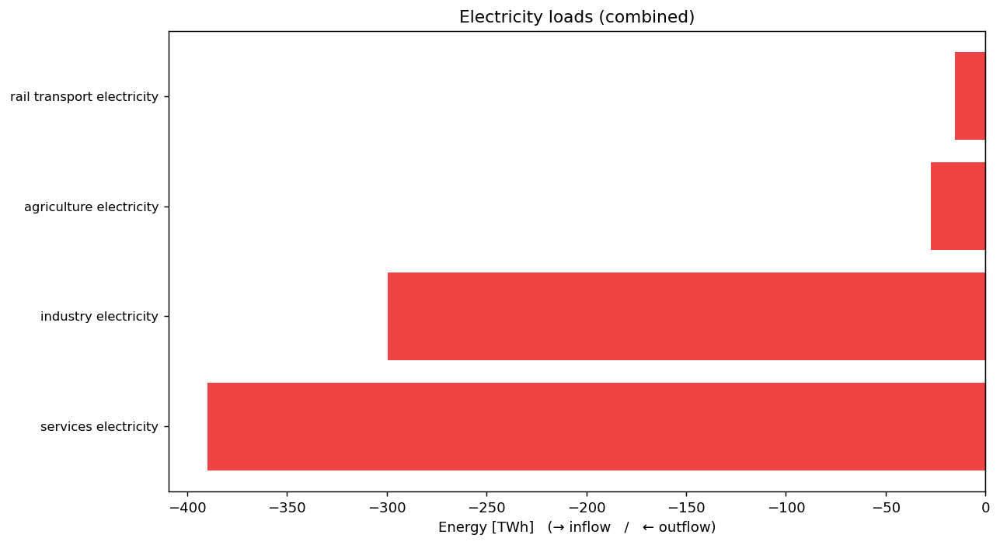

/tmp/ipykernel_3273856/4010626393.py:73: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  fuel_mask = df["carrier"].str.contains(r"(aviation|kerosene|jet|ship|shipping|bunker)", case=False, regex=True)


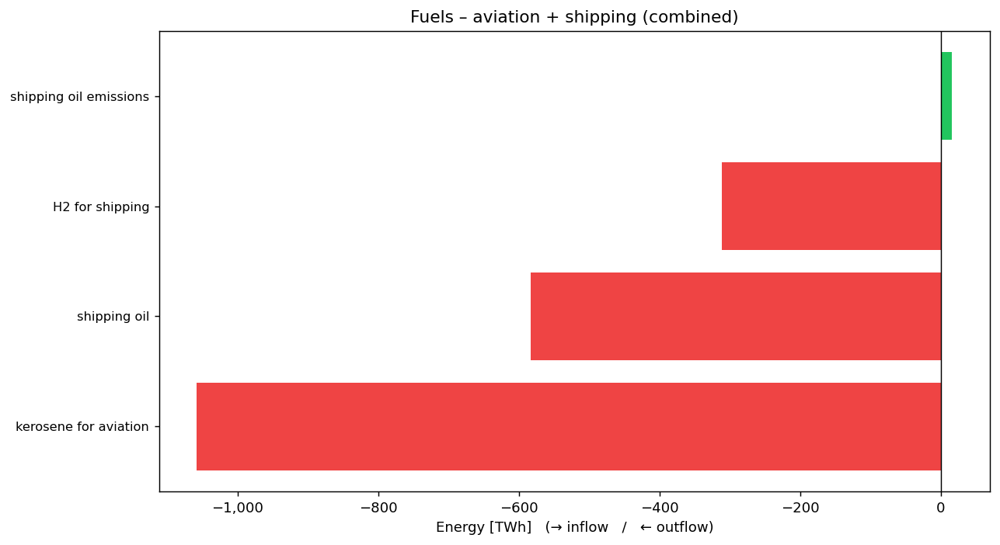

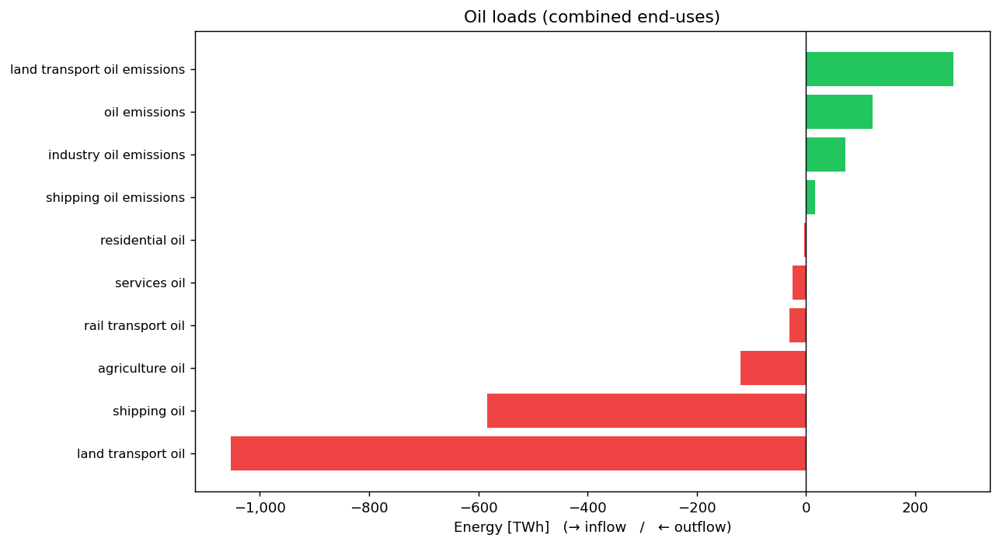

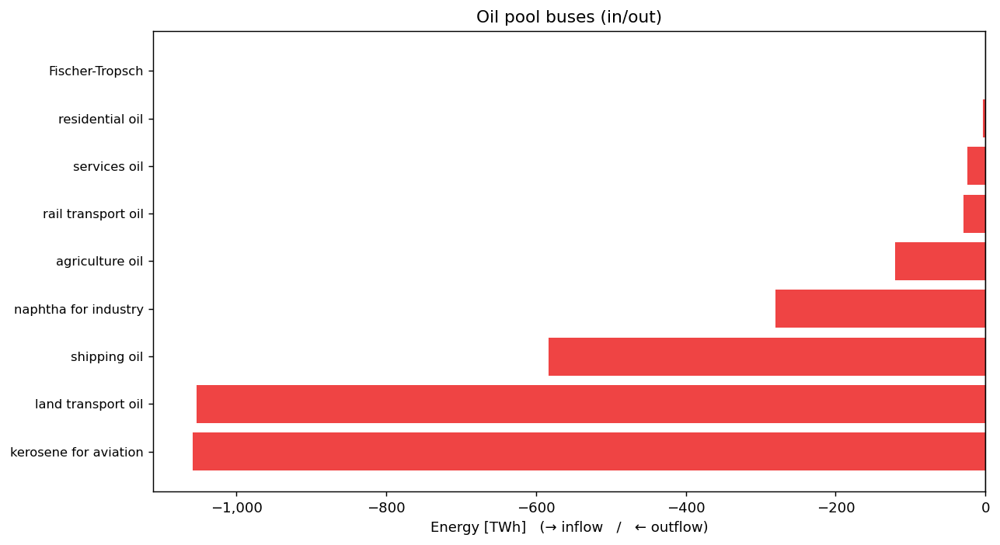

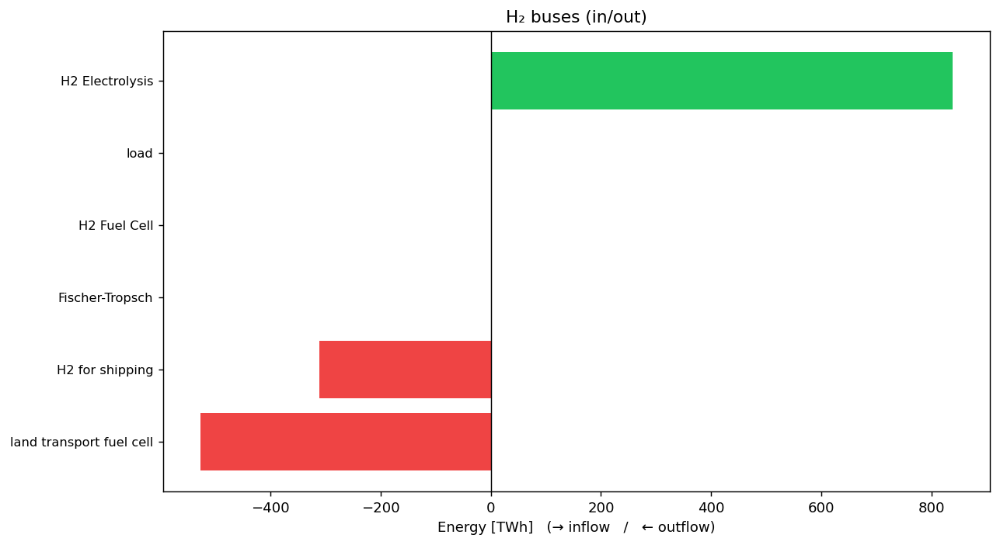

(no data) Transport – EV battery buses (in/out)


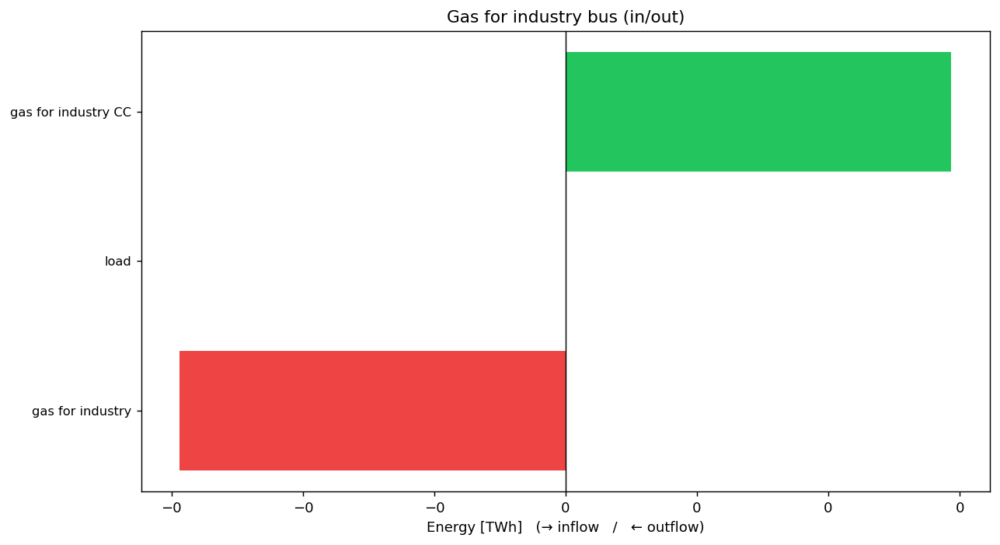

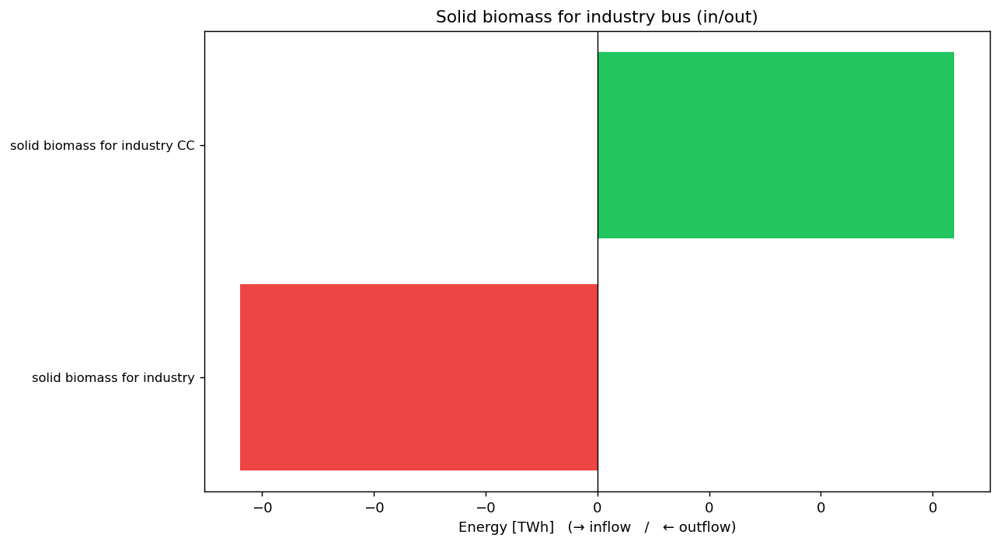

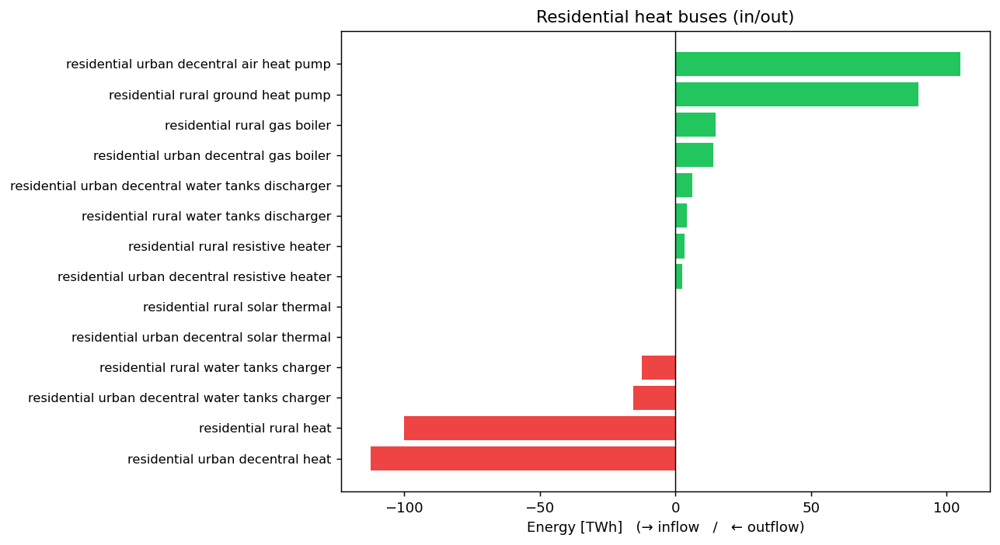

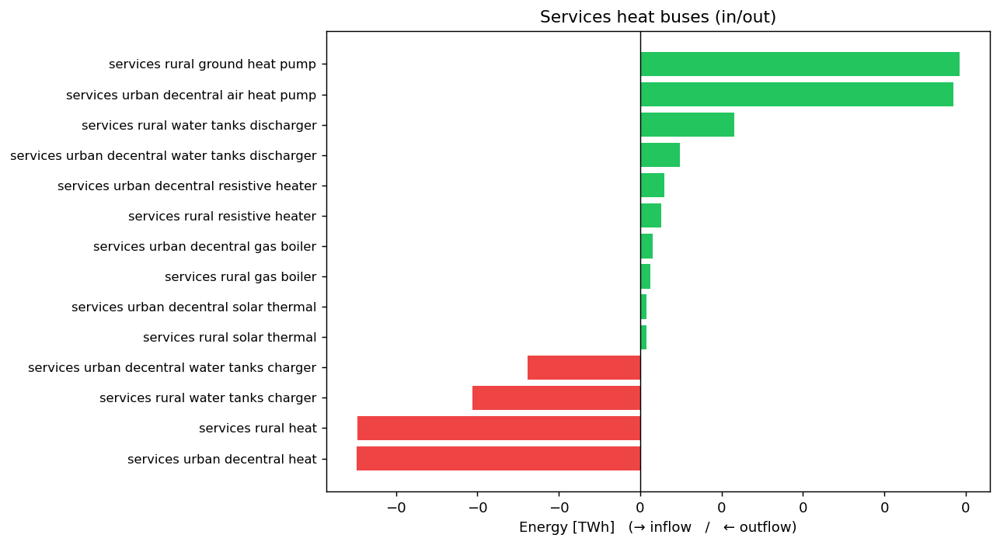

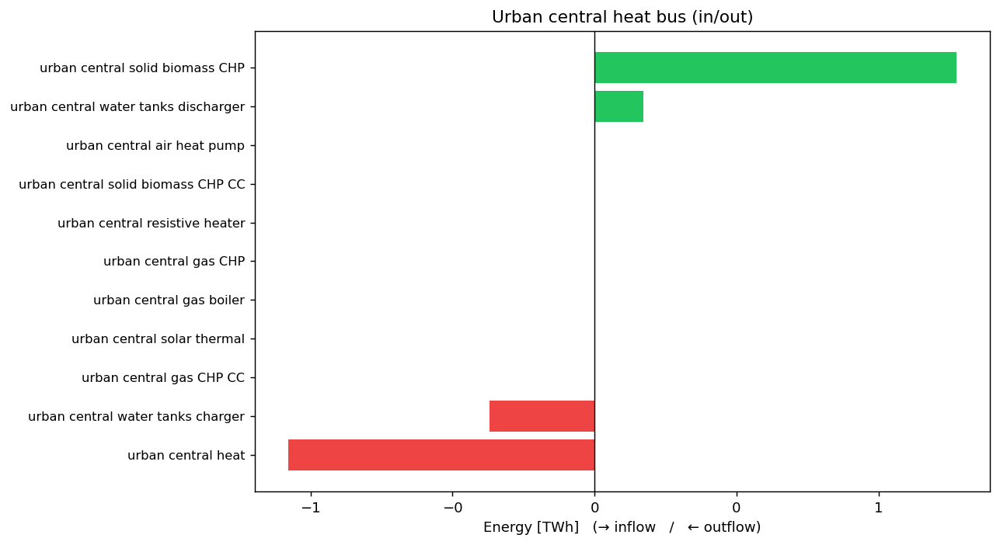

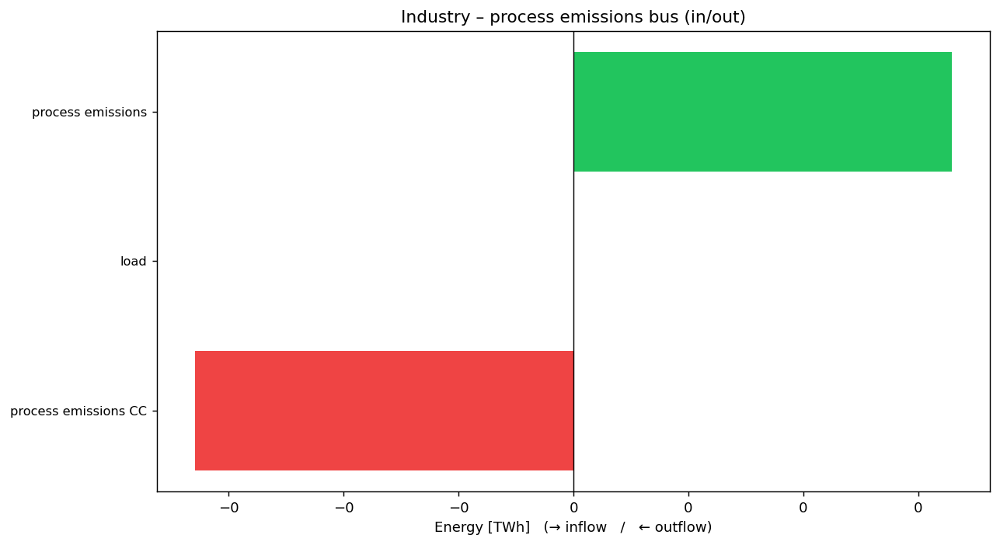

(no data) Agriculture – oil emissions (to CO₂ atmosphere)
(no data) Load shedding used (by bus)


In [27]:
import re, numpy as np, pandas as pd, matplotlib.pyplot as plt
from matplotlib.ticker import StrMethodFormatter

# ---------------- basics ----------------
SCALE_FROM_MWH = {"Wh":1e6, "kWh":1e3, "MWh":1.0, "GWh":1e-3, "TWh":1e-6}

def eb_df(n, aggregate_time="sum"):
    eb = n.statistics.energy_balance(aggregate_time=aggregate_time)
    df = eb.rename("value").to_frame() if isinstance(eb, pd.Series) else eb.copy()
    if not isinstance(df.index, pd.RangeIndex):
        df = df.reset_index()
    if "value" not in df.columns:
        num = df.select_dtypes(include="number").columns
        df = df.rename(columns={ (num[0] if len(num) else "sum") : "value" })
    if "bus" not in df.columns:
        cand = [c for c in df.columns if isinstance(c,str) and "bus" in c.lower()]
        if not cand: raise KeyError("No 'bus' column from energy_balance().")
        df = df.rename(columns={cand[0]:"bus"})
    if "carrier" not in df.columns:
        cand = [c for c in df.columns if isinstance(c,str) and "carrier" in c.lower()]
        df["carrier"] = df[cand[0]] if cand else "(unknown)"
    if "name" not in df.columns: df["name"] = ""
    return df[["bus","carrier","name","value"]]

def plot_inout_horizontal_group(df, mask, title, *,
                                group_col="carrier",
                                unit="TWh",
                                drop_labels=None,
                                drop_zeros=True):
    sub = df[mask].copy()
    if sub.empty:
        print(f"(no data) {title}")
        return

    series = sub.groupby(group_col)["value"].sum()

    if drop_labels:
        series = series[~series.index.isin(drop_labels)]
    if drop_zeros:
        series = series[series != 0]

    if series.empty:
        print(f"(all zero/filtered) {title}")
        return

    series = series.sort_values()                         # negatives (←) first
    scale = SCALE_FROM_MWH.get(unit, 1.0)                 # MWh → target unit
    series = series * scale

    colors = ["#22c55e" if v > 0 else "#ef4444" for v in series.values]
    fig, ax = plt.subplots(figsize=(10, 5.5), dpi=130)
    ax.barh(series.index, series.values, color=colors)
    ax.axvline(0, color="k", lw=0.8)
    ax.set_title(title)
    ax.set_xlabel(f"Energy [{unit}]   (→ inflow   /   ← outflow)")
    ax.xaxis.set_major_formatter(StrMethodFormatter("{x:,.0f}"))
    ax.tick_params(axis="y", labelsize=9)
    plt.tight_layout(); plt.show()

# ---------------- run once ----------------
df = eb_df(n, "sum")

# ---------- COMBINED CHARTS ----------
# electricity loads (industry / rail / agriculture / any *electricity)
elec_mask = df["carrier"].str.contains(r"\belectricity\b", case=False, regex=True)
plot_inout_horizontal_group(
    df, elec_mask,
    "Electricity loads (combined)",
    unit="TWh", group_col="carrier"
)

# aviation + shipping fuels (combined)
fuel_mask = df["carrier"].str.contains(r"(aviation|kerosene|jet|ship|shipping|bunker)", case=False, regex=True)
plot_inout_horizontal_group(
    df, fuel_mask,
    "Fuels – aviation + shipping (combined)",
    unit="TWh", group_col="carrier"
)

# oil loads (combined end-uses) — drop the naked 'oil' pool carrier
oil_loads_mask = df["carrier"].str.contains(r"\boil\b", case=False, regex=True)
plot_inout_horizontal_group(
    df, oil_loads_mask,
    "Oil loads (combined end-uses)",
    unit="TWh", group_col="carrier",
    drop_labels={"oil"}     # ⟵ removes the base pool commodity
)

# ---------- POOLS / SPECIAL BUSES ----------
# oil pool buses (supply right, withdrawals left) — also drop the naked 'oil' bar
plot_inout_horizontal_group(
    df, df["bus"].astype(str).str.contains(r"^(?:Earth )?oil$| oil$", case=False, regex=True),
    "Oil pool buses (in/out)",
    unit="TWh", group_col="carrier",
    drop_labels={"oil"}
)

# H2 pools
plot_inout_horizontal_group(
    df, df["bus"].astype(str).str.contains(r"(?:^| )H2$", case=False, regex=True),
    "H₂ buses (in/out)",
    unit="TWh", group_col="carrier"
)

# EV battery buses
plot_inout_horizontal_group(
    df, df["bus"].astype(str).str.contains(r"(?:^| )EV battery$", case=False, regex=True),
    "Transport – EV battery buses (in/out)",
    unit="TWh", group_col="carrier"
)

# gas / biomass pools for industry
plot_inout_horizontal_group(
    df, df["bus"].astype(str).str.contains(r"(?:^| )gas for industry$", case=False, regex=True),
    "Gas for industry bus (in/out)",
    unit="TWh", group_col="carrier"
)
plot_inout_horizontal_group(
    df, df["bus"].astype(str).str.contains(r"(?:^| )solid biomass for industry$", case=False, regex=True),
    "Solid biomass for industry bus (in/out)",
    unit="TWh", group_col="carrier"
)

# heat buses
plot_inout_horizontal_group(
    df, df["bus"].astype(str).str.contains(r"\bresidential\s+(?:rural|urban decentral)\s+heat$", case=False, regex=True),
    "Residential heat buses (in/out)",
    unit="TWh", group_col="carrier"
)
plot_inout_horizontal_group(
    df, df["bus"].astype(str).str.contains(r"\bservices\s+(?:rural|urban decentral)\s+heat$", case=False, regex=True),
    "Services heat buses (in/out)",
    unit="TWh", group_col="carrier"
)
plot_inout_horizontal_group(
    df, df["bus"].astype(str).str.contains(r"\burban central heat$", case=False, regex=True),
    "Urban central heat bus (in/out)",
    unit="TWh", group_col="carrier"
)

# process-emissions bus
plot_inout_horizontal_group(
    df, df["bus"].astype(str).str.fullmatch(r"process emissions", case=False),
    "Industry – process emissions bus (in/out)",
    unit="TWh", group_col="carrier"
)

# explicit agri oil emissions (on CO2 atmosphere)
plot_inout_horizontal_group(
    df, df["name"].eq("agriculture oil emissions"),
    "Agriculture – oil emissions (to CO₂ atmosphere)",
    unit="TWh", group_col="bus"
)

# ---------- LOAD SHEDDING (Wh as requested) ----------
# per-bus bars in Wh
plot_inout_horizontal_group(
    df, df["carrier"].eq("load_shedding"),
    "Load shedding used (by bus)",
    unit="Wh", group_col="bus"
)


# Biomass check

In [28]:
# Check the store
n.stores.loc[n.stores.carrier=="biogas", ["e_nom","e_cyclic","e_nom_extendable"]]

# Check total consumption
ix = n.links.carrier.str.contains("biogas", case=False)
fuel_MWh = (-n.links_t.p0.loc[:, ix].mul(n.snapshot_weightings.generators, axis=0)).to_numpy().sum()
print(f"Total biogas use (MWh): {fuel_MWh}")


Total biogas use (MWh): -20.443435098009868


In [29]:
n.generators.loc[n.generators.carrier.str.contains("biomass EOP"), ["p_nom", "p_nom_opt", "capital_cost", "marginal_cost"]]
n.links.loc[n.links.carrier.str.contains("biomass"), ["p_nom", "efficiency", "marginal_cost"]]
n.stores.loc[n.stores.carrier.str.contains("biomass")]


,bus,carrier,e_nom_extendable,e_cyclic,capital_cost,e_initial,e_nom,e_nom_max,lifetime,marginal_cost,...,e_nom_min,e_min_pu,e_max_pu,e_initial_per_period,e_cyclic_per_period,p_set,q_set,sign,marginal_cost_quadratic,marginal_cost_storage
Store,,,,,,,,,,,,,,,,,,,,,
Earth solid biomass,Earth solid biomass,solid biomass,False,False,0.0,326700000.0,326700000.0,inf,inf,13.658992,...,0.0,0.0,1.0,False,True,0.0,0.0,1.0,0.0,0.0


# Energy Balance

/tmp/ipykernel_3273856/388054358.py:9: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  gen = n.generators_t.p[g.index].groupby(g.carrier, axis=1).sum()
/tmp/ipykernel_3273856/388054358.py:13: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  su_inj = n.storage_units_t.p[su.index].groupby(su.carrier, axis=1).sum()
/tmp/ipykernel_3273856/388054358.py:27: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  inj = inj.groupby(level="carrier", axis=1).sum()
/tmp/ipykernel_3273856/388054358.py:27: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  inj = inj.groupby(level="carrier", axis=1).sum()
/tmp/ipykernel_3273856/388054358.py:27: FutureWarning: DataFrame.groupby with axis=1 is deprecated. Do `frame.T.groupby(...)` without axis instead.
  inj = inj.group

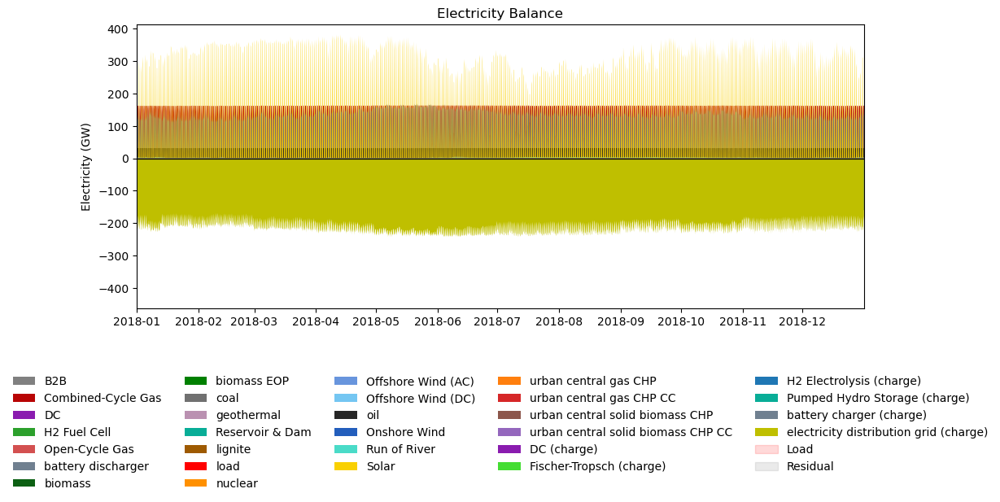


Top positive injections (discharge/supply):
carrier
solar                 381715.236795
coal                  169220.538695
CCGT                  163228.332892
oil                    31510.695406
hydro                  16295.595327
lignite                 8175.597178
onwind                  5846.510850
ror                     4826.540264
OCGT                    4277.579335
DC                      2188.336063
geothermal              1219.999984
offwind-dc               977.014364
nuclear                  620.999999
battery discharger       186.053289
biomass                  147.899922
dtype: float64

Top negative injections (charging):
carrier
electricity distribution grid   -243189.196108
H2 Electrolysis                 -160165.905846
battery charger                    -186.138101
DC                                   -8.404151
PHS                                  -0.000376
Fischer-Tropsch                      -0.000018
offwind-ac                            0.000000
solar             

In [30]:
tech_colors = config["plotting"]["tech_colors"]
nice_names  = config["plotting"]["nice_names"]

ac = n.buses.index[n.buses.carrier == "AC"]

# ----------------- Injections to AC -----------------
# Generators (already injection to their bus)
g = n.generators[n.generators.bus.isin(ac)]
gen = n.generators_t.p[g.index].groupby(g.carrier, axis=1).sum()

# StorageUnits (p>0 discharge, p<0 charge) — already bus injection
su = n.storage_units[n.storage_units.bus.isin(ac)]
su_inj = n.storage_units_t.p[su.index].groupby(su.carrier, axis=1).sum()

# Links: convert each endpoint's p to *injection at that AC bus*:
# injection at bus(side) = -p_side  (because p_side>0 is outflow from that bus)
def link_injection_at_ac(side):
    pcol = f"p{side}"; bcol = f"bus{side}"
    idx  = n.links.index[n.links[bcol].isin(ac)]
    if len(idx) == 0:
        return pd.DataFrame(index=n.snapshots)
    inj = -n.links_t[pcol][idx]  # convert to injection at the AC bus
    inj.columns = pd.MultiIndex.from_arrays(
        [n.links.loc[idx, "carrier"], idx],
        names=["carrier","name"]
    )
    inj = inj.groupby(level="carrier", axis=1).sum()
    return inj

link_inj = link_injection_at_ac(0).add(
    link_injection_at_ac(1), fill_value=0
)
if "bus2" in n.links.columns:
    link_inj = link_inj.add(link_injection_at_ac(2), fill_value=0)
if "bus3" in n.links.columns:
    link_inj = link_inj.add(link_injection_at_ac(3), fill_value=0)

# Total injection to AC by carrier (can be +/−)
inj = pd.concat([gen, su_inj, link_inj], axis=1).groupby(level=0, axis=1).sum()
inj = inj.loc[:, (inj.abs().max(0) > 0)]  # drop truly empty

# Split positive (supply/discharge) vs negative (charging)
supply   = inj.clip(lower=0)          # MW (>=0)
charging = inj.clip(upper=0)          # MW (<=0)

# ----------------- Load & Residual -----------------
loads = n.loads[n.loads.bus.isin(ac)]
load = n.loads_t.p_set[loads.index].sum(axis=1)             # MW
net_supply = supply.sum(1) + charging.sum(1)                # MW (charging is negative)
residual = load - net_supply                                # MW

# ----------------- Plot -----------------
fig, ax = plt.subplots(figsize=(12,6), constrained_layout=True)

# Positive stack (GW)
for carrier in supply.columns:
    y = (supply[carrier]/1e3)
    if (y != 0).any():
        ax.stackplot(y.index, y, labels=[nice_names.get(carrier, carrier)],
                     colors=[tech_colors.get(carrier, "grey")])

# Negative stack (GW)
for carrier in charging.columns:
    y = (charging[carrier]/1e3)
    if (y != 0).any():
        ax.stackplot(y.index, y,
                     labels=[f"{nice_names.get(carrier, carrier)} (charge)"],
                     colors=[tech_colors.get(carrier, "grey")])

# Load (area)
ax.fill_between(load.index, 0, load/1e3, alpha=0.15,
                color=tech_colors.get("load","black"), label="Load")

# Residual (area below zero so it’s visible)
ax.fill_between(residual.index, 0, -(residual/1e3), alpha=0.20,
                color=tech_colors.get("residual","0.6"), label="Residual")

ax.axhline(0, color="k", lw=0.9)
ax.set_ylabel("Electricity (GW)")
ax.set_title("Electricity Balance")
ax.margins(x=0)
ax.legend(loc="upper center", bbox_to_anchor=(0.5, -0.20), ncol=5, frameon=False)

# Make sure negative area is visible
ymin = min(0,
           (charging/1e3).sum(1).min() if not charging.empty else 0,
           (-(residual/1e3)).min())
ax.set_ylim(ymin*1.15, None)
plt.show()

# --- quick sanity check ---
print("\nTop positive injections (discharge/supply):")
print(inj.max().sort_values(ascending=False).head(15))
print("\nTop negative injections (charging):")
print(inj.min().sort_values().head(15))


# Supply Plots

In [31]:
n.explore()

/scratch/htc/ffakhira/micromamba_root/envs/pypsa-earth/lib/python3.11/site-packages/shapely/creation.py:218: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, np.intc(handle_nan), out=out, **kwargs)
INFO:pypsa.plot:Components rendered on the map: Bus, Line, Link.
INFO:pypsa.plot:Components omitted as they are missing or not selected: Generator, Load, StorageUnit, Transformer.


/tmp/ipykernel_3273856/158167295.py:82: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  region_geom = regions_onshore.unary_union


/tmp/ipykernel_3273856/158167295.py:14: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  elec_mask = n.buses.carrier.str.contains(r"(ac|dc|low voltage|electric)", case=False, regex=True)
/tmp/ipykernel_3273856/158167295.py:59: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  df = df[~df["carrier"].str.contains(drop_link_carrier_regex, case=False, regex=True)]
/tmp/ipykernel_3273856/158167295.py:59: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  df = df[~df["carrier"].str.contains(drop_link_carrier_regex, case=False, regex=True)]
/scratch/htc/ffakhira/micromamba_root/envs/pypsa-earth/lib/python3.11/site-packages/cartopy/mpl/feature_artist.py:143: UserWarning: facecolor will have no effect as it has been defined as "never".
  warnin

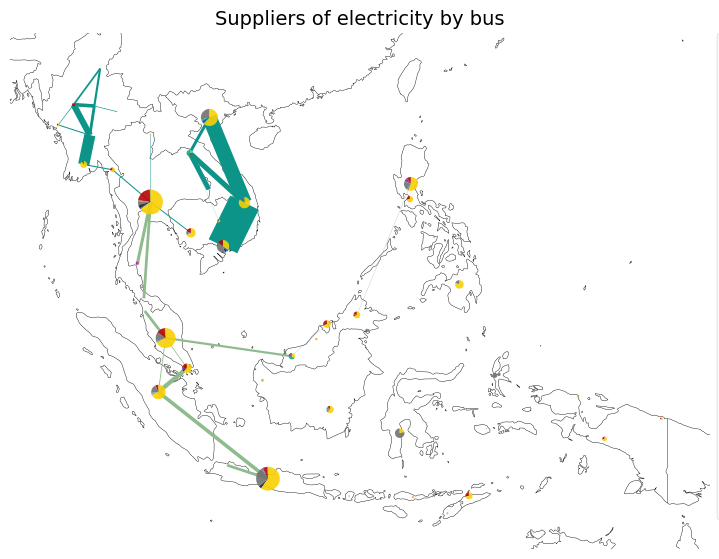

In [32]:
# ---------- run (NO DELETES — just hide outside at draw time) ----------
from matplotlib.patches import Rectangle, Circle

def electricity_suppliers_by_bus(n, include_storage=True, include_links=True,
                                 drop_link_carrier_regex=r"(charger|converter|ac-?dc|dc-?ac|transmission|line|load)"):
    """
    Returns a Series indexed by (bus, carrier) with name 'cap' (MW), summing:
      - Generators on electricity buses
      - StorageUnits on electricity buses (discharge rating), if include_storage
      - Links that OUTPUT to an electricity bus (bus1/bus2/bus3) times the respective efficiency, if include_links
    """

    # 1) electricity buses
    elec_mask = n.buses.carrier.str.contains(r"(ac|dc|low voltage|electric)", case=False, regex=True)
    elec_buses = n.buses.index[elec_mask]

    def _cap(df, col_opt="p_nom_opt", col="p_nom"):
        return (df[col_opt] if col_opt in df.columns else df[col]).fillna(0.0)

    parts = []

    # 2) Generators feeding electricity buses
    if not n.generators.empty:
        sel = n.generators.bus.isin(elec_buses)
        if sel.any():
            df = n.generators.loc[sel, ["bus", "carrier"]].copy()
            df["cap"] = _cap(n.generators.loc[sel])
            s = df.groupby(["bus", "carrier"])["cap"].sum()
            s.index = s.index.set_names(["bus", "carrier"])
            parts.append(s)

    # 3) StorageUnits (discharge rating) on electricity buses
    if include_storage and not n.storage_units.empty:
        sel = n.storage_units.bus.isin(elec_buses)
        if sel.any():
            df = n.storage_units.loc[sel, ["bus", "carrier"]].copy()
            df["cap"] = _cap(n.storage_units.loc[sel])
            s = df.groupby(["bus", "carrier"])["cap"].sum()
            s.index = s.index.set_names(["bus", "carrier"])
            parts.append(s)

    # 4) Links whose *output* bus is electricity (bus1/bus2/bus3)
    if include_links and not n.links.empty:
        for bcol, ecol in [("bus1", "efficiency"), ("bus2", "efficiency2"), ("bus3", "efficiency3")]:
            if bcol not in n.links.columns:
                continue
            sel = n.links[bcol].isin(elec_buses)
            if not sel.any():
                continue
            cap = _cap(n.links.loc[sel])
            eff = n.links.loc[sel, ecol] if ecol in n.links.columns else 1.0
            df = pd.DataFrame({
                "bus": n.links.loc[sel, bcol].astype(str),
                "carrier": n.links.loc[sel, "carrier"].astype(str),
                "cap": (cap * eff).astype(float),
            })
            # drop non-supplying link types (e.g., chargers/converters)
            if drop_link_carrier_regex:
                df = df[~df["carrier"].str.contains(drop_link_carrier_regex, case=False, regex=True)]
            if not df.empty:
                s = df.groupby(["bus", "carrier"])["cap"].sum()
                s.index = s.index.set_names(["bus", "carrier"])
                parts.append(s)

    if not parts:
        return pd.Series(dtype=float, name="cap")

    pies = pd.concat(parts, axis=0)
    # ensure MultiIndex with names, then collapse duplicates safely
    if isinstance(pies.index, pd.MultiIndex):
        pies.index = pies.index.set_names(["bus", "carrier"])
        pies = pies.groupby(level=["bus", "carrier"]).sum().sort_index()
    else:
        # fallback (shouldn't happen): make it empty rather than error
        pies = pd.Series(dtype=float, name="cap")
    pies.name = "cap"
    return pies
# start from your original network (keep it intact)
n_full = n  # do NOT .copy() / remove anything

# polygon of your region
region_geom = regions_onshore.unary_union

# which buses are inside / intersect the polygon
buses_gdf = gpd.GeoDataFrame(
    n_full.buses.copy(),
    geometry=gpd.points_from_xy(n_full.buses.x, n_full.buses.y),
    crs="EPSG:4326",
)
keep_buses = buses_gdf.index[buses_gdf.geometry.intersects(region_geom)]

# --- build pies from the full network ---
# (unchanged function; it already computes per (bus, carrier))
pies_full = electricity_suppliers_by_bus(n_full)

# --- drop load / load_shedding / curtailment (case-insensitive, NaN-safe) ---
if isinstance(pies_full.index, pd.MultiIndex) and len(pies_full):
    carriers = pies_full.index.get_level_values("carrier").astype(str).str.lower()
    bad = {"load", "load_shedding", "curtailment"}
    pies_full = pies_full[~carriers.isin(bad)]
else:
    pies_full = pd.Series(dtype=float, name="cap")

# --- keep only pies for buses inside the region ---
if isinstance(pies_full.index, pd.MultiIndex) and len(pies_full):
    inside_bus = pies_full.index.get_level_values("bus").isin(keep_buses)
    pies_in = pies_full[inside_bus]
else:
    pies_in = pd.Series(dtype=float, name="cap")


# --- build line/link widths from the full network, but zero those outside ---
# Lines: hide unless BOTH ends are inside
if getattr(n_full, "lines", None) is not None and len(n_full.lines):
    s_nom = (n_full.lines["s_nom_opt"]
             if "s_nom_opt" in n_full.lines.columns else n_full.lines.get("s_nom", 0.0)).astype(float)
    mask_lines_out = ~(n_full.lines.bus0.isin(keep_buses) & n_full.lines.bus1.isin(keep_buses))
    line_widths = s_nom.copy()
    line_widths[mask_lines_out] = 0.0
else:
    line_widths = pd.Series(dtype=float)

# Links (drawn between bus0 and bus1 in PyPSA’s plot):
# hide unless BOTH bus0 and bus1 are inside (purely visual; pies still reflect outputs to AC/DC buses)
if getattr(n_full, "links", None) is not None and len(n_full.links):
    p_nom = (n_full.links["p_nom_opt"]
             if "p_nom_opt" in n_full.links.columns else n_full.links.get("p_nom", 0.0)).astype(float)
    mask_links_out = ~(n_full.links.bus0.isin(keep_buses) & n_full.links.bus1.isin(keep_buses))
    link_widths = p_nom.copy()
    link_widths[mask_links_out] = 0.0
else:
    link_widths = pd.Series(dtype=float)

# --- plot using the *filtered visuals* but the network remains untouched ---
# --- ZOOMED ASEAN PLOT (keep full network totals; just hide outside visually) ---

PIE_SHRINK = 20        # ↑ bigger number → smaller pies (try 2–4)                              # ↑ bigger → smaller pies                        # ↑ bigger → smaller pies
ASEAN_EXTENT = [92, 141, -12, 25]           # lon_min, lon_max, lat_min, lat_max

# colors for carriers that appear inside the region
carriers_in = pies_in.index.get_level_values("carrier").unique() \
              if isinstance(pies_in.index, pd.MultiIndex) else pd.Index([])
bus_color = {c: tech_colors.get(c, "grey") for c in carriers_in}

# tight extent from inside buses (fallback to preset box)
bx  = n_full.buses.loc[keep_buses]
lon = (bx["lon"] if "lon" in bx else bx["x"]).astype(float)
lat = (bx["lat"] if "lat" in bx else bx["y"]).astype(float)
if len(lon) and len(lat):
    pad_lon = max(1.0, (lon.max() - lon.min()) * 0.08)
    pad_lat = max(1.0, (lat.max() - lat.min()) * 0.08)
    extent  = [lon.min() - pad_lon, lon.max() + pad_lon,
               lat.min() - pad_lat, lat.max() + pad_lat]
else:
    extent  = ASEAN_EXTENT

fig, ax = plt.subplots(figsize=(14, 6), subplot_kw={"projection": ccrs.PlateCarree()})
# reasonable defaults
BUS_SCALE  = 1e5     # larger -> smaller pies (radius ~ sqrt(MW / BUS_SCALE))
PIE_SHRINK = 2.5     # extra shrink factor for this view (2–4 works well)
LINE_SCALE = 1e3     # larger -> thinner lines

with plt.rc_context({"patch.linewidth": 0.0}):
    n_full.plot(
        bus_sizes=pies_in / (BUS_SCALE * PIE_SHRINK),
        bus_alpha=0.90,
        bus_colors=bus_color,
        line_widths=line_widths / LINE_SCALE,   # 0 outside, full inside
        link_widths=link_widths / LINE_SCALE,   # 0 outside, full inside
        line_colors="#0d9488",
        ax=ax,
        projection=ax.projection,
        margin=0.0,
        color_geomap=None,
    )

ax.set_extent(extent, crs=ccrs.PlateCarree())
ax.set_title("Suppliers of electricity by bus", fontsize=14)

# leave room on the right for legends
fig.subplots_adjust(right=0.78, left=0.06, top=0.92, bottom=0.06)

# ---------- LEGEND 1 (outside right, top): carrier colors with nice names + totals in GW ----------
if isinstance(pies_in.index, pd.MultiIndex) and len(pies_in):
    by_car = pies_in.groupby(level="carrier").sum().sort_values(ascending=False)
    handles1 = [Rectangle((0, 0), 1, 1, color=tech_colors.get(c, "grey")) for c in by_car.index]
    labels1  = [f"{nice_names.get(c, c)} — {by_car.loc[c]/1e3:.1f} GW" for c in by_car.index]
    leg_car = ax.legend(
        handles1, labels1,
        title="Electricity suppliers (carrier)",
        loc="upper left", bbox_to_anchor=(1.01, 1.00),
        frameon=True, framealpha=0.9, fontsize=9, title_fontsize=10, borderaxespad=0.0
    )
    leg_car.get_frame().set_edgecolor("#e5e7eb")
    ax.add_artist(leg_car)

# ---------- LEGEND 2 (outside right, bottom): pie size in TW ----------
if len(pies_in):
    bus_tot_mw = pies_in.groupby(level="bus").sum()
    vmax_mw = float(bus_tot_mw.max())
    if vmax_mw > 0:
        cand_tw = np.array([0.2, 0.5, 1.0]) * (vmax_mw / 1e6)
        def _round_nice_tw(x):
            if x <= 0: return 0.0
            e = np.floor(np.log10(x)); m = x / 10**e
            m = 1.0 if m < 1.5 else 2.0 if m < 3.5 else 5.0 if m < 7.5 else 10.0
            return m * 10**e
        ex_tw = np.unique([_round_nice_tw(v) for v in cand_tw])
        ex_tw = ex_tw[ex_tw > 0]
        if ex_tw.size == 0: ex_tw = np.array([0.1, 0.5, 1.0], dtype=float)
    else:
        ex_tw = np.array([0.1, 0.5, 1.0], dtype=float)

    ex_mw  = ex_tw * 1e6
    radii  = np.sqrt(ex_mw / (BUS_SCALE * PIE_SHRINK))   # must match bus_sizes scaling
    r_max  = radii.max() if len(radii) else 1.0
    k      = 10.0 / r_max
    handles3 = [Circle((0, 0), r*k, facecolor="#9ca3af", edgecolor="#6b7280", alpha=0.75) for r in radii]
    labels3  = [f"{tw:.1f} TW" for tw in ex_tw]


plt.show()


/tmp/ipykernel_3273856/678660563.py:40: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  g = g[~g.carrier.astype(str).str.contains(EXCLUDE_ALWAYS, case=False, regex=True)]
/tmp/ipykernel_3273856/678660563.py:48: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  su = su[~su.carrier.astype(str).str.contains(EXCLUDE_ALWAYS, case=False, regex=True)]
/tmp/ipykernel_3273856/678660563.py:56: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  mask = ~L.carrier.astype(str).str.contains(EXCLUDE_ALWAYS, case=False, regex=True)
/tmp/ipykernel_3273856/678660563.py:57: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  mask &= ~L.carrier.astype(str).str.contains(EXCL

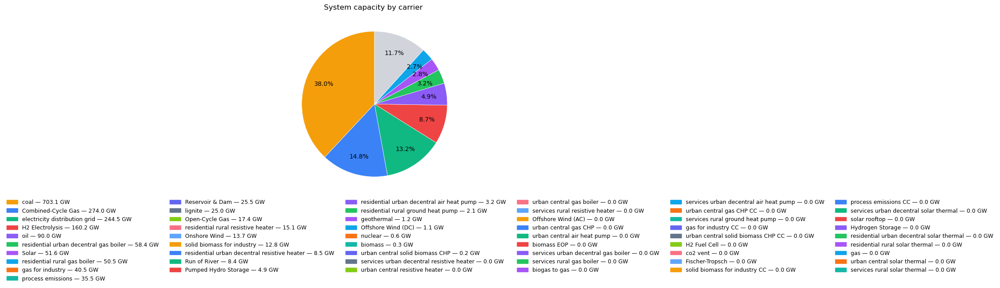

In [33]:


# ---------------- Config ----------------
EXCLUDE_ALWAYS = r"(curtailment|load_shedding|^load$)"
EXCLUDE_LINKS  = r"(converter|ac-?dc|dc-?ac|transmission|line|^DC$|^AC$|B2B|charger|discharger|V2G|water tanks charger)"
TOP_PIE = 8
WRAP = 16

# --- these two are expected to exist (from your other script); fall back to empty if not ---
try:
    tech_colors
except NameError:
    tech_colors = {}
try:
    nice_names
except NameError:
    nice_names = {}

def _wrap(s, w=WRAP):
    return "\n".join(textwrap.wrap(str(s), w, break_long_words=False))

def _cap(df, col_opt="p_nom_opt", col="p_nom"):
    use = col_opt if col_opt in df.columns else col
    return df[use].fillna(0.0).astype(float)

def _is_valid_color(c):
    if c is None: return False
    c = str(c).strip()
    if c == "" or c.lower() == "nan": return False
    try:
        mcolors.to_rgba(c); return True
    except Exception:
        return False

# --------- Build (Generators + StorageUnits + Links) power capacity by carrier ---------
def system_capacity_by_carrier(n, include_storage=True, include_links=True):
    parts = []

    # Generators (MW)
    if getattr(n, "generators", None) is not None and not n.generators.empty:
        g = n.generators.copy()
        g = g[~g.carrier.astype(str).str.contains(EXCLUDE_ALWAYS, case=False, regex=True)]
        if not g.empty:
            s = g.groupby("carrier")["p_nom"].sum()
            parts.append(s)

    # StorageUnits (discharge MW)
    if include_storage and getattr(n, "storage_units", None) is not None and not n.storage_units.empty:
        su = n.storage_units.copy()
        su = su[~su.carrier.astype(str).str.contains(EXCLUDE_ALWAYS, case=False, regex=True)]
        if not su.empty:
            s = su.groupby("carrier")["p_nom"].sum()
            parts.append(s)

    # Links (use p_nom_opt if extendable else p_nom)
    if include_links and getattr(n, "links", None) is not None and not n.links.empty:
        L = n.links.copy()
        mask = ~L.carrier.astype(str).str.contains(EXCLUDE_ALWAYS, case=False, regex=True)
        mask &= ~L.carrier.astype(str).str.contains(EXCLUDE_LINKS, case=False, regex=True)
        L = L[mask]
        if not L.empty:
            cap = np.where(L.p_nom_extendable.fillna(False), L.p_nom_opt.fillna(L.p_nom), L.p_nom)
            s = pd.Series(cap, index=L.index).groupby(L.carrier).sum()
            parts.append(s)

    if not parts:
        return pd.Series(dtype=float, name="MW")

    cap_MW = pd.concat(parts, axis=0).groupby(level=0).sum().sort_values(ascending=False)
    cap_MW.name = "MW"
    return cap_MW

# ---------------- Compute capacity (MW → GW) ----------------
cap_MW = system_capacity_by_carrier(n, include_storage=True, include_links=True)
cap_GW = (cap_MW / 1e3).clip(lower=0)  # non-negative for pie

# ---------------- Color mapping aligned with electricity-suppliers plot ----------------
# Priority: tech_colors (your map) → n.carriers["color"] → fallback palette
if hasattr(n, "carriers") and "color" in getattr(n, "carriers").columns:
    carriers_color_col = n.carriers["color"].to_dict()
else:
    carriers_color_col = {}

fallback_pal = ["#f59e0b","#3b82f6","#10b981","#ef4444","#8b5cf6",
                "#22c55e","#a855f7","#0ea5e9","#f97316","#14b8a6",
                "#6366f1","#64748b","#84cc16","#fb7185","#60a5fa"]

color_map = {}
for i, k in enumerate(cap_GW.index):
    c = tech_colors.get(k) or carriers_color_col.get(k)
    color_map[k] = c if _is_valid_color(c) else fallback_pal[i % len(fallback_pal)]

# ---------------- Pie (top N + Other) & Bar (all) ----------------
if len(cap_GW) > TOP_PIE:
    top = cap_GW.iloc[:TOP_PIE]
    other = pd.Series({"Other": cap_GW.iloc[TOP_PIE:].sum()})
    pie_vals = pd.concat([top, other])
else:
    pie_vals = cap_GW

pie_colors = [("#d1d5db" if k == "Other" else color_map.get(k, "#9ca3af")) for k in pie_vals.index]

bar_vals   = cap_GW.sort_values(ascending=True)
bar_colors = [color_map.get(k, "#9ca3af") for k in bar_vals.index]

# use nice names if provided
def _nice(k): return nice_names.get(k, k)
bar_labels = [_wrap(_nice(k)) for k in bar_vals.index]

# -------- layout with a dedicated legend row (no overlap) --------
fig = plt.figure(figsize=(13, 7))
gs  = fig.add_gridspec(2, 2, height_ratios=[18, 2], hspace=0.35, wspace=0.3)
ax1 = fig.add_subplot(gs[0, 0])
axL = fig.add_subplot(gs[1, :]); axL.axis("off")

# Pie
autopct_fn = (lambda p: f"{p:.1f}%" if p >= 2 else "")
ax1.pie(
    pie_vals, colors=pie_colors, startangle=90, pctdistance=0.75,
    autopct=autopct_fn, wedgeprops=dict(linewidth=0.5, edgecolor="white")
)
ax1.set_title("System capacity by carrier ")

# Legend (bottom, all carriers)
handles = [plt.Rectangle((0,0),1,1, color=color_map.get(k, "#9ca3af")) for k in cap_GW.index]
labels  = [f"{_nice(k)} — {v:.1f} GW" for k, v in cap_GW.items()]
ncol    = min(6, max(2, int(np.ceil(len(labels)/2))))
axL.legend(handles, labels, loc="center", ncol=ncol, frameon=False, fontsize=9)

plt.show()


In [34]:
# === Imports ===
import numpy as np
import pandas as pd
import textwrap
import matplotlib.pyplot as plt
from matplotlib import colors as mcolors

# ---------------- Config ----------------
EXCLUDE_ALWAYS = r"(curtailment|load_shedding|^load$)"
EXCLUDE_LINKS  = r"(converter|ac-?dc|dc-?ac|transmission|line|^DC$|^AC$|B2B|charger|discharger|V2G)|water tanks charger)"
TOP_PIE = 8
WRAP = 16

# --- optional globals (use if already defined elsewhere) ---
try:
    tech_colors
except NameError:
    tech_colors = {}
try:
    nice_names
except NameError:
    nice_names = {}

def _wrap(s, w=WRAP):
    return "\n".join(textwrap.wrap(str(s), w, break_long_words=False))

def _is_valid_color(c):
    if c is None: return False
    c = str(c).strip()
    if c == "" or c.lower() == "nan": return False
    try:
        mcolors.to_rgba(c); return True
    except Exception:
        return False

# --------- Build (Generators + StorageUnits + Links) ELECTRICAL capacity by carrier ---------
def system_capacity_by_carrier(n, include_storage=True, include_links=True):
    """
    Returns a Series (index=carrier, values=MW_electric) summing:
      - Generators: p_nom (already MW_el)
      - StorageUnits: p_nom (discharge MW on electrical bus)
      - Links: (p_nom or p_nom_opt) * efficiency  <-- converts input-side to output-side MW_el
    Excludes converters/transmission and curtailment/load items.
    """
    parts = []

    # Generators (MW_el)
    if getattr(n, "generators", None) is not None and not n.generators.empty:
        g = n.generators.copy()
        g = g[~g.carrier.astype(str).str.contains(EXCLUDE_ALWAYS, case=False, regex=True)]
        if not g.empty:
            s = g.groupby("carrier")["p_nom"].sum()
            parts.append(s)

    # StorageUnits (discharge MW on electrical bus)
    if include_storage and getattr(n, "storage_units", None) is not None and not n.storage_units.empty:
        su = n.storage_units.copy()
        su = su[~su.carrier.astype(str).str.contains(EXCLUDE_ALWAYS, case=False, regex=True)]
        if not su.empty:
            s = su.groupby("carrier")["p_nom"].sum()
            parts.append(s)

    # Links -> convert to ELECTRICAL MW via efficiency
    if include_links and getattr(n, "links", None) is not None and not n.links.empty:
        L = n.links.copy()
        # exclude non-conversion infra and always-excluded carriers
        mask = ~L.carrier.astype(str).str.contains(EXCLUDE_ALWAYS, case=False, regex=True)
        mask &= ~L.carrier.astype(str).str.contains(EXCLUDE_LINKS, case=False, regex=True)
        L = L[mask]
        if not L.empty:
            cap_base = np.where(
                L.p_nom_extendable.fillna(False),
                L.p_nom_opt.fillna(L.p_nom),  # chosen capacity if extendable, else nameplate
                L.p_nom
            )
            eff = L["efficiency"].fillna(1.0)
            cap_el = cap_base * eff  # <-- crucial conversion to MW_el
            s = pd.Series(cap_el, index=L.index).groupby(L.carrier).sum()
            parts.append(s)

    if not parts:
        return pd.Series(dtype=float, name="MW_el")

    cap_MW = pd.concat(parts, axis=0).groupby(level=0).sum().sort_values(ascending=False)
    cap_MW.name = "MW_el"
    return cap_MW

# ---------------- Compute capacity (MW_el → GW_el) ----------------
cap_MW = system_capacity_by_carrier(n, include_storage=True, include_links=True)
cap_GW = (cap_MW / 1e3).clip(lower=0)  # non-negative for pie

# ---------------- Color mapping aligned with electricity-suppliers plot ----------------
if hasattr(n, "carriers") and "color" in getattr(n, "carriers").columns:
    carriers_color_col = n.carriers["color"].to_dict()
else:
    carriers_color_col = {}

fallback_pal = ["#f59e0b","#3b82f6","#10b981","#ef4444","#8b5cf6",
                "#22c55e","#a855f7","#0ea5e9","#f97316","#14b8a6",
                "#6366f1","#64748b","#84cc16","#fb7185","#60a5fa"]

color_map = {}
for i, k in enumerate(cap_GW.index):
    c = tech_colors.get(k) or carriers_color_col.get(k)
    color_map[k] = c if _is_valid_color(c) else fallback_pal[i % len(fallback_pal)]

# ---------------- Pie (top N + Other) & Bar (all) ----------------
if len(cap_GW) > TOP_PIE:
    top = cap_GW.iloc[:TOP_PIE]
    other = pd.Series({"Other": cap_GW.iloc[TOP_PIE:].sum()})
    pie_vals = pd.concat([top, other])
else:
    pie_vals = cap_GW

pie_colors = [("#d1d5db" if k == "Other" else color_map.get(k, "#9ca3af")) for k in pie_vals.index]

bar_vals   = cap_GW.sort_values(ascending=True)
bar_colors = [color_map.get(k, "#9ca3af") for k in bar_vals.index]

def _nice(k): return nice_names.get(k, k)
bar_labels = [_wrap(_nice(k)) for k in bar_vals.index]

# -------- layout with a dedicated legend row (no overlap) --------
fig = plt.figure(figsize=(13, 7))
gs  = fig.add_gridspec(2, 2, height_ratios=[18, 2], hspace=0.35, wspace=0.3)
ax1 = fig.add_subplot(gs[0, 0])
axL = fig.add_subplot(gs[1, :]); axL.axis("off")

# Pie
autopct_fn = (lambda p: f"{p:.1f}%" if p >= 2 else "")
ax1.pie(
    pie_vals, colors=pie_colors, startangle=90, pctdistance=0.75,
    autopct=autopct_fn, wedgeprops=dict(linewidth=0.5, edgecolor="white")
)
ax1.set_title("Installed generation capacity by carrier (electrical MW)")

# Legend (bottom, all carriers)
handles = [plt.Rectangle((0,0),1,1, color=color_map.get(k, "#9ca3af")) for k in cap_GW.index]
labels  = [f"{_nice(k)} — {v:.1f} GW" for k, v in cap_GW.items()]
ncol    = min(6, max(2, int(np.ceil(len(labels)/2))))
axL.legend(handles, labels, loc="center", ncol=ncol, frameon=False, fontsize=9)

plt.show()

# -------- Optional sanity prints --------
if "links" in dir(n):
    for fuel in ["coal","lignite","OCGT","CCGT","oil","biomass","nuclear"]:
        m = n.links.carrier.str.fullmatch(fuel, case=False, na=False)
        if m.any():
            fuel_in  = n.links.loc[m, "p_nom"].sum()/1e3
            fuel_out = (n.links.loc[m, "p_nom"]*n.links.loc[m, "efficiency"]).sum()/1e3
            print(f"[{fuel}] input-side = {fuel_in:.1f} GW_th  |  output-side = {fuel_out:.1f} GW_el")


/tmp/ipykernel_3273856/2208561498.py:50: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  g = g[~g.carrier.astype(str).str.contains(EXCLUDE_ALWAYS, case=False, regex=True)]
/tmp/ipykernel_3273856/2208561498.py:58: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  su = su[~su.carrier.astype(str).str.contains(EXCLUDE_ALWAYS, case=False, regex=True)]
/tmp/ipykernel_3273856/2208561498.py:67: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  mask = ~L.carrier.astype(str).str.contains(EXCLUDE_ALWAYS, case=False, regex=True)


error: unbalanced parenthesis at position 100

/tmp/ipykernel_3273856/603653325.py:93: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  bad = df["carrier"].astype(str).str.contains(EXCLUDE_ALWAYS, case=False, regex=True)
/tmp/ipykernel_3273856/603653325.py:94: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  bad2 = df["carrier"].astype(str).str.contains(EXCLUDE_LINKS, case=False, regex=True)


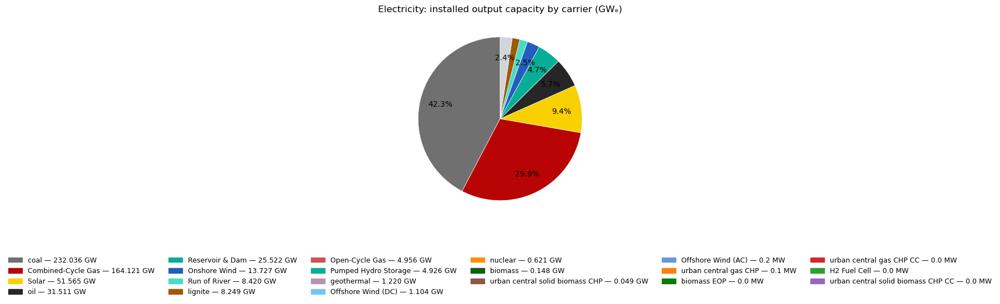

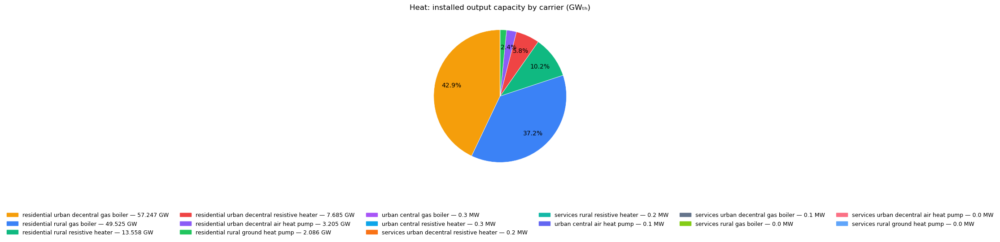

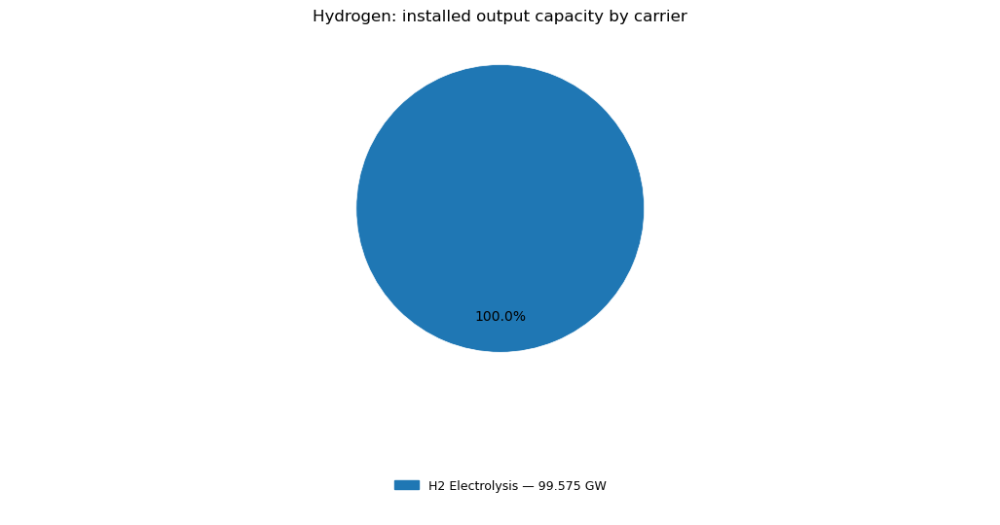

In [35]:
# === Imports ===
import numpy as np
import pandas as pd
import textwrap
import matplotlib.pyplot as plt
from matplotlib import colors as mcolors

# ---------------- Config ----------------
EXCLUDE_ALWAYS = r"(curtailment|load_shedding|^load$)"
EXCLUDE_LINKS  = r"(converter|ac-?dc|dc-?ac|transmission|line|^DC$|^AC$|B2B|charger|discharger|V2G|water tanks charger)"
WRAP = 16
TOP_PIE = 8  # top N slices; rest collapse into "Other"

# optional globals if you have them elsewhere
try: tech_colors
except NameError: tech_colors = {}
try: nice_names
except NameError: nice_names = {}

def _wrap(s, w=WRAP):
    return "\n".join(textwrap.wrap(str(s), w, break_long_words=False))

def _is_valid_color(c):
    if c is None: return False
    c = str(c).strip()
    if c == "" or c.lower() == "nan": return False
    try: mcolors.to_rgba(c); return True
    except Exception: return False

def _nice(k): return nice_names.get(k, k)

def _format_val_gw(x_gw):
    """Human-friendly: show GW with 3 decimals; if <1e-3 GW, show MW."""
    if x_gw == 0:
        return "0"
    if x_gw >= 1:
        return f"{x_gw:.3f} GW".rstrip("0").rstrip(".")
    if x_gw >= 1e-3:
        return f"{x_gw:.3f} GW".rstrip("0").rstrip(".")
    # super small -> MW
    return f"{x_gw*1e3:.1f} MW"

def _build_color_map(keys, n):
    carriers_color_col = (
        n.carriers["color"].to_dict()
        if hasattr(n, "carriers") and "color" in n.carriers.columns
        else {}
    )
    fallback_pal = ["#f59e0b","#3b82f6","#10b981","#ef4444","#8b5cf6",
                    "#22c55e","#a855f7","#0ea5e9","#f97316","#14b8a6",
                    "#6366f1","#64748b","#84cc16","#fb7185","#60a5fa"]
    cmap = {}
    for i, k in enumerate(keys):
        c = tech_colors.get(k) or carriers_color_col.get(k)
        cmap[k] = c if _is_valid_color(c) else fallback_pal[i % len(fallback_pal)]
    return cmap

# ---------- Build tidy capacity by OUTPUT vector (electric/heat/H2/etc.) ----------
def capacity_by_output_vector(n):
    rows = []
    bus_carrier = n.buses["carrier"]

    # Generators: output bus = generators.bus
    if getattr(n, "generators", None) is not None and not n.generators.empty:
        g = n.generators.copy()
        g["out_vec"] = g["bus"].map(bus_carrier)
        g["mw_out"]  = g["p_nom"]
        rows.append(g[["carrier","out_vec","mw_out"]])

    # StorageUnits: discharge bus = storage_units.bus
    if getattr(n, "storage_units", None) is not None and not n.storage_units.empty:
        su = n.storage_units.copy()
        su["out_vec"] = su["bus"].map(bus_carrier)
        su["mw_out"]  = su["p_nom"]
        rows.append(su[["carrier","out_vec","mw_out"]])

    # Links: output bus = links.bus1; convert input→output via efficiency
    if getattr(n, "links", None) is not None and not n.links.empty:
        L = n.links.copy()
        L["out_vec"] = L["bus1"].map(bus_carrier)
        cap_base = np.where(L.p_nom_extendable.fillna(False),
                            L.p_nom_opt.fillna(L.p_nom),
                            L.p_nom)
        L["mw_out"] = cap_base * L.efficiency.fillna(1.0)
        rows.append(L[["carrier","out_vec","mw_out"]])

    if not rows:
        return pd.Series(dtype=float, name="MW_out")

    df = pd.concat(rows, axis=0, ignore_index=True)

    # drop curtailment/load & infra
    bad = df["carrier"].astype(str).str.contains(EXCLUDE_ALWAYS, case=False, regex=True)
    bad2 = df["carrier"].astype(str).str.contains(EXCLUDE_LINKS, case=False, regex=True)
    df = df[~bad & ~bad2]

    out = (df.groupby(["out_vec","carrier"])["mw_out"].sum()
             .rename("MW_out")
             .sort_values(ascending=False))
    return out

def series_for_vector(out_cap, vector_pattern):
    """Return GW series (index=carrier) for a regex on out_vec; exclude EXACT zeros."""
    idx = out_cap.index.get_level_values(0).astype(str)
    s = out_cap[idx.str.contains(vector_pattern, case=False, na=False)]
    s = s.reset_index(level=0, drop=True)  # leave only carrier index
    sGW = (s / 1e3)
    sGW = sGW[sGW != 0]  # drop exact zeros from legend
    return sGW.sort_values(ascending=False)

def plot_pie(series_GW, title, n):
    if series_GW.empty:
        print(f"[{title}] nothing to plot.")
        return
    # top N + Other
    if len(series_GW) > TOP_PIE:
        top = series_GW.iloc[:TOP_PIE]
        other = pd.Series({"Other": series_GW.iloc[TOP_PIE:].sum()})
        pie_vals = pd.concat([top, other])
    else:
        pie_vals = series_GW

    cmap = _build_color_map(series_GW.index, n)
    colors = [("#d1d5db" if k=="Other" else cmap.get(k, "#9ca3af")) for k in pie_vals.index]

    # figure with dedicated legend row
    fig = plt.figure(figsize=(13, 6.5))
    gs  = fig.add_gridspec(2, 1, height_ratios=[18, 3], hspace=0.32)
    ax  = fig.add_subplot(gs[0, 0])
    axL = fig.add_subplot(gs[1, 0]); axL.axis("off")

    ax.pie(
        pie_vals,
        colors=colors,
        startangle=90,
        pctdistance=0.75,
        autopct=(lambda p: f"{p:.1f}%" if p >= 2 else ""),
        wedgeprops=dict(linewidth=0.5, edgecolor="white"),
    )
    ax.set_title(title)

    # legend: exclude zeros already; format each with high precision
    handles = [plt.Rectangle((0,0),1,1, color=cmap.get(k, "#9ca3af"))
               for k in series_GW.index]
    labels  = [f"{_nice(k)} — {_format_val_gw(v)}" for k, v in series_GW.items()]
    ncol    = min(6, max(2, int(np.ceil(len(labels)/2))))
    axL.legend(handles, labels, loc="center", ncol=ncol, frameon=False, fontsize=9)
    plt.show()

# -------- Build once and plot per vector --------
out_cap = capacity_by_output_vector(n)

# Electricity (AC/electric)
elec = series_for_vector(out_cap, r"\bAC\b|\belectric")
plot_pie(elec, "Electricity: installed output capacity by carrier (GWₑ)", n)

# Heat (tweak regex to your bus naming)
heat = series_for_vector(out_cap, r"heat|urban|rural|residential|services")
plot_pie(heat, "Heat: installed output capacity by carrier (GWₜₕ)", n)

# Hydrogen
h2 = series_for_vector(out_cap, r"\bH2\b|\bhydrogen\b")
plot_pie(h2, "Hydrogen: installed output capacity by carrier", n)


/tmp/ipykernel_2709822/1025595476.py:101: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  bad1 = df["carrier"].astype(str).str.contains(EXCLUDE_ALWAYS, case=False, regex=True)
/tmp/ipykernel_2709822/1025595476.py:102: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  bad2 = df["carrier"].astype(str).str.contains(EXCLUDE_LINKS,  case=False, regex=True)


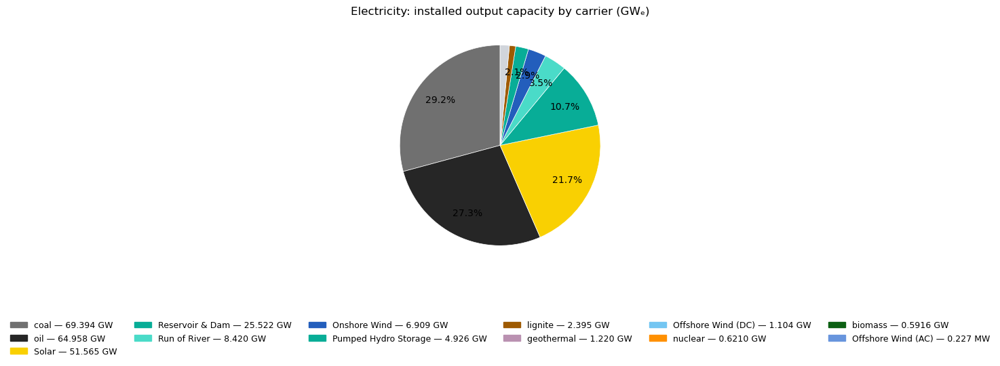

[Heat: installed output capacity by carrier (MWₜₕ→GW)] nothing to plot.
[Hydrogen: installed output capacity by carrier] nothing to plot.


In [ ]:
# === Imports ===
import numpy as np
import pandas as pd
import textwrap
import matplotlib.pyplot as plt
from matplotlib import colors as mcolors

# ---------------- Config ----------------
EXCLUDE_ALWAYS = r"(curtailment|load_shedding|^load$)"
EXCLUDE_LINKS  = r"(converter|ac-?dc|dc-?ac|transmission|line|^DC$|^AC$|B2B|charger|discharger|V2G|water tanks charger)"
WRAP = 16
TOP_PIE = 8                 # top N slices; rest collapse into "Other"
MIN_LEGEND_MW = 0.1         # hide anything < 0.1 MW from legend
EPS_GW = MIN_LEGEND_MW / 1e3

# optional globals from your env
try: tech_colors
except NameError: tech_colors = {}
try: nice_names
except NameError: nice_names = {}

# ---------------- Helpers ----------------
def _wrap(s, w=WRAP):
    return "\n".join(textwrap.wrap(str(s), w, break_long_words=False))

def _is_valid_color(c):
    if c is None: return False
    c = str(c).strip()
    if not c or c.lower() == "nan": return False
    try: mcolors.to_rgba(c); return True
    except Exception: return False

def _nice(k): return nice_names.get(k, k)

def _format_val_gw(x_gw: float) -> str:
    """Format with precision; never show 0.0 for non-zero."""
    if x_gw <= 0:
        return "0"
    if x_gw >= 1:
        return f"{x_gw:.3f} GW".rstrip("0").rstrip(".")
    if x_gw >= 1e-3:  # 1 MW–999 MW shown in GW with 4 decimals
        return f"{x_gw:.4f} GW".rstrip("0").rstrip(".")
    # < 1 MW → MW with 3 decimals
    x_mw = x_gw * 1e3
    if x_mw >= 0.001:
        s = f"{x_mw:.3f} MW".rstrip("0").rstrip(".")
        return s if s != "0 MW" else "<0.001 MW"
    return "<0.001 MW"

def _build_color_map(keys, n):
    carriers_color_col = (
        n.carriers["color"].to_dict()
        if hasattr(n, "carriers") and "color" in n.carriers.columns
        else {}
    )
    fallback_pal = ["#f59e0b","#3b82f6","#10b981","#ef4444","#8b5cf6",
                    "#22c55e","#a855f7","#0ea5e9","#f97316","#14b8a6",
                    "#6366f1","#64748b","#84cc16","#fb7185","#60a5fa"]
    cmap = {}
    for i, k in enumerate(keys):
        c = tech_colors.get(k) or carriers_color_col.get(k)
        cmap[k] = c if _is_valid_color(c) else fallback_pal[i % len(fallback_pal)]
    return cmap

# ---------- Build tidy capacity by OUTPUT vector (electric/heat/H2/etc.) ----------
def capacity_by_output_vector(n):
    """Return Series indexed by (out_vec, carrier) with output-side MW (MW_out)."""
    rows = []
    bus_carrier = n.buses["carrier"]

    # Generators: output bus = generators.bus
    if getattr(n, "generators", None) is not None and not n.generators.empty:
        g = n.generators.copy()
        g["out_vec"] = g["bus"].map(bus_carrier)
        g["mw_out"]  = g["p_nom"]
        rows.append(g[["carrier","out_vec","mw_out"]])

    # StorageUnits: discharge to storage_units.bus
    if getattr(n, "storage_units", None) is not None and not n.storage_units.empty:
        su = n.storage_units.copy()
        su["out_vec"] = su["bus"].map(bus_carrier)
        su["mw_out"]  = su["p_nom"]
        rows.append(su[["carrier","out_vec","mw_out"]])

    # Links: output bus = links.bus1; convert input→output via efficiency
    if getattr(n, "links", None) is not None and not n.links.empty:
        L = n.links.copy()
        L["out_vec"] = L["bus1"].map(bus_carrier)
        cap_base = np.where(L.p_nom_extendable.fillna(False),
                            L.p_nom_opt.fillna(L.p_nom),
                            L.p_nom)
        L["mw_out"] = cap_base * L.efficiency.fillna(1.0)
        rows.append(L[["carrier","out_vec","mw_out"]])

    if not rows:
        return pd.Series(dtype=float, name="MW_out")

    df = pd.concat(rows, axis=0, ignore_index=True)

    # drop curtailment/load & infra
    bad1 = df["carrier"].astype(str).str.contains(EXCLUDE_ALWAYS, case=False, regex=True)
    bad2 = df["carrier"].astype(str).str.contains(EXCLUDE_LINKS,  case=False, regex=True)
    df = df[~(bad1 | bad2)]

    out = (df.groupby(["out_vec","carrier"])["mw_out"].sum()
             .rename("MW_out")
             .sort_values(ascending=False))
    return out

def series_for_vector(out_cap, vector_pattern):
    """Return GW series (index=carrier) for a regex on out_vec.
       Drops exact zeros and tiny values (< MIN_LEGEND_MW) from LEGEND."""
    idx = out_cap.index.get_level_values(0).astype(str)
    s = out_cap[idx.str.contains(vector_pattern, case=False, na=False)]
    s = s.reset_index(level=0, drop=True)   # keep only 'carrier'
    sGW = (s / 1e3)                         # → GW
    sGW = sGW[sGW > EPS_GW]                 # hide zeros & tiny from legend
    return sGW.sort_values(ascending=False)

def plot_pie(series_GW, title, n):
    if series_GW.empty:
        print(f"[{title}] nothing to plot.")
        return

    # top N + Other
    if len(series_GW) > TOP_PIE:
        top = series_GW.iloc[:TOP_PIE]
        other = pd.Series({"Other": series_GW.iloc[TOP_PIE:].sum()})
        pie_vals = pd.concat([top, other])
    else:
        pie_vals = series_GW

    # optionally also drop tiny values from the pie itself:
    pie_vals = pie_vals[pie_vals > EPS_GW]

    cmap = _build_color_map(series_GW.index, n)
    colors = [("#d1d5db" if k=="Other" else cmap.get(k, "#9ca3af")) for k in pie_vals.index]

    fig = plt.figure(figsize=(13, 6.5))
    gs  = fig.add_gridspec(2, 1, height_ratios=[18, 3], hspace=0.32)
    ax  = fig.add_subplot(gs[0, 0])
    axL = fig.add_subplot(gs[1, 0]); axL.axis("off")

    ax.pie(
        pie_vals,
        colors=colors,
        startangle=90,
        pctdistance=0.75,
        autopct=(lambda p: f"{p:.1f}%" if p >= 2 else ""),
        wedgeprops=dict(linewidth=0.5, edgecolor="white"),
    )
    ax.set_title(title)

    # legend (no zeros/tiny; already filtered in series_GW)
    handles = [plt.Rectangle((0,0),1,1, color=cmap.get(k, "#9ca3af"))
               for k in series_GW.index]
    labels  = [f"{_nice(k)} — {_format_val_gw(v)}" for k, v in series_GW.items()]
    ncol    = min(6, max(2, int(np.ceil(len(labels)/2))))
    axL.legend(handles, labels, loc="center", ncol=ncol, frameon=False, fontsize=9)
    plt.show()

# -------- Run: build once and plot per vector --------
out_cap = capacity_by_output_vector(n)

# Electricity (AC / electric)
elec = series_for_vector(out_cap, r"\bAC\b|\belectric")
plot_pie(elec, "Electricity: installed output capacity by carrier (GWₑ)", n)

# Heat (adjust regex to your schema if needed)
heat = series_for_vector(out_cap, r"heat|urban|rural|residential|services")
plot_pie(heat, "Heat: installed output capacity by carrier (MWₜₕ→GW)", n)

# Hydrogen
h2 = series_for_vector(out_cap, r"\bH2\b|\bhydrogen\b")
plot_pie(h2, "Hydrogen: installed output capacity by carrier", n)


In [ ]:
print("Generators only:", n.generators.query("carrier.str.contains('coal')")["p_nom"].sum())
print("Links only:", n.links.query("carrier.str.contains('coal')")["p_nom"].sum())


Generators only: 0.0
Links only: 707253.0279052632


/tmp/ipykernel_2311919/2302536094.py:83: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  g = g[~g.carrier.astype(str).str.contains(EXCLUDE_ALWAYS, case=False, regex=True)]
/tmp/ipykernel_2311919/2302536094.py:89: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  su = su[~su.carrier.astype(str).str.contains(EXCLUDE_ALWAYS, case=False, regex=True)]
/tmp/ipykernel_2311919/2302536094.py:95: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  mask = ~L.carrier.astype(str).str.contains(EXCLUDE_ALWAYS, case=False, regex=True)
/tmp/ipykernel_2311919/2302536094.py:96: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  mask &= ~L.carrier.astype(str).str.contains(

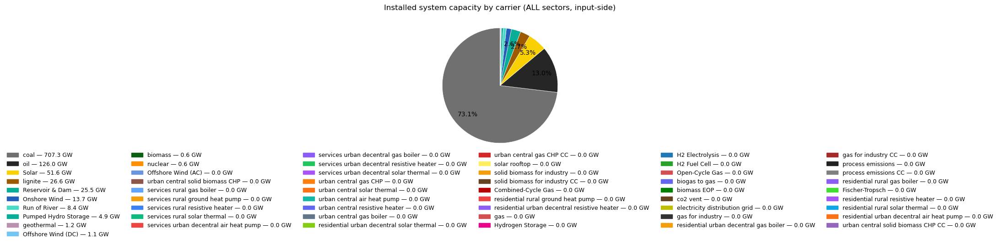

/tmp/ipykernel_2311919/2302536094.py:135: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  df = df[~df.carrier.astype(str).str.contains(EXCLUDE_ALWAYS, case=False, regex=True)]
/tmp/ipykernel_2311919/2302536094.py:136: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  df = df[~df.carrier.astype(str).str.contains(EXCLUDE_LINKS,  case=False, regex=True)]


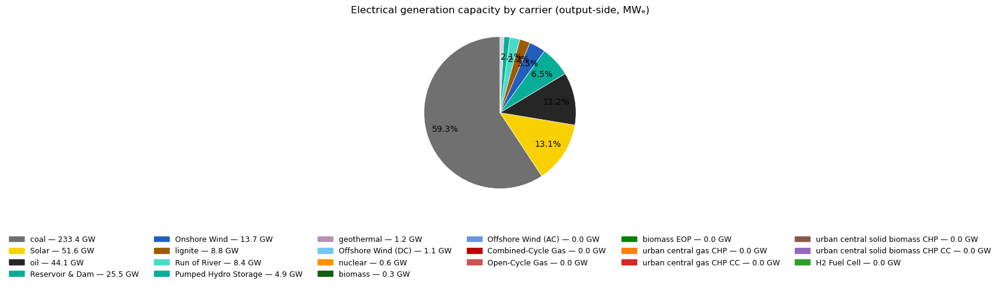

/scratch/htc/ffakhira/micromamba_root/envs/pypsa-earth/lib/python3.11/site-packages/matplotlib/axes/_axes.py:3368: RuntimeWarning: invalid value encountered in divide
  x = x / sx


ValueError: cannot convert float NaN to integer

ValueError: need at least one array to concatenate

<Figure size 880x550 with 2 Axes>

In [ ]:
# === Imports ===
import numpy as np, pandas as pd, textwrap
import matplotlib.pyplot as plt
from matplotlib import colors as mcolors

# ---------------- Config ----------------
EXCLUDE_ALWAYS = r"(curtailment|load_shedding|^load$)"
EXCLUDE_LINKS  = r"(converter|ac-?dc|dc-?ac|transmission|line|^DC$|^AC$|B2B|charger|discharger|V2G|water tanks charger)"
TOP_PIE = 8
WRAP = 16

# --- pick up optional globals if you already defined them elsewhere ---
try:    tech_colors
except NameError: tech_colors = {}
try:    nice_names
except NameError: nice_names = {}

def _wrap(s, w=WRAP):
    return "\n".join(textwrap.wrap(str(s), w, break_long_words=False))

def _is_valid_color(c):
    if c is None: return False
    c = str(c).strip()
    if c == "" or c.lower() == "nan": return False
    try: mcolors.to_rgba(c); return True
    except Exception: return False

def _nice(k): return nice_names.get(k, k)

# ---------------- Helpers ----------------
def _fallback_colors(keys, palette=None):
    if palette is None:
        palette = ["#f59e0b","#3b82f6","#10b981","#ef4444","#8b5cf6",
                   "#22c55e","#a855f7","#0ea5e9","#f97316","#14b8a6",
                   "#6366f1","#64748b","#84cc16","#fb7185","#60a5fa"]
    return {k: palette[i % len(palette)] for i, k in enumerate(keys)}

def _build_color_map(keys, n):
    if hasattr(n, "carriers") and "color" in getattr(n, "carriers").columns:
        carriers_color_col = n.carriers["color"].to_dict()
    else:
        carriers_color_col = {}
    cmap = {}
    fb = _fallback_colors(keys)
    for k in keys:
        c = tech_colors.get(k) or carriers_color_col.get(k)
        cmap[k] = c if _is_valid_color(c) else fb[k]
    return cmap

def _legend(ax, series_GW, color_map, ncol=6, title=None):
    handles = [plt.Rectangle((0,0),1,1,color=color_map.get(k,"#9ca3af")) for k in series_GW.index]
    labels  = [f"{_nice(k)} — {v:.1f} GW" for k, v in series_GW.items()]
    ax.axis("off")
    if title: ax.set_title(title)
    ax.legend(handles, labels, loc="center", ncol=min(ncol, max(2, int(np.ceil(len(labels)/2)))), frameon=False, fontsize=9)

def _pie(series_GW, title, color_map, top=TOP_PIE):
    if len(series_GW) > top:
        top_s = series_GW.iloc[:top]
        other = pd.Series({"Other": series_GW.iloc[top:].sum()})
        pie_vals = pd.concat([top_s, other])
    else:
        pie_vals = series_GW
    colors = [("#d1d5db" if k=="Other" else color_map.get(k,"#9ca3af")) for k in pie_vals.index]
    fig = plt.figure(figsize=(8.8,5.5))
    gs  = fig.add_gridspec(2,1, height_ratios=[18,3], hspace=0.3)
    ax  = fig.add_subplot(gs[0,0])
    axL = fig.add_subplot(gs[1,0]); axL.axis("off")
    ax.pie(pie_vals, colors=colors, startangle=90, pctdistance=0.75,
           autopct=(lambda p: f"{p:.1f}%" if p >= 2 else ""),
           wedgeprops=dict(linewidth=0.5, edgecolor="white"))
    ax.set_title(title)
    _legend(axL, series_GW, color_map)
    plt.show()

# ---------------- Data builders ----------------
def system_capacity_all_sectors_input_side(n, include_storage=True, include_links=True):
    """ALL sectors; input-side for Links (what's installed physically)."""
    parts = []
    # Generators (MW)
    if not n.generators.empty:
        g = n.generators.copy()
        g = g[~g.carrier.astype(str).str.contains(EXCLUDE_ALWAYS, case=False, regex=True)]
        if not g.empty:
            parts.append(g.groupby("carrier")["p_nom"].sum())
    # StorageUnits (MW discharge)
    if include_storage and hasattr(n,"storage_units") and not n.storage_units.empty:
        su = n.storage_units.copy()
        su = su[~su.carrier.astype(str).str.contains(EXCLUDE_ALWAYS, case=False, regex=True)]
        if not su.empty:
            parts.append(su.groupby("carrier")["p_nom"].sum())
    # Links (MW input-side)
    if include_links and not n.links.empty:
        L = n.links.copy()
        mask = ~L.carrier.astype(str).str.contains(EXCLUDE_ALWAYS, case=False, regex=True)
        mask &= ~L.carrier.astype(str).str.contains(EXCLUDE_LINKS,  case=False, regex=True)
        L = L[mask]
        if not L.empty:
            cap = np.where(L.p_nom_extendable.fillna(False), L.p_nom_opt.fillna(L.p_nom), L.p_nom)
            parts.append(pd.Series(cap, index=L.index).groupby(L.carrier).sum())
    if not parts: return pd.Series(dtype=float, name="MW")
    s = pd.concat(parts, axis=0).groupby(level=0).sum().sort_values(ascending=False)
    s.name = "MW_input"
    return s

def capacity_by_output_vector(n):
    """Return tidy (out_vec, carrier) -> MW_out (output-side)."""
    rows = []
    bus_carrier = n.buses["carrier"]

    # Generators: output bus = bus
    if not n.generators.empty:
        g = n.generators.copy()
        g["out_vec"] = g["bus"].map(bus_carrier)
        g["mw_out"]  = g["p_nom"]
        rows.append(g[["carrier","out_vec","mw_out"]])

    # StorageUnits: discharge bus = bus
    if hasattr(n, "storage_units") and not n.storage_units.empty:
        su = n.storage_units.copy()
        su["out_vec"] = su["bus"].map(bus_carrier)
        su["mw_out"]  = su["p_nom"]
        rows.append(su[["carrier","out_vec","mw_out"]])

    # Links: output bus = bus1, convert input → output via efficiency
    if not n.links.empty:
        L = n.links.copy()
        L["out_vec"] = L["bus1"].map(bus_carrier)
        cap_base = np.where(L.p_nom_extendable.fillna(False), L.p_nom_opt.fillna(L.p_nom), L.p_nom)
        L["mw_out"] = cap_base * L.efficiency.fillna(1.0)
        rows.append(L[["carrier","out_vec","mw_out"]])

    df = pd.concat(rows, axis=0, ignore_index=True)
    # drop pure wiring/converters so we only see conversion/storage
    df = df[~df.carrier.astype(str).str.contains(EXCLUDE_ALWAYS, case=False, regex=True)]
    df = df[~df.carrier.astype(str).str.contains(EXCLUDE_LINKS,  case=False, regex=True)]
    # aggregate
    out = (df.groupby(["out_vec","carrier"])["mw_out"].sum()
             .sort_values(ascending=False)
             .rename("MW_out"))
    return out

def _series_for_vector(out_cap, vector_match, top=TOP_PIE):
    """Filter (out_vec,carrier)->MW_out by out_vec regex and return GW series."""
    idx = out_cap.index.get_level_values(0).astype(str)
    s = out_cap[idx.str.contains(vector_match, case=False, na=False)]
    s = s.reset_index(level=0, drop=True)  # keep only carrier index
    sGW = (s/1e3).sort_values(ascending=False)
    return sGW

# ---------------- Build & Plot ----------------
# A) ALL sectors (input-side)
cap_all = system_capacity_all_sectors_input_side(n)
cap_all_GW = (cap_all/1e3).clip(lower=0)
cmap_all = _build_color_map(cap_all_GW.index, n)
_pie(cap_all_GW, "Installed system capacity by carrier (ALL sectors, input-side)", cmap_all)

# B) Output-side by vector (electric / heat / H2)
out_cap = capacity_by_output_vector(n)

# Electricity (AC)
elec_GW = _series_for_vector(out_cap, r"\bAC\b")
cmap_e  = _build_color_map(elec_GW.index, n)
_pie(elec_GW, "Electrical generation capacity by carrier (output-side, MWₑ)", cmap_e)

# Heat (any heat-ish bus names; edit to your schema if needed)
heat_GW = _series_for_vector(out_cap, r"heat|urban|rural|residential|services")
if len(heat_GW):
    cmap_h = _build_color_map(heat_GW.index, n)
    _pie(heat_GW, "Heat conversion capacity by carrier (output-side, MWₜₕ)", cmap_h)

# Hydrogen (H2 bus)
h2_GW = _series_for_vector(out_cap, r"\bH2\b|\bh2\b")
if len(h2_GW):
    cmap_h2 = _build_color_map(h2_GW.index, n)
    _pie(h2_GW, "Hydrogen conversion capacity by carrier (output-side)", cmap_h2)

# ---- sanity print for coal reconciliation ----
if "links" in dir(n):
    i = n.links.carrier.isin(["coal","lignite"])
    fuel = n.links.loc[i,"p_nom"].sum()/1e3
    elec = (n.links.loc[i,"p_nom"]*n.links.loc[i,"efficiency"]).sum()/1e3
    print(f"[coal/lignite] fuel-side p_nom = {fuel:.1f} GW, electrical = {elec:.1f} GW_e, η≈{(elec/max(fuel,1e-9)):.2f}")


In [ ]:
colors = {key.lower(): value.lower() for key, value in config["plotting"]["tech_colors"].items()}
nice_names = {value.lower(): key for key, value in config["plotting"]["nice_names"].items()}

rename_cols = {
    '-': 'Load',
    'load': 'load shedding',
}

energy_balance = (
    n.statistics.energy_balance()
    .loc[:, :, "AC"]
    .groupby("carrier")
    .sum()
    .div(1e6)
    .to_frame()
    .T
    .rename(columns=rename_cols)
)

# color-matching
color_list = []
for col in energy_balance.columns:
    original_name = col.lower()
    key_name = nice_names.get(original_name, original_name)
    color = colors.get(key_name.lower(), 'gray')
    color_list.append(color)


fig, ax = plt.subplots()
energy_balance.plot.bar(stacked=True, ax=ax, title="Energy Balance in TWh", color=color_list)
handles, labels = ax.get_legend_handles_labels()
nice_labels = [config["plotting"]["nice_names"].get(label, label) for label in energy_balance.columns]
ax.legend(handles, nice_labels, bbox_to_anchor=(1, 0), loc="lower left", title=None, ncol=1)

plt.show()

KeyError: 'AC'

In [ ]:
colors = {key.lower(): value.lower() for key, value in config["plotting"]["tech_colors"].items()}
nice_names = {value.lower(): key for key, value in config["plotting"]["nice_names"].items()}

rename_cols = {
    '-': 'Load',
    'load': 'load shedding',
}

energy_balance = (
    n.statistics.energy_balance()
    .loc[:, :, "AC"]
    .groupby("carrier")
    .sum()
    .div(1e6)  # convert to TWh
    .to_frame()
    .T
    .rename(columns=rename_cols)
)

# color-matching
color_list = []
for col in energy_balance.columns:
    original_name = col.lower()
    key_name = nice_names.get(original_name, original_name)
    color = colors.get(key_name.lower(), 'gray')
    color_list.append(color)

# plot
fig, ax = plt.subplots(figsize=(8, 4))
energy_balance.plot.bar(
    stacked=True, ax=ax, color=color_list, title="Energy Balance in TWh"
)

# legend with numbers
handles, labels = ax.get_legend_handles_labels()
nice_labels = []
for label in energy_balance.columns:
    lkey = label.lower()
    pretty = config["plotting"]["nice_names"].get(lkey, label)
    val = energy_balance[label].iloc[0]  # single-row dataframe
    nice_labels.append(f"{pretty} — {val:.1f} TWh")

ax.legend(
    handles, nice_labels,
    bbox_to_anchor=(1.02, 0.5), loc="center left",
    frameon=False, title=None, fontsize=9
)

ax.set_ylabel("TWh")
plt.tight_layout()
plt.show()


KeyError: 'AC'

In [ ]:
n.statistics.energy_balance()

component  carrier                           bus_carrier                     
Load       -                                 DC                                 -3.786889e+04
           AC                                low voltage                        -7.736841e+08
           H2 for shipping                   H2                                 -2.485500e+05
           agriculture electricity           low voltage                        -1.502892e+07
           agriculture oil                   oil                                -5.298488e+07
           gas emissions                     co2                                 6.404081e+06
           gas for industry                  gas for industry                   -2.023857e+08
           industry coal emissions           co2                                 1.490002e+08
           industry electricity              low voltage                        -1.720464e+08
           industry oil emissions            co2                            

In [ ]:
n.generators.groupby("carrier")["capital_cost"].mean()
n.generators.groupby("carrier")["p_nom_opt"].sum()
n.statistics.energy_balance().loc[:, :, "AC"].groupby("carrier").sum()


In [ ]:
n.statistics.curtailment().sum()/1e6


In [ ]:
n.generators.carrier.value_counts()

In [ ]:
n.generators.loc[n.generators.carrier=='onwind',['capital_cost','marginal_cost']].describe()



In [ ]:
n.generators.groupby("carrier")[["capital_cost"]].mean().sort_values("capital_cost")


In [ ]:
n.stores.query('carrier.str.contains("battery", case=False)', engine="python")[
    ["carrier","capital_cost","marginal_cost"]
].groupby("carrier").mean()


In [ ]:
n.links[
    ["carrier","capital_cost","marginal_cost"]
].groupby("carrier").mean()


In [ ]:
n.stores.query('carrier.str.contains("battery", case=False)', engine="python")[
    ["bus","carrier","e_nom","e_nom_opt","e_nom_extendable", "e_cyclic"]
].groupby("carrier").sum()


In [ ]:
n.statistics.curtailment().sum() / 1e6


## Analyse pv and wind potential - map view

In [ ]:
solar = xr.open_dataset(solar_path)
wind = xr.open_dataset(onwind_path)

def plot_voronoi(n, carrier, voronoi, cmap, projection, title=None, filename=None):
    g = n.generators.loc[n.generators.carrier == carrier]
    br = gpd.read_file(f"{PARENT}resources/{scenario_name}/bus_regions/regions_{voronoi}.geojson").set_index("name")
    br_area = br.to_crs("ESRI:54009")
    br_area = br_area.geometry.area * 1e-6
    br["p_nom_max"] = g.groupby("bus").sum().p_nom_max / br_area

    fig, ax = plt.subplots(figsize=(8, 4), subplot_kw={"projection": projection})
    plt.rcParams.update({"font.size": 10})
    br.plot(
        ax=ax,
        column="p_nom_max",
        transform=ccrs.PlateCarree(),
        linewidth=0.25,
        edgecolor="k",
        cmap=cmap,
        vmin=0,
        vmax=br["p_nom_max"].max(),
        legend=True,
        legend_kwds={"label": r"potential density"},
    )
    ax.coastlines()
    ax.add_feature(cartopy.feature.BORDERS.with_scale("110m"))
    ax.set_extent(country_coordinates, crs=ccrs.PlateCarree()) 
    
    if title is not None:
        plt.title(title)

In [ ]:
warnings.simplefilter(action='ignore', category=FutureWarning)
plot_voronoi(
    pypsa.Network(network_path),
    "onwind",
    "onshore",
    "Blues",
    ccrs.PlateCarree(),
    title="Onshore Wind Potential Density [MW/km2]",
)
warnings.simplefilter(action='default', category=FutureWarning)

In [ ]:
warnings.simplefilter(action='ignore', category=FutureWarning)
plot_voronoi(
    pypsa.Network(network_path),
    "solar",
    "onshore",
    "OrRd",
    ccrs.PlateCarree(),
    title="Solar Photovoltaic Potential Density [MW/km2]",
)
warnings.simplefilter(action='default', category=FutureWarning)

# Demand Plots

In [ ]:
eb = n.statistics.energy_balance()                 # energy (rows) × buses (cols)
w=pd.DataFrame(eb)


In [ ]:
import matplotlib.pyplot as plt
import textwrap

WRAP = 18

# demand (TWh)
demand = (
    w[w[0] < 0][0].abs()
    .groupby(level="bus_carrier").sum() / 1e6
).sort_values(ascending=True)

def nice(s):
    k = str(s).lower()
    return config["plotting"]["nice_names"].get(k, s)

labels = [textwrap.fill(nice(k), WRAP) for k in demand.index]
colors_ = [colors.get(str(k).lower(), "#9ca3af") for k in demand.index]

fig_height = max(6, 0.4 * len(demand))  # dynamic height per item
fig, ax = plt.subplots(figsize=(10, fig_height))

bars = ax.barh(labels, demand.values, color=colors_, edgecolor="none")

for b, val in zip(bars, demand.values):
    ax.text(b.get_width() * 1.01, b.get_y() + b.get_height() / 2,
            f"{val:.0f}", va="center", ha="left", fontsize=8)

ax.set_xlabel("TWh")
ax.set_title("Final Demand by Bus Carrier (TWh)")
ax.grid(axis="x", alpha=0.3)
plt.subplots_adjust(left=0.35, right=0.95, top=0.95, bottom=0.05)  # widen label area
plt.tight_layout()
plt.show()



In [ ]:
# 2) keep top N + "Other"
if len(demand) > TOP:
    top = demand.iloc[-TOP:]
    other = demand.iloc[:len(demand)-TOP].sum()
    demand = pd.concat([top, pd.Series({"Other": other})])


# Economics

In [ ]:
n.statistics()

# Interconnections

In [ ]:
def intercountry_pairs(n):
    import pandas as pd

    bus_countries = n.buses.country

    def _prep(df, cols):
        if df.empty:
            return pd.DataFrame(columns=["c0","c1","cap_in","cap_opt"])
        df = df.copy()
        df["a"] = df.bus0.map(bus_countries)
        df["b"] = df.bus1.map(bus_countries)
        m = df["a"].notna() & df["b"].notna() & (df["a"]!="") & (df["b"]!="") & (df["a"]!=df["b"])
        df = df.loc[m, ["a","b", cols[0], cols[1]]].rename(columns={cols[0]:"cap_in", cols[1]:"cap_opt"})
        ab = df[["a","b"]].apply(sorted, axis=1, result_type="expand")
        df["c0"], df["c1"] = ab[0], ab[1]
        return df[["c0","c1","cap_in","cap_opt"]]

    lk = _prep(n.links, ["p_nom","p_nom_opt"])
    ln = _prep(n.lines, ["s_nom","s_nom_opt"])
    df = pd.concat([lk, ln], ignore_index=True)

    if df.empty:
        return pd.DataFrame(columns=["country0","country1","pair","cap_in_sum","cap_opt_sum"])

    out = (df.groupby(["c0","c1"], as_index=False)
             .sum()
             .rename(columns={"c0":"country0","c1":"country1",
                              "cap_in":"cap_in_sum","cap_opt":"cap_opt_sum"}))
    out["pair"] = out["country0"] + " ↔ " + out["country1"]
    return out[["country0","country1","pair","cap_in_sum","cap_opt_sum"]].sort_values(["country0","country1"])

intercountry_pairs(n)


# Per countries

i think i should make like loads in one plot, then like balances per sector, so electricity, heat, and industry? 

In [ ]:
n.buses.carrier.unique()

In [ ]:
import numpy as np, pandas as pd, matplotlib.pyplot as plt
from matplotlib.ticker import StrMethodFormatter

# ==== CONFIG — your allowed bus carriers (whitelist) ====
INCLUDED_BUS_CARRIERS = {
    "AC","DC","co2","co2 stored","gas","oil","coal","lignite","solid biomass","H2","H2 UHS","battery",
    "residential rural heat","residential rural water tanks",
    "services rural heat","services rural water tanks",
    "residential urban decentral heat","residential urban decentral water tanks",
    "services urban decentral heat","services urban decentral water tanks",
    "urban central heat","urban central water tanks","biogas",
    "solid biomass for industry","gas for industry","process emissions",
    "Li ion","low voltage","home battery","curtailment"
}

# sector assignment from BUS CARRIER (no regex guessing)
ELECTRICITY_BC = {"AC","DC","low voltage","battery","home battery","Li ion"}
HEAT_BC = {
    "residential rural heat","residential rural water tanks",
    "services rural heat","services rural water tanks",
    "residential urban decentral heat","residential urban decentral water tanks",
    "services urban decentral heat","services urban decentral water tanks",
    "urban central heat","urban central water tanks",
}
INDUSTRY_BC = {
    "gas","oil","coal","lignite","solid biomass","biogas",
    "solid biomass for industry","gas for industry","process emissions",
    "co2","co2 stored","H2","H2 UHS",
}
EXCLUDE_FROM_TORNADO = {"curtailment"}  # keep tornadoes clean
TOPN = 12  # set to None to show ALL labels

def to_TWh(x): return x/1e6  # MWh -> TWh

# ---- pull balance, map bus->bus_carrier, filter to whitelist ----
def get_bal(n):
    eb = n.statistics.energy_balance(aggregate_time="sum")
    df = eb.rename("value").to_frame() if isinstance(eb, pd.Series) else eb.copy()
    if not isinstance(df.index, pd.RangeIndex):
        df = df.reset_index()
    for c in ("bus","carrier","component","name"):
        if c in df.columns: df[c] = df[c].astype(str)
    df["value"] = pd.to_numeric(df["value"], errors="coerce").fillna(0.0)
    if "bus" not in df.columns:
        df["bus"] = pd.Series(index=df.index, dtype=object)

    # map bus -> bus_carrier; keep only your carriers
    bus_car_map = n.buses["carrier"].astype(str)
    df["bus_carrier"] = df["bus"].map(bus_car_map)
    df = df[df["bus_carrier"].isin(INCLUDED_BUS_CARRIERS)].copy()

    # sector from bus_carrier
    def sector_of(bc):
        if bc in ELECTRICITY_BC: return "Electricity"
        if bc in HEAT_BC:        return "Heat"
        if bc in INDUSTRY_BC:    return "Industry"
        return None
    df["sector"] = df["bus_carrier"].map(sector_of)
    return df

# ---- simple plotting helpers ----
def plot_loads(df):
    loads = df[(df["carrier"].str.fullmatch("load", case=False, na=False)) & df["sector"].notna()]
    fig, ax = plt.subplots(figsize=(7, 3.6), dpi=130)
    if loads.empty:
        ax.text(0.5,0.5,"No explicit 'load' rows", ha="center", va="center")
        ax.set_axis_off(); plt.show(); return
    s = to_TWh(loads.groupby("sector")["value"].sum()).sort_values()
    ax.barh(s.index, s.values, color="#2563eb")
    ax.set_title("Final loads by sector")
    ax.set_xlabel("TWh"); ax.xaxis.set_major_formatter(StrFormatter("{x:,.0f}"))
    plt.tight_layout(); plt.show()

def tornado_by_sector(df, sector, ax, group="bus_carrier"):
    sub = df[(df["sector"] == sector) & (df["carrier"].str.lower()!="load")]
    if not sub.empty:
        sub = sub[~sub[group].isin(EXCLUDE_FROM_TORNADO)]
    if sub.empty:
        ax.set_axis_off(); return 0.0
    inflow  = sub[sub["value"] > 0].groupby(group)["value"].sum()
    outflow = sub[sub["value"] < 0].groupby(group)["value"].sum()  # negative
    mag = (inflow.abs().add(outflow.abs(), fill_value=0)).sort_values(ascending=False)

    if TOPN is not None and len(mag) > TOPN:
        keep = mag.index[:TOPN]
        inflow, outflow = inflow.reindex(keep).fillna(0.0), outflow.reindex(keep).fillna(0.0)
        mag = mag.loc[keep]

    labels = mag.sort_values().index.tolist()  # small -> large
    y = np.arange(len(labels))
    right = to_TWh(inflow.reindex(labels).fillna(0.0).values)   # supply
    left  = -to_TWh(outflow.reindex(labels).fillna(0.0).values) # withdrawals as + magnitude

    ax.barh(y, -left,  color="#f59e0b", alpha=0.95, label="withdrawal")  # left
    ax.barh(y,  right, color="#2563eb", alpha=0.95, label="supply")      # right
    ax.set_yticks(y, labels)
    ax.set_title(f"{sector}")
    ax.set_xlabel("TWh   (→ supply / ← withdrawal)")
    ax.axvline(0, color="k", lw=0.8); ax.grid(axis="x", ls="--", alpha=0.25)
    ax.xaxis.set_major_formatter(StrFormatter("{x:,.0f}"))
    return float(max(right.max() if right.size else 0, left.max() if left.size else 0))

# ---- main figure: loads + 3 tornadoes with shared x-axis ----
from matplotlib.ticker import StrMethodFormatter as StrFormatter

def plot_simple_overview(n):
    df = get_bal(n)

    # top: loads
    plot_loads(df)

    # bottom: three sectors
    fig, axes = plt.subplots(1, 3, figsize=(16, 5.5), dpi=130)
    sectors = ["Electricity","Heat","Industry"]
    xmax = 0.0
    for ax, sec in zip(axes, sectors):
        xmax = max(xmax, tornado_by_sector(df, sec, ax, group="bus_carrier"))
    xmax = xmax * 1.15 if xmax > 0 else 1.0
    for ax in axes:
        ax.set_xlim(-xmax, xmax)
    fig.suptitle("Sector balances (TWh, shared x-axis)", fontsize=14)
    plt.tight_layout(rect=[0,0,1,0.95]); plt.show()

# ---- run ----
plot_simple_overview(n)


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import StrMethodFormatter

def plot_loads_grouped_by_carrier(n):
    loads = n.loads.copy()
    if loads.empty:
        print("No loads in network.")
        return

    # Use 'carrier' if present, otherwise 'carriers'
    car_col = "carrier" if "carrier" in loads.columns else ("carriers" if "carriers" in loads.columns else None)
    if car_col is None:
        print("No 'carrier' column on n.loads.")
        return

    carriers = loads[car_col].astype(str)

    # 1) counts per carrier
    counts = carriers.value_counts().sort_values(ascending=False)

    # Try to get time series
    p = getattr(getattr(n, "loads_t", None), "p_set", None)
    have_ts = (p is not None) and (not p.empty)

    peak_MW = None
    energy_TWh = None

    if have_ts:
        p = p.copy()
        # make sure names are strings on both sides
        p.columns = p.columns.astype(str)
        name_map = pd.Series(loads.index.astype(str).values, index=loads.index)

        # snapshot weights (fallback to 1.0)
        try:
            w = getattr(n.snapshot_weightings, "generators", None)
            if w is None:
                w = pd.Series(1.0, index=n.snapshots)
            else:
                w = pd.Series(w, index=n.snapshots).fillna(1.0)
        except Exception:
            w = pd.Series(1.0, index=n.snapshots)

        peak = {}
        energy = {}
        for c, idx in loads.groupby(carriers).groups.items():
            # map group index → column names, keep only those present in p
            names = name_map.loc[idx].tolist()
            if not names:
                continue
            p_grp = p.reindex(columns=names).fillna(0.0)   # add missing cols as 0
            s_t = p_grp.sum(axis=1)                        # MW time series for the group
            peak[c] = float(s_t.max())
            energy[c] = float((s_t * w).sum() / 1e6)       # → TWh

        if peak:
            peak_MW = pd.Series(peak).sort_values(ascending=False)
        if energy:
            energy_TWh = pd.Series(energy).sort_values(ascending=False)

    # ---- plotting ----
    panels = [("Number of loads by carrier", counts, "", None)]
    if peak_MW is not None:
        panels.append(("Peak demand by carrier", peak_MW, "MW", "{x:,.0f}"))
    if energy_TWh is not None:
        panels.append(("Yearly energy by carrier", energy_TWh, "TWh", "{x:,.0f}"))

    fig, axes = plt.subplots(1, len(panels), figsize=(6*len(panels), 4.5), dpi=130)
    if len(panels) == 1:
        axes = [axes]

    for ax, (title, series, xlabel, fmt) in zip(axes, panels):
        ax.barh(series.index, series.values)
        ax.invert_yaxis()
        ax.set_title(title)
        ax.set_xlabel(xlabel)
        if fmt:
            ax.xaxis.set_major_formatter(StrMethodFormatter(fmt))
        ax.grid(axis="x", linestyle="--", alpha=0.25)

    plt.tight_layout()
    plt.show()

# usage
plot_loads_grouped_by_carrier(n)


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import StrMethodFormatter
import textwrap, re

def plot_loads_grouped_by_carrier_pretty(n, top_n=15, wrap=28):
    """
    Three clean bar charts from n.loads grouped by carrier:
      1) Number of loads
      2) Peak demand (MW)
      3) Yearly energy (TWh)
    - Robust to name mismatches between n.loads.index and n.loads_t.p_set
    - Long labels wrapped; top-N + 'Other'; value labels on bars
    """
    loads = n.loads.copy()
    if loads.empty:
        print("No loads in network.")
        return

    # pick the carrier column robustly
    car_col = "carrier" if "carrier" in loads.columns else ("carriers" if "carriers" in loads.columns else None)
    if car_col is None:
        print("No 'carrier' column on n.loads.")
        return
    carriers = loads[car_col].astype(str)

    # helpers
    def wrap_labels(idx):
        return [textwrap.fill(str(s), width=wrap, break_long_words=False) for s in idx]

    def topN(series, N=top_n, other_label="Other"):
        s = series.copy().sort_values(ascending=False)
        if (N is None) or (len(s) <= N):
            return s
        head = s.iloc[:N]
        tail_sum = s.iloc[N:].sum()
        if tail_sum != 0:
            head.loc[other_label] = tail_sum
        return head

    def bucket(name: str) -> str:
        s = name.lower()
        if re.search(r"(electric|ac|dc|ev|rail.*electric)", s):     return "electricity"
        if re.search(r"(heat|water tank|urban central heat)", s):   return "heat"
        if re.search(r"(shipping|aviation|kerosene|naphtha)", s):   return "transport"
        if re.search(r"(industry|industrial)", s):                  return "industry"
        if re.search(r"(co2|emission)", s):                         return "emissions"
        if re.search(r"(oil|gas|coal|biomass|hydrogen|h2)", s):     return "fuels"
        return "other"

    PALETTE = {
        "electricity": "#2563eb",  # blue
        "heat":        "#f59e0b",  # amber
        "transport":   "#10b981",  # teal
        "industry":    "#a855f7",  # purple
        "emissions":   "#6b7280",  # gray
        "fuels":       "#ef4444",  # red
        "other":       "#94a3b8",  # slate
    }

    def colors_for(index):
        return [PALETTE.get(bucket(name), PALETTE["other"]) for name in index]

    # 1) counts per carrier
    counts = topN(carriers.value_counts())

    # 2 & 3) time-series metrics
    p = getattr(getattr(n, "loads_t", None), "p_set", None)
    have_ts = (p is not None) and (not p.empty)

    peak_MW = None
    energy_TWh = None

    if have_ts:
        p = p.copy()
        p.columns = p.columns.astype(str)  # ensure consistent dtype

        # snapshot weights (fallback to 1.0)
        try:
            w = getattr(n.snapshot_weightings, "generators", None)
        except Exception:
            w = None
        if w is None:
            w = pd.Series(1.0, index=n.snapshots)
        else:
            w = pd.Series(w, index=n.snapshots).fillna(1.0)

        peak, energy = {}, {}
        for c, idx in loads.groupby(carriers).groups.items():
            # names of loads in this group (as strings — this FIX avoids your IndexError)
            names = [str(i) for i in idx]
            if not names:
                continue
            # keep requested columns; create missing ones as 0 via reindex+fillna
            p_grp = p.reindex(columns=names).fillna(0.0)
            if p_grp.shape[1] == 0:
                continue
            s_t = p_grp.sum(axis=1)            # MW over time for the group
            peak[c]   = float(s_t.max())
            energy[c] = float((s_t * w).sum() / 1e6)  # MWh -> TWh

        if peak:
            peak_MW = topN(pd.Series(peak))
        if energy:
            energy_TWh = topN(pd.Series(energy))

    # panels to draw
    panels = [("Number of loads by carrier", counts, "", None)]
    if isinstance(peak_MW, pd.Series):
        panels.append(("Peak demand by carrier", peak_MW, "MW", "{x:,.0f}"))
    if isinstance(energy_TWh, pd.Series):
        panels.append(("Yearly energy by carrier", energy_TWh, "TWh", "{x:,.0f}"))

    # plot
    fig, axes = plt.subplots(1, len(panels), figsize=(7*len(panels), 4.8), dpi=130)
    if len(panels) == 1:
        axes = [axes]

    for ax, (title, series, xlabel, fmt) in zip(axes, panels):
        series = series.sort_values(ascending=True)
        labels_wrapped = wrap_labels(series.index)
        colors = colors_for(series.index)

        bars = ax.barh(labels_wrapped, series.values, color=colors, edgecolor="none", alpha=0.95)
        ax.set_title(title)
        ax.set_xlabel(xlabel)
        if fmt:
            ax.xaxis.set_major_formatter(StrMethodFormatter(fmt))
        ax.grid(axis="x", linestyle="--", alpha=0.25)

        # annotate values on bars (fallback for older Matplotlib)
        try:
            ax.bar_label(bars, fmt="%.0f", padding=3, fontsize=8)
        except Exception:
            for b in bars:
                x = b.get_width()
                ax.text(x, b.get_y() + b.get_height()/2, f"{x:,.0f}",
                        va="center", ha="left", fontsize=8, color="#374151", clip_on=True)

    plt.tight_layout()
    plt.show()


In [ ]:
plot_loads_grouped_by_carrier_pretty(n, top_n=15, wrap=28)


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import StrMethodFormatter

def plot_load_energy_by_carrier(n, top_n=None, title="Electric load energy by carrier"):
    """
    Compute and plot *actual energy* consumed by loads, grouped by carrier.

    Output table columns:
      - n_loads   : number of loads in this carrier
      - energy_TWh: total energy = sum_t (p_set * snapshot_weight) / 1e6
      - peak_MW   : max over time of sum of loads in the carrier
      - avg_MW    : time-weighted average power

    top_n : if set, only the top-N carriers are shown in the chart (table has all).
    """

    # ---- inputs ----
    loads = n.loads.copy()
    if loads.empty:
        print("No loads found."); return

    car_col = "carrier" if "carrier" in loads.columns else ("carriers" if "carriers" in loads.columns else None)
    if car_col is None:
        print("n.loads has no 'carrier' column."); return
    carriers = loads[car_col].astype(str)

    p = getattr(getattr(n, "loads_t", None), "p_set", None)
    if p is None or p.empty:
        print("n.loads_t.p_set is missing or empty — cannot compute energy."); return
    p = p.copy()
    p.columns = p.columns.astype(str)

    # snapshot weights (fallback to 1)
    try:
        w = getattr(n.snapshot_weightings, "generators", None)
    except Exception:
        w = None
    w = pd.Series(1.0, index=n.snapshots) if w is None else pd.Series(w, index=n.snapshots).fillna(1.0)

    # ---- compute per carrier ----
    rows = []
    for c, idx in loads.groupby(carriers).groups.items():
        names = [str(i) for i in idx]               # load names in this carrier
        p_grp = p.reindex(columns=names).fillna(0)  # missing cols -> 0 (robust)
        s_t   = p_grp.sum(axis=1)                   # MW time series for this carrier
        e_MWh = float((s_t * w).sum())
        peak  = float(s_t.max())
        avg   = float((s_t * w).sum() / w.sum())
        rows.append((c, len(names), e_MWh, peak, avg))

    out = (pd.DataFrame(rows, columns=["carrier","n_loads","energy_MWh","peak_MW","avg_MW"])
             .set_index("carrier")
             .sort_values("energy_MWh", ascending=False))
    out["energy_TWh"] = out["energy_MWh"] / 1e6

    # ---- plot ----
    s = out["energy_TWh"].copy()
    if top_n is not None:
        s = s.head(top_n)
    s = s.sort_values(ascending=True)

    fig, ax = plt.subplots(figsize=(10, max(3, 0.35*len(s))))
    bars = ax.barh(s.index, s.values)
    ax.set_title(title)
    ax.set_xlabel("TWh")
    ax.xaxis.set_major_formatter(StrMethodFormatter("{x:,.0f}"))
    ax.grid(axis="x", linestyle="--", alpha=0.25)
    ax.invert_yaxis()
    # annotate
    for b in bars:
        x = b.get_width()
        ax.text(x, b.get_y()+b.get_height()/2, f" {x:,.0f}", va="center", ha="left", fontsize=9)

    plt.tight_layout()
    plt.show()

    # Show a tidy table (sorted by energy)
    display(out.loc[:, ["n_loads","energy_TWh","peak_MW","avg_MW"]])

# usage:
plot_load_energy_by_carrier(n, top_n=20)


In [ ]:
import re, numpy as np, pandas as pd, matplotlib.pyplot as plt
from matplotlib.ticker import StrMethodFormatter

def load_energy_table(n):
    """Return tidy per-carrier table with energy_TWh, peak_MW, avg_MW, n_loads."""
    loads = n.loads.copy()
    car_col = "carrier" if "carrier" in loads.columns else "carriers"
    carriers = loads[car_col].astype(str)

    p = n.loads_t.p_set.copy()
    p.columns = p.columns.astype(str)

    try:
        w = pd.Series(getattr(n.snapshot_weightings, "generators"), index=n.snapshots).fillna(1.0)
    except Exception:
        w = pd.Series(1.0, index=n.snapshots)

    rows = []
    for c, idx in loads.groupby(carriers).groups.items():
        names = [str(i) for i in idx]
        p_grp = p.reindex(columns=names).fillna(0.0)
        s_t   = p_grp.sum(axis=1)           # MW over time for this carrier
        e_MWh = float((s_t * w).sum())
        peak  = float(s_t.max())
        avg   = float((s_t * w).sum() / w.sum())
        rows.append((c, len(names), e_MWh, peak, avg))

    out = (pd.DataFrame(rows, columns=["carrier","n_loads","energy_MWh","peak_MW","avg_MW"])
             .set_index("carrier")
             .sort_values("energy_MWh", ascending=False))
    out["energy_TWh"] = out["energy_MWh"] / 1e6
    return out

def plot_load_energy_by_carrier(n, top_n=None):
    tbl = load_energy_table(n)
    # (optional) remove obvious junk carrier labels like "2"
    bad = tbl.index[tbl.index.str.fullmatch(r"\d+")]
    tbl = tbl.drop(bad, errors="ignore")

    s = tbl["energy_TWh"].sort_values(ascending=True)
    if top_n is not None:
        s = s.tail(top_n)

    fig, ax = plt.subplots(figsize=(10, max(3, 0.35*len(s))))
    bars = ax.barh(s.index, s.values)
    ax.set_title("Electric load energy by carrier")
    ax.set_xlabel("TWh")
    ax.xaxis.set_major_formatter(StrMethodFormatter("{x:,.0f}"))
    ax.grid(axis="x", ls="--", alpha=0.25)
    ax.invert_yaxis()
    for b in bars:
        val = b.get_width()
        ax.text(val, b.get_y()+b.get_height()/2, f" {val:,.0f}", va="center", ha="left", fontsize=9)
    plt.tight_layout()
    plt.show()
    return tbl

def plot_load_energy_by_sector(n):
    tbl = load_energy_table(n)

    # simple sector buckets from carrier names
    def sector(c):
        s = c.lower()
        if "transport" in s or "kerosene" in s or "shipping" in s or "ev" in s: return "Transport"
        if "electric" in s or c == "AC" or "rail transport electricity" in s:   return "Electricity"
        if "heat" in s or "biomass" in s or "gas" in s or "oil" in s:           return "Heat"
        return "Other"
    sec = tbl["energy_TWh"].groupby(tbl.index.map(sector)).sum().sort_values(ascending=True)

    fig, ax = plt.subplots(figsize=(6.5, 4))
    bars = ax.barh(sec.index, sec.values)
    ax.set_title("Electric load energy by sector")
    ax.set_xlabel("TWh")
    ax.xaxis.set_major_formatter(StrMethodFormatter("{x:,.0f}"))
    ax.grid(axis="x", ls="--", alpha=0.25)
    ax.invert_yaxis()
    for b in bars:
        val = b.get_width()
        ax.text(val, b.get_y()+b.get_height()/2, f" {val:,.0f}", va="center", ha="left", fontsize=9)
    plt.tight_layout()
    plt.show()
    return sec

# --- use ---
tbl = plot_load_energy_by_carrier(n, top_n=None)   # full list (exact values on bars)
sec = plot_load_energy_by_sector(n)                # compact sector roll-up


In [ ]:
dir(n.statistics)


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import StrMethodFormatter

def plot_all_load_energy(
    n,
    group_by="carrier",     # "carrier" (kind of load) or "bus_carrier" (which bus it draws from)
    top_n=None,             # show all if None; otherwise only top N groups on the chart
    title=None,
):
    loads = n.loads.copy()
    if loads.empty:
        print("No loads found."); 
        return pd.DataFrame()

    # ---- choose grouping key
    if group_by == "carrier":
        key = loads["carrier"].astype(str)
        key_name = "carrier"
        if title is None: title = "All loads — energy by load carrier"
    elif group_by == "bus_carrier":
        # map each load to its bus carrier (AC, DC, oil, gas, heat, …)
        bus_car = n.buses["carrier"].astype(str)
        key = loads["bus"].map(bus_car).astype(str)
        key_name = "bus_carrier"
        if title is None: title = "All loads — energy by *bus* carrier"
    else:
        raise ValueError('group_by must be "carrier" or "bus_carrier"')

    # ---- time series (MW) for all loads
    if not hasattr(n, "loads_t") or n.loads_t.p_set.empty:
        print("n.loads_t.p_set is missing or empty — cannot compute energy.")
        return pd.DataFrame()
    p = n.loads_t.p_set.copy()
    p.columns = p.columns.astype(str)           # robust alignment

    # snapshot weights (fallback to 1.0 per snapshot)
    try:
        w = getattr(n.snapshot_weightings, "generators", None)
    except Exception:
        w = None
    w = (pd.Series(1.0, index=n.snapshots) if w is None
         else pd.Series(w, index=n.snapshots).fillna(1.0))

    # ---- aggregate per group
    rows = []
    for grp, idx in loads.groupby(key).groups.items():
        names = [str(i) for i in idx]           # load names in this group
        p_grp = p.reindex(columns=names).fillna(0.0)
        if p_grp.shape[1] == 0:
            continue
        s_t   = p_grp.sum(axis=1)               # MW over time for the group
        e_MWh = float((s_t * w).sum())
        peak  = float(s_t.max())
        avg   = float((s_t * w).sum() / w.sum())
        rows.append((grp, len(names), e_MWh, peak, avg))

    out = (pd.DataFrame(rows, columns=[key_name, "n_loads", "energy_MWh", "peak_MW", "avg_MW"])
             .set_index(key_name)
             .sort_values("energy_MWh", ascending=False))
    if out.empty:
        print("No matching loads to aggregate.")
        return out

    out["energy_TWh"] = out["energy_MWh"] / 1e6

    # ---- plot
    s = out["energy_TWh"].copy()
    if top_n is not None:
        s = s.head(top_n)
    s = s.sort_values(ascending=True)

    fig, ax = plt.subplots(figsize=(10, max(3, 0.35*len(s))))
    bars = ax.barh(s.index, s.values)
    ax.set_title(title)
    ax.set_xlabel("TWh")
    ax.xaxis.set_major_formatter(StrMethodFormatter("{x:,.0f}"))
    ax.grid(axis="x", linestyle="--", alpha=0.25)
    ax.invert_yaxis()
    # annotate values
    for b in bars:
        x = b.get_width()
        ax.text(x, b.get_y()+b.get_height()/2, f" {x:,.0f}", va="center", ha="left", fontsize=9)
    plt.tight_layout()
    plt.show()

    # return full table with exact numbers
    return out.loc[:, ["n_loads", "energy_TWh", "peak_MW", "avg_MW"]]


In [ ]:
tbl_by_bus = plot_all_load_energy(n, group_by="bus_carrier", top_n=None)
display(tbl_by_bus)


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import StrMethodFormatter

def plot_top5_by_sector_from_buscarriers(
    n, tbl_by_bus=None, top_k=5,
    exclude=("co2", "co2 stored", "process emissions"),
):
    """
    4 subplots (Electricity, Heat, Transport, Industry) showing top-K bus carriers by TWh.
    Excludes CO₂ loads / emissions by default.
    """
    # --- 1) get table by bus_carrier (energy_TWh etc.) ---
    if tbl_by_bus is None:
        loads = n.loads.copy()
        if loads.empty:
            print("No loads found."); return
        p = getattr(getattr(n, "loads_t", None), "p_set", None)
        if p is None or p.empty:
            print("n.loads_t.p_set is missing or empty — cannot compute energy."); return
        p = p.copy(); p.columns = p.columns.astype(str)

        # snapshot weights (fallback to 1.0 per snapshot)
        try:
            w = pd.Series(getattr(n.snapshot_weightings, "generators"), index=n.snapshots).fillna(1.0)
        except Exception:
            w = pd.Series(1.0, index=n.snapshots)

        # map to bus_carrier
        bus_car = n.buses["carrier"].astype(str)
        key = loads["bus"].map(bus_car).astype(str)

        rows = []
        for bc, idx in loads.groupby(key).groups.items():
            names = [str(i) for i in idx]
            p_grp = p.reindex(columns=names).fillna(0.0)
            if p_grp.shape[1] == 0: 
                continue
            s_t   = p_grp.sum(axis=1)
            e_MWh = float((s_t * w).sum())
            peak  = float(s_t.max())
            avg   = float((s_t * w).sum() / w.sum())
            rows.append((bc, len(names), e_MWh, peak, avg))
        tbl_by_bus = (pd.DataFrame(rows, columns=["bus_carrier","n_loads","energy_MWh","peak_MW","avg_MW"])
                        .set_index("bus_carrier"))
        tbl_by_bus["energy_TWh"] = tbl_by_bus["energy_MWh"] / 1e6
    else:
        tbl_by_bus = tbl_by_bus.copy()
        if "energy_TWh" not in tbl_by_bus.columns and "energy_MWh" in tbl_by_bus.columns:
            tbl_by_bus["energy_TWh"] = tbl_by_bus["energy_MWh"] / 1e6

    # --- 2) drop CO2/emissions buckets ---
    if exclude:
        ex = {e.lower() for e in exclude}
        keep_mask = ~tbl_by_bus.index.str.lower().isin(ex)
        tbl_by_bus = tbl_by_bus.loc[keep_mask]

    if tbl_by_bus.empty:
        print("Nothing to plot after exclusions."); return

    tbl_by_bus = tbl_by_bus.sort_values("energy_TWh", ascending=False)

    # --- 3) sector buckets for BUS carriers ---
    ELECTRICITY_BC = {"AC","DC","low voltage","battery","home battery","Li ion"}
    HEAT_BC = {
        "residential rural heat","residential rural water tanks",
        "services rural heat","services rural water tanks",
        "residential urban decentral heat","residential urban decentral water tanks",
        "services urban decentral heat","services urban decentral water tanks",
        "urban central heat","urban central water tanks",
        "gas","solid biomass","biogas"
    }
    TRANSPORT_BC = {"oil","H2","H2 UHS"}
    INDUSTRY_BC = {"gas for industry","solid biomass for industry"}  # (CO2/emissions excluded above)

    def sector_of_bc(bc: str) -> str | None:
        if bc in ELECTRICITY_BC: return "Electricity"
        if bc in HEAT_BC:        return "Heat"
        if bc in TRANSPORT_BC:   return "Transport"
        if bc in INDUSTRY_BC:    return "Industry"
        return None

    tbl_by_bus["sector"] = [sector_of_bc(str(i)) for i in tbl_by_bus.index]

    sectors = ["Electricity","Heat","Transport","Industry"]
    series_per_sector, xmax = {}, 0.0
    for sec in sectors:
        s = (tbl_by_bus.loc[tbl_by_bus["sector"] == sec, "energy_TWh"]
                        .sort_values(ascending=False)
                        .head(top_k))
        series_per_sector[sec] = s
        if not s.empty:
            xmax = max(xmax, float(s.max()))
    if xmax == 0:
        print("No non-zero energy found for these sectors after exclusions."); 
        return
    xmax *= 1.15

    # --- 4) plot 2x2 with shared x-axis ---
    fig, axes = plt.subplots(2, 2, figsize=(14, 8), dpi=130)
    axes = axes.ravel()
    for ax, sec in zip(axes, sectors):
        s = series_per_sector[sec]
        if s.empty:
            ax.text(0.5, 0.5, "No data", ha="center", va="center")
            ax.set_axis_off()
            continue
        s = s.sort_values(ascending=True)
        bars = ax.barh(s.index, s.values, color="#2563eb", alpha=0.95)
        subtotal = s.sum()
        ax.set_title(f"{sec} — top {min(top_k, len(s))}  (sum: {subtotal:,.0f} TWh)")
        ax.set_xlabel("TWh")
        ax.xaxis.set_major_formatter(StrMethodFormatter("{x:,.0f}"))
        ax.grid(axis="x", ls="--", alpha=0.25)
        ax.set_xlim(0, xmax)
        for b in bars:
            x = b.get_width()
            ax.text(x, b.get_y()+b.get_height()/2, f" {x:,.0f}", va="center", ha="left", fontsize=9)

    fig.suptitle("All loads — energy by bus carrier (TWh), grouped into sectors (CO₂/emissions removed)", fontsize=14)
    plt.tight_layout(rect=[0,0,1,0.96])
    plt.show()


In [ ]:
plot_top5_by_sector_from_buscarriers(n, tbl_by_bus, top_k=5)


In [ ]:
import re, numpy as np, pandas as pd, matplotlib.pyplot as plt
from matplotlib.ticker import StrMethodFormatter

def _load_table(n, group_by="carrier"):
    """Aggregate ALL loads from n.loads_t.p_set with snapshot weightings."""
    loads = n.loads.copy()
    if loads.empty:
        return pd.DataFrame()

    # choose grouping key
    if group_by == "carrier":
        key = loads["carrier"].astype(str)
        key_name = "carrier"
    elif group_by == "bus_carrier":
        bus_car = n.buses["carrier"].astype(str)
        key = loads["bus"].map(bus_car).astype(str)
        key_name = "bus_carrier"
    else:
        raise ValueError('group_by must be "carrier" or "bus_carrier"')

    p = n.loads_t.p_set.copy()
    p.columns = p.columns.astype(str)

    try:
        w = pd.Series(getattr(n.snapshot_weightings, "generators"), index=n.snapshots).fillna(1.0)
    except Exception:
        w = pd.Series(1.0, index=n.snapshots)

    rows = []
    for g, idx in loads.groupby(key).groups.items():
        names = [str(i) for i in idx]
        p_grp = p.reindex(columns=names).fillna(0.0)
        if p_grp.shape[1] == 0: 
            continue
        s_t   = p_grp.sum(axis=1)                 # MW over time for the group
        e_MWh = float((s_t * w).sum())
        peak  = float(s_t.max())
        avg   = float((s_t * w).sum() / w.sum())
        rows.append((g, len(names), e_MWh, peak, avg))

    out = (pd.DataFrame(rows, columns=[key_name, "n_loads", "energy_MWh", "peak_MW", "avg_MW"])
             .set_index(key_name)
             .sort_values("energy_MWh", ascending=False))
    out["energy_TWh"] = out["energy_MWh"] / 1e6
    return out

def plot_sector_loads_from_load_carriers(
    n,
    top_k=5,
    exclude_emissions=True,
    include_industry_electricity=True,
):
    """
    4 charts (Electricity, Heat, Transport, Industry) using *load carrier names*.
    By default 'industry electricity' is counted under Industry (so Industry won't be 0).
    """
    tbl = _load_table(n, group_by="carrier")
    if tbl.empty:
        print("No loads found."); return

    # drop CO₂ / emissions buckets if requested
    if exclude_emissions:
        drop_mask = tbl.index.str.contains(r"\bco2\b|emission", case=False, regex=True)
        tbl = tbl.loc[~drop_mask]

    # sector mapping from *load carrier name*
    def sector_of_carrier(c: str) -> str | None:
        s = c.lower()
        if include_industry_electricity and "industry electricity" in s:
            return "Industry"
        if re.search(r"(land|rail).*transport|shipping|aviation|kerosene|naphtha", s):
            return "Transport"
        if re.search(r"heat|water tanks", s):
            return "Heat"
        if re.search(r"\belectric|^ac$|^dc$|low voltage|li ion|home battery|battery\b", s):
            return "Electricity"
        if "for industry" in s or s.startswith("industry "):
            return "Industry"
        return None

    tbl = tbl.copy()
    tbl["sector"] = [sector_of_carrier(str(i)) for i in tbl.index]

    sectors = ["Electricity","Heat","Transport","Industry"]
    series, xmax = {}, 0.0
    for sec in sectors:
        s = (tbl.loc[tbl["sector"] == sec, "energy_TWh"]
                .sort_values(ascending=False)
                .head(top_k))
        series[sec] = s
        if not s.empty: xmax = max(xmax, float(s.max()))
    if xmax == 0:
        print("No non-zero energy after filtering."); return
    xmax *= 1.15

    fig, axes = plt.subplots(2, 2, figsize=(14, 8), dpi=130)
    axes = axes.ravel()
    for ax, sec in zip(axes, sectors):
        s = series[sec]
        if s.empty:
            ax.text(0.5, 0.5, "No data", ha="center", va="center"); ax.set_axis_off(); continue
        s = s.sort_values(ascending=True)
        bars = ax.barh(s.index, s.values, color="#2563eb", alpha=0.95)
        subtotal = s.sum()
        ax.set_title(f"{sec} — top {min(top_k, len(s))}  (sum: {subtotal:,.0f} TWh)")
        ax.set_xlabel("TWh"); ax.xaxis.set_major_formatter(StrMethodFormatter("{x:,.0f}"))
        ax.grid(axis="x", ls="--", alpha=0.25); ax.set_xlim(0, xmax)
        for b in bars:
            x = b.get_width()
            ax.text(x, b.get_y()+b.get_height()/2, f" {x:,.0f}", va="center", ha="left", fontsize=9)

    fig.suptitle("All loads — energy by *load* carrier (TWh), grouped into sectors", fontsize=14)
    plt.tight_layout(rect=[0,0,1,0.96]); plt.show()

# --- use it ---
# This will show non-zero Industry (it includes 'industry electricity' under Industry)
plot_sector_loads_from_load_carriers(n, top_k=5, exclude_emissions=True, include_industry_electricity=True)


In [ ]:
import pandas as pd

# 1) which loads are tagged as industry?
IND_CARRIERS = [
    "industry electricity",
    "gas for industry",
    "solid biomass for industry",
    "H2 for industry",
    "naphtha for industry",
    "low-temperature heat for industry",
]
sel = n.loads.carrier.isin(IND_CARRIERS)
print(n.loads.loc[sel, ["bus","carrier"]])

# 2) energy per *industry* load carrier from p_set (should be >0 if they’re active)
w = getattr(n.snapshot_weightings, "generators", pd.Series(1.0, index=n.snapshots))
def carrier_energy_TWh(c):
    idx = n.loads.index[n.loads.carrier == c]
    if len(idx) == 0: return 0.0
    s = n.loads_t.p_set.reindex(columns=idx, fill_value=0.0).sum(axis=1)
    return float((s * w).sum() / 1e6)  # MWh→TWh

print(pd.Series({c: carrier_energy_TWh(c) for c in IND_CARRIERS}).sort_values(ascending=False))


In [ ]:
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import StrMethodFormatter

# ---------- helpers -----------------------------------------------------------

def _snapshot_weights(n):
    """Return a Series of snapshot weights aligned to n.snapshots (fallback = 1)."""
    try:
        w = pd.Series(getattr(n.snapshot_weightings, "generators"), index=n.snapshots).fillna(1.0)
    except Exception:
        w = pd.Series(1.0, index=n.snapshots)
    return w

def _load_table_by_carrier(n: "pypsa.Network") -> pd.DataFrame:
    """
    Aggregate ALL loads by *load carrier* from n.loads_t.p_set (or static p_set).
    Returns columns: n_loads, energy_MWh, energy_TWh, peak_MW, avg_MW
    """
    loads = n.loads.copy()
    if loads.empty:
        return pd.DataFrame()

    # time series (may be empty if model is static)
    p_ts = getattr(getattr(n, "loads_t", None), "p_set", None)
    w = _snapshot_weights(n)

    rows = []
    for carrier, idx in loads.groupby(loads["carrier"].astype(str)).groups.items():
        cols = list(idx)

        if p_ts is not None and not p_ts.empty:
            P = p_ts.reindex(columns=cols).fillna(0.0)
            s_t = P.sum(axis=1)                          # MW per snapshot
            e_MWh = float((s_t * w).sum())
            peak  = float(s_t.max())
            avg   = float(e_MWh / w.sum())
        else:
            # static p_set (MW), treat as flat over all snapshots with weights w
            p_flat = loads.loc[cols, "p_set"].fillna(0.0).sum()
            e_MWh  = float(p_flat * w.sum())
            peak   = float(p_flat)
            avg    = float(p_flat)  # average equals flat level

        rows.append((carrier, len(cols), e_MWh, peak, avg))

    tbl = (pd.DataFrame(rows, columns=["carrier","n_loads","energy_MWh","peak_MW","avg_MW"])
             .set_index("carrier")
             .sort_values("energy_MWh", ascending=False))
    tbl["energy_TWh"] = tbl["energy_MWh"] / 1e6
    return tbl

def _sector_from_load_carrier(name: str) -> str | None:
    s = name.lower()

    # Transport first (to catch "kerosene for aviation", "H2 for shipping", etc.)
    if re.search(r"(land|rail)\s*transport|shipping|aviation|kerosene|naphtha", s):
        return "Transport"

    # Heat (residential/services/urban-central, water tanks, low-temp)
    if re.search(r"heat|water\s*tanks|urban central heat|low-temperature heat", s):
        return "Heat"

    # Industry (any “for industry” or “industry …” including industry electricity)
    if re.search(r"\bfor industry\b|\bindustry\b", s):
        return "Industry"

    # Electricity (generic electricity, AC/DC, low voltage, Li-ion/home battery)
    if re.search(r"\belectric|^ac$|^dc$|low voltage|li ion|home battery|battery\b", s):
        return "Electricity"

    return None

# ---------- main plotting function -------------------------------------------

def plot_sector_loads_from_load_carriers(
    n,
    top_k: int = 5,
    exclude_emissions: bool = True,
    title: str = "All loads — energy by *load* carrier (TWh), grouped into sectors",
    wrap_labels: int = 36,
):
    """
    Build a 2×2 chart (Electricity / Heat / Transport / Industry) from *load carriers*.

    - top_k: number of bars per panel (if a sector has <top_k carriers, it shows all)
    - exclude_emissions: drop carriers containing "co2" or "emission"
    - wrap_labels: soft-wrap y labels for readability
    Returns the tidy table used for plotting.
    """
    tbl = _load_table_by_carrier(n)
    if tbl.empty:
        print("No loads found."); return pd.DataFrame()

    # drop CO2/emissions buckets if requested
    if exclude_emissions:
        mask = ~tbl.index.str.contains(r"co2|emission", case=False, regex=True)
        tbl = tbl.loc[mask]

    # sector tagging from *load carrier name*
    sectors = ["Electricity","Heat","Transport","Industry"]
    tbl = tbl.copy()
    tbl["sector"] = [ _sector_from_load_carrier(str(ix)) for ix in tbl.index ]
    tbl = tbl[ tbl["sector"].notna() ]  # keep only mapped rows

    # series per sector + common x max
    series, xmax = {}, 0.0
    for sec in sectors:
        s = (tbl.loc[tbl["sector"] == sec, "energy_TWh"]
                .sort_values(ascending=False)
                .head(top_k))
        series[sec] = s
        if not s.empty: xmax = max(xmax, float(s.max()))
    if xmax == 0:
        print("All sector energies are zero after filtering."); return tbl
    xmax *= 1.15

    # plotting
    fig, axes = plt.subplots(2, 2, figsize=(14, 8), dpi=130)
    axes = axes.ravel()
    for ax, sec in zip(axes, sectors):
        s = series[sec]
        if s.empty:
            ax.text(0.5, 0.5, "No data", ha="center", va="center")
            ax.set_axis_off(); continue

        # wrap labels gently
        if wrap_labels and wrap_labels > 0:
            idx = ["\n".join([s[i:i+wrap_labels] for i in range(0, len(s), wrap_labels)])
                   for s in s.index]
        else:
            idx = s.index

        s_plot = s.sort_values(ascending=True)
        bars = ax.barh(idx, s_plot.values, color="#2563eb", alpha=0.95)
        subtotal = s_plot.sum()

        ax.set_title(f"{sec} — top {min(top_k, len(s_plot))}  (sum: {subtotal:,.0f} TWh)")
        ax.set_xlabel("TWh")
        ax.xaxis.set_major_formatter(StrMethodFormatter("{x:,.0f}"))
        ax.grid(axis="x", ls="--", alpha=0.25)
        ax.set_xlim(0, xmax)

        # bar-end value labels
        for b, val in zip(bars, s_plot.values):
            ax.text(val, b.get_y()+b.get_height()/2, f" {val:,.0f}",
                    va="center", ha="left", fontsize=9)

    fig.suptitle(title, fontsize=15)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

    return tbl

# ----------------- usage ------------------------------------------------------
# This will show industry electricity *inside the Industry panel* (because we
# map by load carrier name and count anything "... for industry" or "industry ..."
# under Industry), while CO₂/emission loads are dropped.
tbl_loads = plot_sector_loads_from_load_carriers(n, top_k=5, exclude_emissions=True)
# If you want the numbers programmatically:
# display(tbl_loads.sort_values(["sector","energy_TWh"], ascending=[True, False]))


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import StrMethodFormatter

def industry_loads_energy(n, regex=r"(industry|for industry)", exclude_emissions=True):
    loads = n.loads.copy()
    car = loads["carrier"].astype(str)

    sel = car.str.contains(regex, case=False, regex=True)
    if exclude_emissions:
        sel &= ~car.str.contains(r"(co2|emission)", case=False, regex=True)

    cols = loads.index[sel]
    if len(cols) == 0:
        print("No industry loads found by carrier-name match."); 
        return

    # snapshot weights (fallback = 1)
    try:
        w = pd.Series(getattr(n.snapshot_weightings, "generators"), index=n.snapshots).fillna(1.0)
    except Exception:
        w = pd.Series(1.0, index=n.snapshots)

    # time series for these loads (fallback to static p_set)
    P = getattr(getattr(n, "loads_t", None), "p_set", None)
    if P is None or P.empty:
        P = pd.DataFrame(0.0, index=n.snapshots, columns=cols)
        P.loc[:, :] = loads.loc[cols, "p_set"].values
    else:
        P = P.reindex(columns=cols).fillna(0.0)

    # MWh per *load*, then sum to carriers
    E_MWh_per_load = (P.mul(w, axis=0)).sum()  # Series indexed by load name
    by_carrier_TWh = (E_MWh_per_load.groupby(loads.loc[cols, "carrier"]).sum() / 1e6).sort_values(ascending=False)

    # print tidy table
    print(by_carrier_TWh.to_frame("energy_TWh"))

    # quick bar plot
    s = by_carrier_TWh[by_carrier_TWh > 0]
    if not s.empty:
        s = s.sort_values(ascending=True)
        fig, ax = plt.subplots(figsize=(8, max(2.8, 0.35*len(s))))
        bars = ax.barh(s.index, s.values, color="#2563eb", alpha=0.95)
        ax.set_title("Industry loads — actual energy by load carrier")
        ax.set_xlabel("TWh")
        ax.xaxis.set_major_formatter(StrMethodFormatter("{x:,.0f}"))
        ax.grid(axis="x", ls="--", alpha=0.25)
        for b, v in zip(bars, s.values):
            ax.text(v, b.get_y()+b.get_height()/2, f" {v:,.0f}", va="center", ha="left", fontsize=9)
        plt.tight_layout(); plt.show()
    else:
        print("All selected industry loads have zero energy after weighting.")

# run it
industry_loads_energy(n)


In [ ]:
import re
import numpy as np
import pandas as pd

def _weights(n):
    try:
        return pd.Series(getattr(n.snapshot_weightings, "generators"), index=n.snapshots).fillna(1.0)
    except Exception:
        return pd.Series(1.0, index=n.snapshots)

def group_load_energy_TWh(n):
    # --- group definitions (regex over *load carrier* names) ---
    groups = {
        "Heat": r"(heat|water\s*tanks|urban central heat|low-temperature heat)",
        "Transport": r"((land|rail)\s*transport|shipping|aviation|kerosene|naphtha|EV\b|H2 for shipping)",
        "Industry": r"(\bfor industry\b|\bindustry\b)"
    }
    exclude_re = r"(co2|emission)"  # filter these out

    loads = n.loads.copy()
    if loads.empty:
        return pd.DataFrame({"Heat":[0.0], "Transport":[0.0], "Industry":[0.0]}, index=["energy_TWh"])

    # base mask: drop CO2/emissions carriers
    base_keep = ~loads["carrier"].astype(str).str.contains(exclude_re, case=False, regex=True)
    loads = loads.loc[base_keep]

    # time series (fallback to static p_set)
    P = getattr(getattr(n, "loads_t", None), "p_set", None)
    w = _weights(n)
    if P is None or P.empty:
        # static case: build a flat time series
        P = pd.DataFrame(0.0, index=n.snapshots, columns=loads.index)
        P.loc[:, :] = loads["p_set"].values

    df = pd.DataFrame(index=["energy_TWh"])

    for label, pat in groups.items():
        idx = loads.index[loads["carrier"].astype(str).str.contains(pat, case=False, regex=True)]
        if len(idx) == 0:
            df[label] = 0.0
            continue
        # yearly energy (MWh) = sum_t ( sum_cols P_t * weight_t )
        E_MWh = float((P.reindex(columns=idx).fillna(0.0).sum(axis=1) * w).sum())
        df[label] = E_MWh / 1e6  # → TWh

    return df

# --- run & display ---
df = group_load_energy_TWh(n)
display(df)


In [ ]:
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import StrMethodFormatter

def plot_load_groups_by_regex(n, top_n=12):
    """
    For each group (Heat, Transport, Industry):
      - filter loads by regex on n.loads.carrier
      - exclude CO2 / emissions
      - aggregate yearly energy (TWh) from n.loads_t.p_set with weights
      - plot a bar chart of top-N carriers
    """
    # --- 1) group definitions (regex over *load carrier names*) ---
    groups = {
        "Heat": r"(heat|water\s*tanks|urban central heat|low-temperature heat)",
        "Transport": r"((land|rail)\s*transport|shipping|aviation|kerosene|naphtha|EV\b|H2 for shipping)",
        "Industry": r"(\bfor industry\b|\bindustry\b)"
    }
    exclude_re = r"(co2|emission)"   # filter these out

    loads = n.loads.copy()
    if loads.empty:
        print("No loads in network.")
        return

    # snapshot weights (fallback 1.0)
    try:
        w = pd.Series(getattr(n.snapshot_weightings, "generators"), index=n.snapshots).fillna(1.0)
    except Exception:
        w = pd.Series(1.0, index=n.snapshots)

    P_ts = getattr(getattr(n, "loads_t", None), "p_set", None)
    if P_ts is None or P_ts.empty:
        # static fallback (rare)
        P_ts = pd.DataFrame(np.zeros((len(n.snapshots), len(loads))), index=n.snapshots, columns=loads.index)
        for col in loads.index:
            P_ts[col] = loads.loc[col, "p_set"]

    # exclude CO2/emissions at the *load carrier* level
    keep_mask = ~loads["carrier"].astype(str).str.contains(exclude_re, case=False, regex=True)
    loads = loads.loc[keep_mask]

    # --- 2) compute yearly energy per *load* (MWh), then group to carrier names ---
    # energy per load column (MWh)
    E_MWh_per_load = (P_ts.reindex(columns=loads.index).fillna(0.0).mul(w, axis=0)).sum()

    # map each load to its carrier name
    carrier_of = loads["carrier"].astype(str)

    # --- 3) plot per group ---
    ncols = len(groups)
    fig, axes = plt.subplots(1, ncols, figsize=(5.3*ncols, 6), dpi=130, squeeze=False)
    axes = axes[0]

    for ax, (label, pat) in zip(axes, groups.items()):
        # choose the loads that match the group's regex
        sel = carrier_of.str.contains(pat, case=False, regex=True)
        idx = carrier_of.index[sel]
        if len(idx) == 0:
            ax.set_axis_off()
            ax.text(0.5, 0.5, f"No loads for {label}", ha="center", va="center")
            continue

        # energy by *load carrier* (sum of all loads with same carrier)
        s_TWh = (E_MWh_per_load.loc[idx]
                 .groupby(carrier_of.loc[idx])
                 .sum()
                 .sort_values(ascending=False) / 1e6)

        # keep top N and drop zeros
        s_TWh = s_TWh[s_TWh > 0].head(top_n)

        if s_TWh.empty:
            ax.set_axis_off()
            ax.text(0.5, 0.5, f"No non-zero energy for {label}", ha="center", va="center")
            continue

        s_plot = s_TWh.sort_values(ascending=True)
        bars = ax.barh(s_plot.index, s_plot.values, color="#2563eb")
        ax.set_title(f"{label} — top {min(top_n, len(s_plot))} (sum: {s_plot.sum():,.0f} TWh)")
        ax.set_xlabel("TWh")
        ax.xaxis.set_major_formatter(StrMethodFormatter("{x:,.0f}"))
        ax.grid(axis="x", ls="--", alpha=0.25)

        # annotate bars
        for b, v in zip(bars, s_plot.values):
            ax.text(v, b.get_y()+b.get_height()/2, f" {v:,.0f}", va="center", ha="left", fontsize=9)

    plt.tight_layout()
    plt.show()

# --- usage ---
# Just call:
plot_load_groups_by_regex(n, top_n=12)


# n.statistics

In [ ]:
s = n.statistics
eb = s.energy_balance()                 # [MWh], MultiIndex: (snapshot, bus/carrier/technology …)
# collapse to carriers across space/time:
by_carrier = s.energy_balance(groupby="carrier").sum()
# headline KPIs
total_withdrawal = s.withdrawal().sum().sum()
total_supply     = s.supply().sum().sum()
mismatch         = (total_supply - total_withdrawal) / total_withdrawal


In [ ]:
curt = s.curtailment(groupby="carrier").sum()
vre = curt.filter(items=[c for c in curt.index if "wind" in c or "solar" in c])
curt_share = (vre.sum() / s.supply(groupby="carrier").sum().loc[vre.index].sum())


In [ ]:
# --- ONE-CELL PYPSA STATS DASHBOARD ---
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def make_pypsa_run_report(n, outdir="pypsa_report", top_k=12):
    os.makedirs(outdir, exist_ok=True)
    s = n.statistics

    # ---------- helpers ----------
    def safe_call(funcname, **kwargs):
        if hasattr(s, funcname):
            try:
                return getattr(s, funcname)(**kwargs)
            except TypeError:
                # some functions don't accept groupby or other kwargs in some versions
                return getattr(s, funcname)()
        return None

    def safe_series(x):
        if x is None: 
            return pd.Series(dtype=float)
        if isinstance(x, pd.DataFrame):
            # common pattern: already aggregated to Series when summed
            if x.shape[1] == 0:
                return pd.Series(dtype=float)
            # if it's a DF with one column, squeeze; if many, sum over axis=0
            return x.sum(axis=0) if x.shape[1] > 1 else x.squeeze()
        return x

    # ---------- a) balance & flows ----------
    supply_car   = safe_series(safe_call("supply",    groupby="carrier")).sort_values(ascending=False)
    withdraw_car = safe_series(safe_call("withdrawal",groupby="carrier")).sort_values(ascending=False)
    curt_car     = safe_series(safe_call("curtailment", groupby="carrier")).sort_values(ascending=False)

    total_supply     = float(supply_car.sum())
    total_withdrawal = float(withdraw_car.sum())
    mismatch_rel     = (total_supply - total_withdrawal) / (total_withdrawal + 1e-12)

    # curtailment rate per carrier (where generation exists)
    gen_nonzero = supply_car.replace(0, np.nan)
    curt_rate_car = (curt_car / gen_nonzero).dropna().sort_values(ascending=False)

    # try transmission metrics (version dependent)
    tx = safe_call("transmission")
    tx_metrics = {}
    if isinstance(tx, pd.DataFrame) and not tx.empty:
        # find flow-like columns
        flow_cols = [c for c in tx.columns if c.lower() in {"p","flow","p0","p1"}]
        if flow_cols:
            tx_metrics["total_abs_flow"] = float(tx[flow_cols].abs().sum().sum())
        if "loading" in tx.columns:
            tx_metrics["mean_loading"] = float(tx["loading"].mean())
            tx_metrics["p95_loading"]  = float(tx["loading"].quantile(0.95))

    # storage usage (proxy via energy balance by carrier, if available)
    eb_car_df = safe_call("energy_balance", groupby="carrier")
    storage_use = pd.Series(dtype=float)
    if isinstance(eb_car_df, pd.DataFrame) and not eb_car_df.empty:
        storage_cols = [c for c in eb_car_df.columns if any(k in c.lower() for k in ["store","battery","h2","hydrogen","pumped","phs"])]
        if storage_cols:
            storage_use = eb_car_df[storage_cols].sum().sort_values(ascending=False)

    # ---------- b) assets & utilisation ----------
    installed_cap_car = safe_series(safe_call("installed_capacity", groupby="carrier")).sort_values(ascending=False)
    optimal_cap_car   = safe_series(safe_call("optimal_capacity",   groupby="carrier")).reindex(installed_cap_car.index).fillna(0.0)
    expanded_cap_car  = safe_series(safe_call("expanded_capacity",  groupby="carrier"))
    if not expanded_cap_car.empty:
        expanded_cap_car = expanded_cap_car.reindex(installed_cap_car.index).fillna(0.0)

    cf_car = safe_series(safe_call("capacity_factor", groupby="carrier")).sort_values(ascending=False)

    # ---------- c) money ----------
    capex_car   = safe_series(safe_call("capex",   groupby="carrier")).sort_values(ascending=False)
    opex_car    = safe_series(safe_call("opex",    groupby="carrier")).sort_values(ascending=False)
    revenue_car = safe_series(safe_call("revenue", groupby="carrier")).sort_values(ascending=False)
    mv_car      = safe_series(safe_call("market_value", groupby="carrier"))  # currency/MWh

    # ---------- summary DF ----------
    all_idx = (
        set(supply_car.index) 
        | set(withdraw_car.index) 
        | set(curt_car.index) 
        | set(installed_cap_car.index) 
        | set(optimal_cap_car.index)
        | set(cf_car.index) 
        | set(capex_car.index) 
        | set(opex_car.index) 
        | set(revenue_car.index)
    )
    all_idx = sorted(all_idx)

    summary_df = pd.DataFrame(
        index=all_idx,
        data={
            "supply_MWh":      supply_car.reindex(all_idx).fillna(0.0),
            "withdrawal_MWh":  withdraw_car.reindex(all_idx).fillna(0.0),
            "curtail_MWh":     curt_car.reindex(all_idx).fillna(0.0),
            "curtail_rate":    curt_rate_car.reindex(all_idx),
            "installed_MW":    installed_cap_car.reindex(all_idx).fillna(0.0),
            "optimal_MW":      optimal_cap_car.reindex(all_idx).fillna(0.0),
            "expanded_MW":     expanded_cap_car.reindex(all_idx).fillna(0.0) if not expanded_cap_car.empty else 0.0,
            "capacity_factor": cf_car.reindex(all_idx),
            "CAPEX":           capex_car.reindex(all_idx).fillna(0.0),
            "OPEX":            opex_car.reindex(all_idx).fillna(0.0),
            "Revenue":         revenue_car.reindex(all_idx).fillna(0.0),
            "MarketValue":     mv_car.reindex(all_idx),
        }
    )

    # headline KPIs row (as a separate small DF)
    kpis = pd.DataFrame({
        "total_supply_MWh":     [total_supply],
        "total_withdrawal_MWh": [total_withdrawal],
        "balance_mismatch_%":   [100.0*mismatch_rel],
        "tx_total_abs_flow":    [tx_metrics.get("total_abs_flow", np.nan)],
        "tx_mean_loading":      [tx_metrics.get("mean_loading", np.nan)],
        "tx_p95_loading":       [tx_metrics.get("p95_loading", np.nan)],
    })

    # ---------- save tables ----------
    summary_csv = os.path.join("summary_by_carrier.csv")
    kpis_csv    = os.path.join("kpis.csv")
    summary_df.to_csv(summary_csv)
    kpis.to_csv(kpis_csv, index=False)

    # also one xlsx with sheets
    xlsx_path = os.path.join(outdir, "pypsa_report.xlsx")
    with pd.ExcelWriter(xlsx_path, engine="openpyxl") as xl:
        summary_df.to_excel(xl, sheet_name="summary_by_carrier")
        kpis.to_excel(xl, sheet_name="kpis", index=False)
        supply_car.to_frame("MWh").to_excel(xl, sheet_name="supply_totals")
        withdraw_car.to_frame("MWh").to_excel(xl, sheet_name="withdrawal_totals")
        curt_car.to_frame("MWh").to_excel(xl, sheet_name="curtailment_totals")
        installed_cap_car.to_frame("MW").to_excel(xl, sheet_name="installed_capacity")
        optimal_cap_car.to_frame("MW").to_excel(xl, sheet_name="optimal_capacity")
        cf_car.to_frame("capacity_factor").to_excel(xl, sheet_name="capacity_factor")
        capex_car.to_frame("CAPEX").to_excel(xl, sheet_name="capex")
        opex_car.to_frame("OPEX").to_excel(xl, sheet_name="opex")
        revenue_car.to_frame("Revenue").to_excel(xl, sheet_name="revenue")
        if not storage_use.empty:
            storage_use.to_frame("MWh").to_excel(xl, sheet_name="storage_use")

    # ---------- plots (kept clean, readable) ----------
    def _bar_plot(series, title, fname, ylabel):
        if series.empty: 
            return
        plt.figure(figsize=(10, 5))
        series.head(top_k).iloc[::-1].plot(kind="barh")
        plt.title(title)
        plt.xlabel(ylabel)
        plt.tight_layout()
        path = os.path.join(outdir, fname)
        plt.savefig(path, dpi=200)
        plt.close()

    _bar_plot(supply_car,   "Top carriers by supply",       "01_supply_top.png",      "MWh")
    _bar_plot(withdraw_car, "Top carriers by withdrawal",   "02_withdrawal_top.png",  "MWh")
    _bar_plot(curt_car,     "Top carriers by curtailment",  "03_curtailment_top.png", "MWh")
    _bar_plot(curt_rate_car*100, "Curtailment rate (top)",  "04_curt_rate_top.png",   "%")
    _bar_plot(installed_cap_car, "Installed capacity (MW)", "05_installed_cap.png",   "MW")
    if not optimal_cap_car.empty:
        stacked = pd.DataFrame({
            "installed_MW": installed_cap_car,
            "optimal_MW":   optimal_cap_car
        }).fillna(0.0).sort_values("installed_MW", ascending=False).head(top_k)
        plt.figure(figsize=(10,5))
        stacked.plot(kind="bar", figsize=(10,5))
        plt.title("Installed vs optimal capacity (top)")
        plt.ylabel("MW")
        plt.xticks(rotation=45, ha="right")
        plt.tight_layout()
        p = os.path.join(outdir, "06_installed_vs_optimal.png")
        plt.savefig(p, dpi=200)
        plt.close()
    _bar_plot(cf_car, "Capacity factor (top)", "07_capacity_factor.png", "fraction")
    _bar_plot(capex_car, "CAPEX by carrier (top)", "08_capex.png", "currency")
    _bar_plot(opex_car,  "OPEX by carrier (top)",  "09_opex.png",  "currency")
    _bar_plot(revenue_car, "Revenue by carrier (top)", "10_revenue.png", "currency")

    # quick printout for sanity
    print("saved:")
    print(f"- tables: {summary_csv}, {kpis_csv}, and {xlsx_path}")
    print("- figures:")
    for i in range(1, 11):
        fname = f"{i:02d}_"
        for f in os.listdir(outdir):
            if f.startswith(fname) and f.endswith(".png"):
                print("  •", os.path.join(outdir, f))

    return summary_df, kpis

# ---- run (expects an existing PyPSA Network `n`) ----
summary_df, kpis = make_pypsa_run_report(n, outdir="pypsa_report", top_k=12)
summary_df.head(20), kpis


In [ ]:
# --- ONE-CELL: display plots first, then save tables + ONE PDF with all figures ---
import os
import io
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from contextlib import ExitStack

def make_pypsa_run_report_display_then_save(n, outdir="pypsa_report", top_k=12):
    os.makedirs(outdir, exist_ok=True)
    s = n.statistics

    # ------------- helpers -------------
    def safe_call(funcname, **kwargs):
        if hasattr(s, funcname):
            try:
                return getattr(s, funcname)(**kwargs)
            except TypeError:
                # fallback for versions that don't accept kwargs
                return getattr(s, funcname)()
        return None

    def to_series(x):
        if x is None:
            return pd.Series(dtype=float)
        if isinstance(x, pd.DataFrame):
            # prefer column sums if multi-col, else squeeze
            return x.sum(axis=0) if x.shape[1] > 1 else x.squeeze()
        return x

    figs = []  # we'll collect figures to later write into one PDF

    # ------------- a) balance & flows -------------
    supply_car   = to_series(safe_call("supply",    groupby="carrier")).sort_values(ascending=False)
    withdraw_car = to_series(safe_call("withdrawal",groupby="carrier")).sort_values(ascending=False)
    curt_car     = to_series(safe_call("curtailment", groupby="carrier")).sort_values(ascending=False)

    total_supply     = float(supply_car.sum())
    total_withdrawal = float(withdraw_car.sum())
    mismatch_rel     = (total_supply - total_withdrawal) / (total_withdrawal + 1e-12)

    gen_nonzero = supply_car.replace(0, np.nan)
    curt_rate_car = (curt_car / gen_nonzero).dropna().sort_values(ascending=False)

    # transmission (version-dependent)
    tx = safe_call("transmission")
    tx_metrics = {}
    if isinstance(tx, pd.DataFrame) and not tx.empty:
        flow_cols = [c for c in tx.columns if c.lower() in {"p","flow","p0","p1"}]
        if flow_cols:
            tx_metrics["total_abs_flow"] = float(tx[flow_cols].abs().sum().sum())
        if "loading" in tx.columns:
            tx_metrics["mean_loading"] = float(tx["loading"].mean())
            tx_metrics["p95_loading"]  = float(tx["loading"].quantile(0.95))

    # storage proxy via energy balance by carrier
    eb_car_df = safe_call("energy_balance", groupby="carrier")
    storage_use = pd.Series(dtype=float)
    if isinstance(eb_car_df, pd.DataFrame) and not eb_car_df.empty:
        storage_cols = [c for c in eb_car_df.columns
                        if any(k in c.lower() for k in ["store","battery","h2","hydrogen","pumped","phs"])]
        if storage_cols:
            storage_use = eb_car_df[storage_cols].sum().sort_values(ascending=False)

    # ------------- b) assets & utilisation -------------
    installed_cap_car = to_series(safe_call("installed_capacity", groupby="carrier")).sort_values(ascending=False)
    optimal_cap_car   = to_series(safe_call("optimal_capacity",   groupby="carrier")).reindex(installed_cap_car.index).fillna(0.0)
    expanded_cap_car  = to_series(safe_call("expanded_capacity",  groupby="carrier"))
    if not expanded_cap_car.empty:
        expanded_cap_car = expanded_cap_car.reindex(installed_cap_car.index).fillna(0.0)
    cf_car = to_series(safe_call("capacity_factor", groupby="carrier")).sort_values(ascending=False)

    # ------------- c) money -------------
    capex_car   = to_series(safe_call("capex",   groupby="carrier")).sort_values(ascending=False)
    opex_car    = to_series(safe_call("opex",    groupby="carrier")).sort_values(ascending=False)
    revenue_car = to_series(safe_call("revenue", groupby="carrier")).sort_values(ascending=False)
    mv_car      = to_series(safe_call("market_value", groupby="carrier"))

    # ------------- summary tables -------------
    all_idx = sorted(
        set(supply_car.index)
        | set(withdraw_car.index)
        | set(curt_car.index)
        | set(installed_cap_car.index)
        | set(optimal_cap_car.index)
        | set(cf_car.index)
        | set(capex_car.index)
        | set(opex_car.index)
        | set(revenue_car.index)
    )

    summary_df = pd.DataFrame(
        index=all_idx,
        data={
            "supply_MWh":      supply_car.reindex(all_idx).fillna(0.0),
            "withdrawal_MWh":  withdraw_car.reindex(all_idx).fillna(0.0),
            "curtail_MWh":     curt_car.reindex(all_idx).fillna(0.0),
            "curtail_rate":    curt_rate_car.reindex(all_idx),
            "installed_MW":    installed_cap_car.reindex(all_idx).fillna(0.0),
            "optimal_MW":      optimal_cap_car.reindex(all_idx).fillna(0.0),
            "expanded_MW":     (expanded_cap_car.reindex(all_idx).fillna(0.0)
                                if not expanded_cap_car.empty else 0.0),
            "capacity_factor": cf_car.reindex(all_idx),
            "CAPEX":           capex_car.reindex(all_idx).fillna(0.0),
            "OPEX":            opex_car.reindex(all_idx).fillna(0.0),
            "Revenue":         revenue_car.reindex(all_idx).fillna(0.0),
            "MarketValue":     mv_car.reindex(all_idx),
        }
    )

    kpis = pd.DataFrame({
        "total_supply_MWh":     [total_supply],
        "total_withdrawal_MWh": [total_withdrawal],
        "balance_mismatch_%":   [100.0*mismatch_rel],
        "tx_total_abs_flow":    [tx_metrics.get("total_abs_flow", np.nan)],
        "tx_mean_loading":      [tx_metrics.get("mean_loading", np.nan)],
        "tx_p95_loading":       [tx_metrics.get("p95_loading", np.nan)],
    })

    # ------------- plotting helpers -------------
    def show_barh(series, title, ylabel, topk=top_k):
        if series is None or len(series)==0: 
            return None
        fig = plt.figure(figsize=(10,5))
        series.head(topk).iloc[::-1].plot(kind="barh")
        plt.title(title)
        plt.xlabel(ylabel)
        plt.tight_layout()
        plt.show()   # DISPLAY NOW
        return fig

    # ------------- DISPLAY PLOTS (and collect fig handles) -------------
    figs.append(show_barh(supply_car,       "top carriers by supply",        "MWh"))
    figs.append(show_barh(withdraw_car,     "top carriers by withdrawal",    "MWh"))
    figs.append(show_barh(curt_car,         "top carriers by curtailment",   "MWh"))
    figs.append(show_barh(curt_rate_car*100,"curtailment rate (top)",        "%"))
    figs.append(show_barh(installed_cap_car,"installed capacity (MW)",       "MW"))

    # installed vs optimal (stacked) plot
    if not optimal_cap_car.empty:
        stacked = pd.DataFrame({
            "installed_MW": installed_cap_car,
            "optimal_MW":   optimal_cap_car
        }).fillna(0.0).sort_values("installed_MW", ascending=False).head(top_k)
        fig = plt.figure(figsize=(10,5))
        stacked.plot(kind="bar")
        plt.title("installed vs optimal capacity (top)")
        plt.ylabel("MW")
        plt.xticks(rotation=45, ha="right")
        plt.tight_layout()
        plt.show()
        figs.append(fig)

    figs.append(show_barh(cf_car,        "capacity factor (top)",   "fraction"))
    figs.append(show_barh(capex_car,     "CAPEX by carrier (top)",  "currency"))
    figs.append(show_barh(opex_car,      "OPEX by carrier (top)",   "currency"))
    figs.append(show_barh(revenue_car,   "Revenue by carrier (top)","currency"))

    # optional: storage usage
    if not storage_use.empty:
        figs.append(show_barh(storage_use, "storage use (energy balance proxy)", "MWh"))

    # ------------- SAVE SECTION (tables + single PDF for all figures) -------------
    summary_csv = os.path.join(outdir, "summary_by_carrier.csv")
    kpis_csv    = os.path.join(outdir, "kpis.csv")
    summary_df.to_csv(summary_csv)
    kpis.to_csv(kpis_csv, index=False)

    # save single PDF with all current figures
    from matplotlib.backends.backend_pdf import PdfPages
    pdf_path = os.path.join(outdir, "pypsa_report_plots.pdf")
    with PdfPages(pdf_path) as pdf:
        for f in figs:
            if f is not None:
                pdf.savefig(f)

    # optional xlsx export (engine fallback)
    xlsx_path = os.path.join(outdir, "pypsa_report.xlsx")
    engine = None
    try:
        import xlsxwriter  # noqa
        engine = "xlsxwriter"
    except Exception:
        try:
            import openpyxl  # noqa
            engine = "openpyxl"
        except Exception:
            engine = None

    if engine is not None:
        with pd.ExcelWriter(xlsx_path, engine=engine) as xl:
            summary_df.to_excel(xl, sheet_name="summary_by_carrier")
            kpis.to_excel(xl, sheet_name="kpis", index=False)
            supply_car.to_frame("MWh").to_excel(xl, sheet_name="supply_totals")
            withdraw_car.to_frame("MWh").to_excel(xl, sheet_name="withdrawal_totals")
            curt_car.to_frame("MWh").to_excel(xl, sheet_name="curtailment_totals")
            installed_cap_car.to_frame("MW").to_excel(xl, sheet_name="installed_capacity")
            optimal_cap_car.to_frame("MW").to_excel(xl, sheet_name="optimal_capacity")
            cf_car.to_frame("capacity_factor").to_excel(xl, sheet_name="capacity_factor")
            capex_car.to_frame("CAPEX").to_excel(xl, sheet_name="capex")
            opex_car.to_frame("OPEX").to_excel(xl, sheet_name="opex")
            revenue_car.to_frame("Revenue").to_excel(xl, sheet_name="revenue")
            if not storage_use.empty:
                storage_use.to_frame("MWh").to_excel(xl, sheet_name="storage_use")

    print("saved:")
    print(" -", summary_csv)
    print(" -", kpis_csv)
    print(" -", pdf_path)
    if engine is not None:
        print(" -", xlsx_path, f"(engine={engine})")

    return summary_df, kpis, pdf_path

# ----- run -----
summary_df, kpis, pdf_path = make_pypsa_run_report_display_then_save(n, outdir="pypsa_report", top_k=12)
summary_df.head(20), kpis


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def _supply_withdrawal_by_bus_carrier(n):
    """
    Returns (supply_df, withdrawal_df) with index=bus, columns=carrier, values=MWh (summed over time).
    Tries n.statistics.supply/withdrawal with groupby=['bus','carrier'], otherwise falls back to energy_balance.
    """
    s = n.statistics

    # --- try direct statistics API ---
    def _try_direct(kind):
        try:
            if kind == "supply":
                df = s.supply(groupby=["bus","carrier"])
            else:
                df = s.withdrawal(groupby=["bus","carrier"])
            # sum over time and pivot bus x carrier
            if isinstance(df, pd.DataFrame):
                # if snapshots are index, aggregate them
                if isinstance(df.index, pd.MultiIndex) or df.index.name in (None, "snapshot"):
                    df_sum = df.groupby(level=[0], axis=0).sum() if isinstance(df.index, pd.MultiIndex) else df
                else:
                    df_sum = df
                # if the result is already a Series with MultiIndex, handle below
            if isinstance(df, pd.Series):
                ser = df
            else:
                # collapse to Series indexed by (bus, carrier)
                if isinstance(df.columns, pd.MultiIndex):
                    # rare case; prefer fallback
                    return None
                # some versions already return (bus,carrier) MultiIndex Series
                if isinstance(df, pd.DataFrame) and {"bus","carrier"}.issubset(set(getattr(df, "columns", []))):
                    # not typical; fallback
                    return None
                # safer: force MultiIndex from a wide table is tricky — prefer fallback
                return None
            # Series with MultiIndex (bus, carrier)?
            if isinstance(ser.index, pd.MultiIndex) and set(ser.index.names) >= {"bus","carrier"}:
                # ensure exact order
                ser = ser.reorder_levels(["bus","carrier"]).sort_index()
                wide = ser.unstack("carrier").fillna(0.0)
                return wide
        except Exception:
            pass
        return None

    sup = _try_direct("supply")
    wdr = _try_direct("withdrawal")

    # --- fallback via energy_balance ---
    if sup is None or wdr is None:
        eb = s.energy_balance(groupby=["bus","carrier"])
        # sum over time (snapshots)
        if isinstance(eb, pd.DataFrame):
            eb_ser = eb.sum(axis=0)  # sum across time → Series with (bus, carrier) MultiIndex
        else:
            eb_ser = eb
        if not (isinstance(eb_ser, pd.Series) and isinstance(eb_ser.index, pd.MultiIndex)):
            raise RuntimeError("Could not derive (bus,carrier) from energy_balance; check PyPSA version.")
        eb_ser = eb_ser.reorder_levels(["bus","carrier"]).sort_index()

        # positive part = supply; negative part = withdrawal
        sup_ser = eb_ser.clip(lower=0.0)
        wdr_ser = (-eb_ser.clip(upper=0.0))

        sup = sup_ser.unstack("carrier").fillna(0.0)
        wdr = wdr_ser.unstack("carrier").fillna(0.0)

    # ensure numeric
    sup = sup.apply(pd.to_numeric, errors="coerce").fillna(0.0)
    wdr = wdr.apply(pd.to_numeric, errors="coerce").fillna(0.0)

    # clean bus/carrier names a bit
    sup.index = sup.index.astype(str)
    wdr.index = wdr.index.astype(str)
    sup.columns = sup.columns.astype(str)
    wdr.columns = wdr.columns.astype(str)
    return sup, wdr


def plot_supply_by_bus_and_carrier(n, top_buses=10, normalize=False, figsize=(11, 6)):
    """
    Stacked bar chart: supply by bus (x-axis), stacked by carrier.
    - top_buses: choose most-supplying buses
    - normalize: if True, show each bar as % mix (per bus)
    """
    sup, _ = _supply_withdrawal_by_bus_carrier(n)

    # choose top buses by total supply
    bus_totals = sup.sum(axis=1).sort_values(ascending=False)
    buses = bus_totals.head(top_buses).index
    df = sup.loc[buses]

    if normalize:
        denom = df.sum(axis=1).replace(0, np.nan)
        df_plot = (df.T / denom).T.fillna(0.0) * 100.0
        ylabel = "% of supply"
        title = f"Supply mix by bus (top {len(buses)})"
    else:
        df_plot = df
        ylabel = "MWh"
        title = f"Supply by bus and carrier (top {len(buses)})"

    # stacked bars
    plt.figure(figsize=figsize)
    bottom = np.zeros(len(df_plot))
    x = np.arange(len(df_plot.index))
    for carrier in df_plot.columns:
        plt.bar(x, df_plot[carrier].values, bottom=bottom, label=carrier)
        bottom += df_plot[carrier].values

    plt.xticks(x, df_plot.index, rotation=45, ha="right")
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend(ncol=2, fontsize=8)
    plt.tight_layout()
    plt.show()


def plot_withdrawal_by_bus_and_carrier(n, top_buses=10, normalize=False, figsize=(11, 6)):
    """
    Stacked bar chart: withdrawal by bus (x-axis), stacked by carrier.
    - top_buses: choose highest-withdrawal buses
    - normalize: if True, show each bar as % mix (per bus)
    """
    _, wdr = _supply_withdrawal_by_bus_carrier(n)

    # choose top buses by total withdrawal
    bus_totals = wdr.sum(axis=1).sort_values(ascending=False)
    buses = bus_totals.head(top_buses).index
    df = wdr.loc[buses]

    if normalize:
        denom = df.sum(axis=1).replace(0, np.nan)
        df_plot = (df.T / denom).T.fillna(0.0) * 100.0
        ylabel = "% of withdrawal"
        title = f"Withdrawal mix by bus (top {len(buses)})"
    else:
        df_plot = df
        ylabel = "MWh"
        title = f"Withdrawal by bus and carrier (top {len(buses)})"

    # stacked bars
    plt.figure(figsize=figsize)
    bottom = np.zeros(len(df_plot))
    x = np.arange(len(df_plot.index))
    for carrier in df_plot.columns:
        plt.bar(x, df_plot[carrier].values, bottom=bottom, label=carrier)
        bottom += df_plot[carrier].values

    plt.xticks(x, df_plot.index, rotation=45, ha="right")
    plt.ylabel(ylabel)
    plt.title(title)
    plt.legend(ncol=2, fontsize=8)
    plt.tight_layout()
    plt.show()


In [ ]:
# top 12 buses, absolute MWh
plot_supply_by_bus_and_carrier(n, top_buses=12, normalize=False)

# same, but as % mix to compare composition
plot_supply_by_bus_and_carrier(n, top_buses=12, normalize=True)

# withdrawals
plot_withdrawal_by_bus_and_carrier(n, top_buses=12, normalize=False)
plot_withdrawal_by_bus_and_carrier(n, top_buses=12, normalize=True)


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

def _supply_withdrawal_by_bus_carrier(n):
    """
    Returns two DataFrames (supply_df, withdrawal_df) with:
      - index = bus (str)
      - columns = carrier (str)
      - values = MWh (summed over time and any other dims)
    Works across PyPSA versions by collapsing any extra levels beyond ['bus','carrier'].
    """
    s = n.statistics

    # try direct API first; if not Series MI or missing, fall back
    def _try_direct(kind):
        try:
            df = getattr(s, kind)(groupby=["bus","carrier"])
            # We want a Series with MultiIndex including 'bus' and 'carrier'
            if isinstance(df, pd.DataFrame):
                # Some versions return a time x (bus,carrier) wide DF
                # Flatten to Series over columns then aggregate
                if isinstance(df.columns, pd.MultiIndex) and set(df.columns.names) >= {"bus","carrier"}:
                    ser = df.sum(axis=0)  # sum over snapshots rows
                    mi_names = list(ser.index.names)
                else:
                    # if it's not in an expected form, bail to fallback
                    return None
            else:
                ser = df
                mi_names = getattr(ser.index, "names", None)
            if not (isinstance(ser, pd.Series) and isinstance(ser.index, pd.MultiIndex)):
                return None
            # Aggregate over all non-bus/carrier levels
            keep = [lvl for lvl in ser.index.names if lvl in ("bus","carrier")]
            if len(keep) < 2:
                return None
            ser2 = ser.groupby(level=keep).sum()
            wide = ser2.unstack("carrier").fillna(0.0)
            # ensure strings
            wide.index = wide.index.astype(str)
            wide.columns = wide.columns.astype(str)
            return wide
        except Exception:
            return None

    sup = _try_direct("supply")
    wdr = _try_direct("withdrawal")

    # fallback via energy_balance
    if sup is None or wdr is None:
        eb = s.energy_balance(groupby=["bus","carrier"])
        # Accept Series or DataFrame; always collapse to Series with MI
        if isinstance(eb, pd.DataFrame):
            # If columns is MI with ('bus','carrier'), sum rows
            if isinstance(eb.columns, pd.MultiIndex) and set(eb.columns.names) >= {"bus","carrier"}:
                ser = eb.sum(axis=0)  # sum over snapshots → Series indexed by (bus,carrier,[...])
            else:
                # If index is MI and includes bus/carrier, sum columns
                if isinstance(eb.index, pd.MultiIndex) and set(eb.index.names) >= {"bus","carrier"}:
                    ser = eb.sum(axis=1)
                else:
                    raise RuntimeError("energy_balance returned an unexpected shape.")
        else:
            ser = eb

        if not (isinstance(ser, pd.Series) and isinstance(ser.index, pd.MultiIndex)):
            raise RuntimeError("energy_balance didn’t yield a MultiIndex Series; cannot derive (bus,carrier).")

        # collapse extra levels (e.g., snapshot) and keep just bus/carrier
        keep = [lvl for lvl in ser.index.names if lvl in ("bus","carrier")]
        if len(keep) < 2:
            raise RuntimeError(f"MultiIndex levels are {ser.index.names}, missing 'bus'/'carrier'.")

        ser2 = ser.groupby(level=keep).sum()
        # positive = supply, negative = withdrawal
        sup_ser = ser2.clip(lower=0.0)
        wdr_ser = (-ser2.clip(upper=0.0))

        sup = sup_ser.unstack("carrier").fillna(0.0)
        wdr = wdr_ser.unstack("carrier").fillna(0.0)

        sup.index = sup.index.astype(str)
        sup.columns = sup.columns.astype(str)
        wdr.index = wdr.index.astype(str)
        wdr.columns = wdr.columns.astype(str)

    # make sure numeric and no nans
    sup = sup.apply(pd.to_numeric, errors="coerce").fillna(0.0)
    wdr = wdr.apply(pd.to_numeric, errors="coerce").fillna(0.0)
    return sup, wdr


def _collapse_small_carriers(df, min_share=0.02, other_name="other"):
    """
    Collapse columns (carriers) whose share (total across all buses) < min_share into 'other'.
    min_share is fraction in [0,1].
    """
    if df.empty or df.shape[1] == 0:
        return df
    totals_by_car = df.sum(axis=0)
    grand = totals_by_car.sum()
    if grand <= 0:
        return df
    share = totals_by_car / grand
    keep = share[share >= min_share].index.tolist()
    drop = [c for c in df.columns if c not in keep]
    if not drop:
        return df
    collapsed = df[keep].copy()
    collapsed[other_name] = df[drop].sum(axis=1)
    return collapsed


def plot_supply_by_bus_and_carrier(n, normalize=False, min_share=0.02, figsize=(12, 0.35)):
    """
    Stacked bar chart for ALL buses (x-axis = bus), stacked by carrier.
    - normalize: plot % mix per bus instead of MWh
    - min_share: carriers with global share < min_share get lumped into 'other'
    - figsize: width, height PER BUS (height scales with number of buses automatically)
    """
    sup, _ = _supply_withdrawal_by_bus_carrier(n)
    # optionally collapse tiny carriers
    sup = _collapse_small_carriers(sup, min_share=min_share)

    # order buses by total supply for readability
    sup = sup.loc[sup.sum(axis=1).sort_values(ascending=False).index]

    # choose plotting scale
    if normalize:
        denom = sup.sum(axis=1).replace(0, np.nan)
        df_plot = (sup.T / denom).T.fillna(0.0) * 100.0
        ylabel = "% of supply"
        title = f"Supply mix by bus (all buses, {sup.shape[0]})"
    else:
        df_plot = sup
        ylabel = "MWh"
        title = f"Supply by bus and carrier (all buses, {sup.shape[0]})"

    # scale figure height with number of buses so labels remain readable
    # heuristic: 0.35 inch per bus, but cap height to avoid absurdly tall figures
    height = max(4, min(0.35 * len(df_plot.index), 40))
    fig = plt.figure(figsize=(figsize[0], height))
    ax = plt.gca()

    bottom = np.zeros(len(df_plot))
    x = np.arange(len(df_plot.index))
    for carrier in df_plot.columns:
        ax.bar(x, df_plot[carrier].values, bottom=bottom, label=carrier)
        bottom += df_plot[carrier].values

    ax.set_xticks(x)
    ax.set_xticklabels(df_plot.index, rotation=90, ha="center")
    ax.set_ylabel(ylabel)
    ax.set_title(title)
    ax.legend(ncol=2, fontsize=8, loc="upper right", bbox_to_anchor=(1.0, 1.0))
    plt.tight_layout()
    plt.show()


def plot_withdrawal_by_bus_and_carrier(n, normalize=False, min_share=0.02, figsize=(12, 0.35)):
    """
    Stacked bar chart for ALL buses (x-axis = bus), stacked by carrier.
    - normalize: plot % mix per bus instead of MWh
    - min_share: carriers with global share < min_share get lumped into 'other'
    - figsize: width, height PER BUS (height scales with number of buses automatically)
    """
    _, wdr = _supply_withdrawal_by_bus_carrier(n)
    # optionally collapse tiny carriers
    wdr = _collapse_small_carriers(wdr, min_share=min_share)

    # order buses by total withdrawal
    wdr = wdr.loc[wdr.sum(axis=1).sort_values(ascending=False).index]

    if normalize:
        denom = wdr.sum(axis=1).replace(0, np.nan)
        df_plot = (wdr.T / denom).T.fillna(0.0) * 100.0
        ylabel = "% of withdrawal"
        title = f"Withdrawal mix by bus (all buses, {wdr.shape[0]})"
    else:
        df_plot = wdr
        ylabel = "MWh"
        title = f"Withdrawal by bus and carrier (all buses, {wdr.shape[0]})"

    height = max(4, min(0.35 * len(df_plot.index), 40))
    fig = plt.figure(figsize=(figsize[0], height))
    ax = plt.gca()

    bottom = np.zeros(len(df_plot))
    x = np.arange(len(df_plot.index))
    for carrier in df_plot.columns:
        ax.bar(x, df_plot[carrier].values, bottom=bottom, label=carrier)
        bottom += df_plot[carrier].values

    ax.set_xticks(x)
    ax.set_xticklabels(df_plot.index, rotation=90, ha="center")
    ax.set_ylabel(ylabel)
    ax.set_title(title)
    ax.legend(ncol=2, fontsize=8, loc="upper right", bbox_to_anchor=(1.0, 1.0))
    plt.tight_layout()
    plt.show()


In [ ]:
# absolute MWh, lump tiny carriers (<2% globally) into "other"
plot_supply_by_bus_and_carrier(n, normalize=False, min_share=0.02)

# % mix per bus (helps compare composition across buses)
plot_supply_by_bus_and_carrier(n, normalize=True,  min_share=0.02)

# withdrawals
plot_withdrawal_by_bus_and_carrier(n, normalize=False, min_share=0.02)
plot_withdrawal_by_bus_and_carrier(n, normalize=True,  min_share=0.02)


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# ---------- core aggregator: (bus × carrier) ----------
def _supply_withdrawal_by_bus_carrier(n):
    """
    Returns two DataFrames (supply_df, withdrawal_df):
      index = bus (str), columns = carrier (str), values = MWh (summed over time).
    Works across PyPSA versions by collapsing extra levels beyond ['bus','carrier'].
    """
    s = n.statistics

    def _try_direct(kind):
        try:
            obj = getattr(s, kind)(groupby=["bus","carrier"])
            # prefer a Series with MI including ('bus','carrier')
            if isinstance(obj, pd.DataFrame):
                if isinstance(obj.columns, pd.MultiIndex) and set(obj.columns.names) >= {"bus","carrier"}:
                    ser = obj.sum(axis=0)  # sum over snapshots
                elif isinstance(obj.index, pd.MultiIndex) and set(obj.index.names) >= {"bus","carrier"}:
                    ser = obj.sum(axis=1)
                else:
                    return None
            else:
                ser = obj
            if not (isinstance(ser, pd.Series) and isinstance(ser.index, pd.MultiIndex)):
                return None
            keep = [lvl for lvl in ser.index.names if lvl in ("bus","carrier")]
            if len(keep) < 2:
                return None
            ser2 = ser.groupby(level=keep).sum()
            wide = ser2.unstack("carrier").fillna(0.0)
            wide.index = wide.index.astype(str)
            wide.columns = wide.columns.astype(str)
            return wide
        except Exception:
            return None

    sup = _try_direct("supply")
    wdr = _try_direct("withdrawal")

    if sup is None or wdr is None:
        eb = s.energy_balance(groupby=["bus","carrier"])
        if isinstance(eb, pd.DataFrame):
            if isinstance(eb.columns, pd.MultiIndex) and set(eb.columns.names) >= {"bus","carrier"}:
                ser = eb.sum(axis=0)
            elif isinstance(eb.index, pd.MultiIndex) and set(eb.index.names) >= {"bus","carrier"}:
                ser = eb.sum(axis=1)
            else:
                raise RuntimeError("energy_balance returned unexpected shape.")
        else:
            ser = eb

        if not (isinstance(ser, pd.Series) and isinstance(ser.index, pd.MultiIndex)):
            raise RuntimeError("Cannot derive (bus,carrier) — check PyPSA version.")

        keep = [lvl for lvl in ser.index.names if lvl in ("bus","carrier")]
        ser2 = ser.groupby(level=keep).sum()
        sup_ser = ser2.clip(lower=0.0)
        wdr_ser = (-ser2.clip(upper=0.0))

        sup = sup_ser.unstack("carrier").fillna(0.0)
        wdr = wdr_ser.unstack("carrier").fillna(0.0)

        sup.index = sup.index.astype(str); sup.columns = sup.columns.astype(str)
        wdr.index = wdr.index.astype(str); wdr.columns = wdr.columns.astype(str)

    sup = sup.apply(pd.to_numeric, errors="coerce").fillna(0.0)
    wdr = wdr.apply(pd.to_numeric, errors="coerce").fillna(0.0)
    return sup, wdr

def _collapse_small_carriers(df, min_share=0.02, other_name="other"):
    """Collapse columns (carriers) with global share < min_share into 'other'."""
    if df.empty or df.shape[1] == 0:
        return df
    share = df.sum(axis=0) / max(df.values.sum(), 1e-12)
    keep = share[share >= min_share].index.tolist()
    drop = [c for c in df.columns if c not in keep]
    if not drop:
        return df
    df2 = df[keep].copy()
    df2[other_name] = df[drop].sum(axis=1)
    return df2

def _bus_to_buscarrier_series(n):
    """Series mapping bus -> bus_carrier (e.g., 'AC', 'heat', 'H2', ...)."""
    s = n.buses["carrier"].astype(str)
    s.index = s.index.astype(str)
    return s

# ---------- plotting: SUPPLY ----------
def plot_supply_by_buscarrier_type(n, normalize=False, min_share=0.02,
                                   max_buses_per_type=None, figsize=(12, 0.3)):
    """
    For each bus carrier TYPE (from n.buses.carrier), plot a stacked bar over its buses.
    - normalize=True: show % mix per bus
    - min_share: collapse tiny energy carriers (<share) into 'other'
    - max_buses_per_type: limit number of buses per type (largest first); None = all
    - figsize: (width, height_per_bus) — figure height scales with number of buses
    """
    sup, _ = _supply_withdrawal_by_bus_carrier(n)
    bus2type = _bus_to_buscarrier_series(n)

    # align & add type
    sup = sup.reindex(bus2type.index.intersection(sup.index)).copy()
    sup["__bus_type__"] = bus2type.reindex(sup.index)

    for bus_type, df_bt in sup.groupby("__bus_type__", sort=False):
        df_bt = df_bt.drop(columns="__bus_type__", errors="ignore")
        if df_bt.empty: 
            continue
        df_bt = _collapse_small_carriers(df_bt, min_share=min_share)

        # order buses by total supply
        df_bt = df_bt.loc[df_bt.sum(axis=1).sort_values(ascending=False).index]
        if max_buses_per_type is not None:
            df_bt = df_bt.head(max_buses_per_type)

        if normalize:
            denom = df_bt.sum(axis=1).replace(0, np.nan)
            df_plot = (df_bt.T / denom).T.fillna(0.0) * 100.0
            ylabel = "% of supply"
            title = f"[{bus_type}] supply mix by bus (n={df_plot.shape[0]})"
        else:
            df_plot = df_bt
            ylabel = "MWh"
            title = f"[{bus_type}] supply by bus and carrier (n={df_plot.shape[0]})"

        height = max(3.5, min(figsize[1] * len(df_plot.index), 40))
        fig = plt.figure(figsize=(figsize[0], height))
        ax = plt.gca()
        x = np.arange(len(df_plot.index))
        bottom = np.zeros(len(df_plot))
        for carrier in df_plot.columns:
            ax.bar(x, df_plot[carrier].values, bottom=bottom, label=carrier)
            bottom += df_plot[carrier].values
        ax.set_xticks(x)
        ax.set_xticklabels(df_plot.index, rotation=90, ha="center")
        ax.set_ylabel(ylabel)
        ax.set_title(title)
        ax.legend(ncol=2, fontsize=8, loc="upper right", bbox_to_anchor=(1.0, 1.0))
        plt.tight_layout()
        plt.show()

# ---------- plotting: WITHDRAWAL ----------
def plot_withdrawal_by_buscarrier_type(n, normalize=False, min_share=0.02,
                                       max_buses_per_type=None, figsize=(12, 0.3)):
    """
    For each bus carrier TYPE (from n.buses.carrier), plot a stacked bar over its buses.
    - normalize=True: show % mix per bus
    - min_share: collapse tiny energy carriers (<share) into 'other'
    - max_buses_per_type: limit number of buses per type (largest first); None = all
    - figsize: (width, height_per_bus) — figure height scales with number of buses
    """
    _, wdr = _supply_withdrawal_by_bus_carrier(n)
    bus2type = _bus_to_buscarrier_series(n)

    wdr = wdr.reindex(bus2type.index.intersection(wdr.index)).copy()
    wdr["__bus_type__"] = bus2type.reindex(wdr.index)

    for bus_type, df_bt in wdr.groupby("__bus_type__", sort=False):
        df_bt = df_bt.drop(columns="__bus_type__", errors="ignore")
        if df_bt.empty:
            continue
        df_bt = _collapse_small_carriers(df_bt, min_share=min_share)

        # order buses by total withdrawal
        df_bt = df_bt.loc[df_bt.sum(axis=1).sort_values(ascending=False).index]
        if max_buses_per_type is not None:
            df_bt = df_bt.head(max_buses_per_type)

        if normalize:
            denom = df_bt.sum(axis=1).replace(0, np.nan)
            df_plot = (df_bt.T / denom).T.fillna(0.0) * 100.0
            ylabel = "% of withdrawal"
            title = f"[{bus_type}] withdrawal mix by bus (n={df_plot.shape[0]})"
        else:
            df_plot = df_bt
            ylabel = "MWh"
            title = f"[{bus_type}] withdrawal by bus and carrier (n={df_plot.shape[0]})"

        height = max(3.5, min(figsize[1] * len(df_plot.index), 40))
        fig = plt.figure(figsize=(figsize[0], height))
        ax = plt.gca()
        x = np.arange(len(df_plot.index))
        bottom = np.zeros(len(df_plot))
        for carrier in df_plot.columns:
            ax.bar(x, df_plot[carrier].values, bottom=bottom, label=carrier)
            bottom += df_plot[carrier].values
        ax.set_xticks(x)
        ax.set_xticklabels(df_plot.index, rotation=90, ha="center")
        ax.set_ylabel(ylabel)
        ax.set_title(title)
        ax.legend(ncol=2, fontsize=8, loc="upper right", bbox_to_anchor=(1.0, 1.0))
        plt.tight_layout()
        plt.show()


In [ ]:
# absolute MWh, all buses, split per bus-carrier type (electricity/heat/H2/…)
plot_supply_by_buscarrier_type(n, normalize=False, min_share=0.02)

# percent mixes per bus within each type
plot_supply_by_buscarrier_type(n, normalize=True,  min_share=0.02)

# withdrawals
plot_withdrawal_by_buscarrier_type(n, normalize=False, min_share=0.02)
plot_withdrawal_by_buscarrier_type(n, normalize=True,  min_share=0.02)

# if a type has too many buses, cap per-type
plot_supply_by_buscarrier_type(n, max_buses_per_type=30)
